In [1]:
import pandas as pd
import numpy as np
import os
import functools
import glob
import re
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter
from matplotlib.patches import Patch
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.patches import ConnectionPatch
import warnings
import seaborn as sns
import warnings
from itertools import product
import scipy.stats as stats
import geopandas as gpd

# Import

## High temporal resolution energy data (ENTSO-E)
ENTSO-E has net electricity production (NEP) data at temporal resolutions of 15 minutes to 1 hour, depending on the bidding zone (BZ). Here, we import this data, filter for the time and region of interest, and save the result.

### Aggregated Generation per Production Type (AGPT)

#### Import

In [ ]:
# CAUTION - takes a long time to execute (~8 GB of input data)

# Define the directory where the input files are to be found
input_dir = os.path.join('..', '1_data', '1_raw', 'ENTSOE', 'agpt')

# import and concatenate
agpt = pd.concat(map(functools.partial(pd.read_csv, encoding='utf_8', sep='\t'), 
                    glob.glob(os.path.join(input_dir, '*16.1.B_C.csv'))))

# sort by datetime and reset index
agpt = agpt.sort_values(by=['DateTime'])
agpt = agpt.reset_index(drop=True)

# show resulting dataframe
agpt # unit: MW

#### Modify

In [ ]:
# step 1: drop some columns
new_columns = ['DateTime', 'ResolutionCode', 'AreaCode', 'MapCode', 'ProductionType', 'ActualGenerationOutput']
agpt = agpt[new_columns]
agpt # unit: MW

In [ ]:
# step 2: limit to generation in countries of interest
map_codes = ['DE', 'FR', 'LU', 'BE', 'NL', 'AT', 'NO', 'CZ', 'PL', 'SE', 'DK', 'CH']
agpt_core = agpt[agpt['MapCode'].isin(map_codes)]
agpt_core

In [ ]:
# step 3: interpolate to 15 minute intervals

# optional: ignore warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# working copy
df = agpt_core.copy()

if 'DateTime' not in df.columns:
    df.reset_index(inplace=True)

# Convert the DateTime column to pandas datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Set DateTime as the index and sort it
df.set_index('DateTime', inplace=True)
df.sort_index(inplace=True)

# Define a new DataFrame to hold the resampled data
agpt_resampled = pd.DataFrame()

# Group by 'MapCode' and 'ProductionType'
grouped = df.groupby(['MapCode', 'ProductionType'])

dfs_to_concat = []  # list to hold all the dataframes before concatenating

for name, group in grouped:
    # Resample the group DataFrame to hourly data, summing all values within each hour
    group_hourly = group['ActualGenerationOutput'].resample('H').sum()
    
    # Reindex to include all 15 minute intervals and forward fill
    new_index = pd.date_range(start="2018-01-01 00:00:00", end="2021-12-31 23:45:00", freq='15min')
    group_hourly = group_hourly.reindex(new_index, method='ffill')
    
    # Divide the hourly data by 4 to spread it across the 15 minute intervals
    group_hourly = group_hourly / 4
    
    # Add 'OutAreaCode' and 'InAreaCode' columns
    group_hourly = group_hourly.to_frame(name='ActualGenerationOutput')
    
    # Add 'MapCode' and 'ProductionType' columns
    group_hourly['MapCode'] = name[0]  # name[0] is MapCode
    group_hourly['ProductionType'] = name[1]  # name[1] is ProductionType
    
    # Append to the list of DataFrames
    dfs_to_concat.append(group_hourly)

# Concatenate all the DataFrames in the list
agpt_resampled = pd.concat(dfs_to_concat)

# Reset the index
agpt_resampled.reset_index(inplace=True)
agpt_resampled.rename(columns={"index": "DateTime"}, inplace=True)

# show result
agpt_resampled # unit: MW

#### Check

In [ ]:
# check: how much did the resampling change the column sum - relative change (should be zero)?
(agpt_resampled['ActualGenerationOutput'].sum() - agpt_core['ActualGenerationOutput'].sum()) / agpt_core['ActualGenerationOutput'].sum()

#### Save

In [ ]:
# save
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')

# Save the dataframe to a pickle file
agpt_resampled.to_pickle(pickle_path)

### Physical flows (PF)

#### Import

In [ ]:
# CAUTION - takes a long time to execute (~2.4 GB of input data)

# Define the directory where the input files are to be found
input_dir = os.path.join('..', '1_data', '1_raw', 'ENTSOE', 'pf')

# import and concatenate
pf = pd.concat(map(functools.partial(pd.read_csv, encoding='utf_8', sep='\t'), 
                    glob.glob(os.path.join(input_dir, '*12.1.G.csv'))))

# sort by datetime and reset index
pf = pf.sort_values(by=['DateTime'])
pf = pf.reset_index(drop=True)

# show resulting dataframe
pf # unit: MW

#### Modify

In [ ]:
# step 1: limit to flows from and to Germany

# make copy
pf_core = pf.copy()

# drop some columns
new_columns = ['DateTime', 'ResolutionCode', 'OutAreaCode', 'OutMapCode', 'InAreaCode', 'InMapCode', 'FlowValue']
pf_core = pf_core[new_columns]

# limit to flows from and to Germany
pf_core = pf_core[(pf_core['OutAreaCode'] == '10Y1001A1001A83F') | (pf_core['InAreaCode'] == '10Y1001A1001A83F')]

pf_core # unit: MW

In [ ]:
# step 2: interpolate to 15 minute intervals

# optional: ignore warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# working copy
df = pf_core.copy()

if 'DateTime' not in df.columns:
    df.reset_index(inplace=True)

# Convert the DateTime column to pandas datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Set DateTime as the index and sort it
df.set_index('DateTime', inplace=True)
df.sort_index(inplace=True)

# Define a new DataFrame to hold the resampled data
pf_core_resampled = pd.DataFrame()

# Group by 'OutAreaCode' and 'InAreaCode'
grouped = df.groupby(['OutAreaCode', 'InAreaCode'])

dfs_to_concat = []  # list to hold all the dataframes before concatenating

for name, group in grouped:
    # Resample the group DataFrame to hourly data, summing all values within each hour
    group_hourly = group['FlowValue'].resample('H').sum()
    
    # Reindex to include all 15 minute intervals and forward fill
    new_index = pd.date_range(start="2018-01-01 00:00:00", end="2021-12-31 23:45:00", freq='15min')
    group_hourly = group_hourly.reindex(new_index, method='ffill')
    
    # Divide the hourly data by 4 to spread it across the 15 minute intervals
    group_hourly = group_hourly / 4
    
    # Add 'OutAreaCode' and 'InAreaCode' columns
    group_hourly = group_hourly.to_frame(name='FlowValue')
    group_hourly['OutAreaCode'] = name[0]
    group_hourly['InAreaCode'] = name[1]
    
    # Add 'InMapCode' and 'OutMapCode' columns
    group_hourly['InMapCode'] = group['InMapCode'].iloc[0]  # get the first 'InMapCode' in the group
    group_hourly['OutMapCode'] = group['OutMapCode'].iloc[0]  # get the first 'OutMapCode' in the group

    # Append to the resampled DataFrame
    pf_core_resampled = pf_core_resampled.append(group_hourly)

# Reset the index
pf_core_resampled.reset_index(inplace=True)
pf_core_resampled.rename(columns={"index": "DateTime"}, inplace=True)

# show result
pf_core_resampled # unit: MW

#### Check

In [ ]:
# quick check: did the column sums change during resampling?
(pf_core_resampled['FlowValue'].sum() - pf_core['FlowValue'].sum()) / pf_core['FlowValue'].sum()

#### Save

In [ ]:
# save
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core.pkl')

# Save the dataframe to a pickle file
pf_core_resampled.to_pickle(pickle_path)

## Annual energy data (Eurostat)
Here, we import hourly energy data from Eurostat, such as primary energy demand (PE), gross electricity production (GEP) and net electricity production (NEP).

### Import

#### Primary energy demand (PE) & gross electricity production (GEP)

##### Import

In [ ]:
# Function to process a single sheet
def process_sheet(sheet_name, xlsx):
    # Read the sheet into a DataFrame, skipping the top rows
    df = pd.read_excel(xlsx, sheet_name=sheet_name, skiprows=8)

    # Get the country name from cell C7
    country = pd.read_excel(xlsx, sheet_name=sheet_name, header=None, nrows=7).iloc[6, 2]
    
    # Add a column for the country name
    df['Country'] = country

    # Rename columns
    df = df.rename(columns={'NRG_BAL (Labels)': 'Year', 'NRG_BAL (Labels).1': 'Production Type'})

    # Melt the DataFrame to move the year columns into rows
    df = df.melt(id_vars=['Country', 'Year', 'Production Type'], var_name='Production Aspect', value_name='Energy (GWh)')

    return df

# Load the Excel file
xlsx = pd.ExcelFile('../1_data/1_raw/EUROSTAT/PE_GEP/nrg_bal_c__custom_6905619_spreadsheet.xlsx')

# Get the names of all relevant sheets (Sheet 2 and onward)
relevant_sheet_names = [name for name in xlsx.sheet_names if name not in ['Summary', 'Structure', 'Sheet 1']]

# Process all relevant sheets and concatenate the resulting DataFrames
df_all_sheets = pd.concat([process_sheet(name, xlsx) for name in relevant_sheet_names])

# Display the resulting DataFrame
df_all_sheets

##### Modify

In [ ]:
# limit to countries and years of interest

# Define the list of countries and years to filter by
countries = ['Germany']
years = ['2018', '2019', '2020', '2021']

# Filter the DataFrame
df_filtered = df_all_sheets[df_all_sheets['Country'].isin(countries) & df_all_sheets['Year'].isin(years)]

# drop Country column - from here on, only looking at Germany
df_filtered = df_filtered.drop("Country", axis=1)

# Display the resulting DataFrame
df_filtered

In [ ]:
# filter for production types of interest

# Convert non-numeric values in the 'Energy (GWh)' column to NaN
df_filtered['Energy (GWh)'] = pd.to_numeric(df_filtered['Energy (GWh)'], errors='coerce')

# Define the list of production types to filter by
production_types = [
    'Anthracite',
    'Coking coal',
    'Other bituminous coal',
    'Sub-bituminous coal',
    'Lignite',
    'Coke oven coke', 
    'Gas coke', 
    'Patent fuel',
    'Brown coal briquettes',
    'Coal tar', 
    'Manufactured gases',
    'Peat and peat products',
    'Oil shale and oil sands',
    'Natural gas',
    'Oil and petroleum products (excluding biofuel portion)', 
    'Hydro',
    'Geothermal', 
    'Wind', 
    'Solar thermal', 
    'Solar photovoltaic',
    'Tide, wave, ocean', 
    'Ambient heat (heat pumps)',
    'Primary solid biofuels', 
    'Charcoal', 
    'Pure biogasoline',
    'Blended biogasoline',
    'Pure biodiesels', 
    'Blended biodiesels',
    'Pure bio jet kerosene', 
    'Blended bio jet kerosene',
    'Other liquid biofuels',
    'Biogases',
    'Non-renewable waste',
    'Renewable municipal waste',
    'Nuclear heat'
]

# Filter the DataFrame
df_filtered_production_types = df_filtered[df_filtered['Production Type'].isin(production_types)]

# Display the resulting DataFram
df_filtered_production_types

In [ ]:
# check: did the total energy remain the same during the last filtering step?

# Calculate the column sum for "Energy (GWh)" after filtering
total_energy_after_filtering = df_filtered_production_types['Energy (GWh)'].sum()

# Filter the DataFrame for 'Total' production type
df_filtered_total = df_filtered[df_filtered['Production Type'] == 'Total']

# Calculate the column sum for "Energy (GWh)" for 'Total' production type
total_energy_total_type = df_filtered_total['Energy (GWh)'].sum()

# Compare the total energy for specified production types and 'Total' production type
total_energy_after_filtering, total_energy_total_type, total_energy_total_type - total_energy_after_filtering

In [ ]:
# Convert the DataFrame to a wider format
df_wide = df_filtered_production_types.pivot_table(index=['Year', 'Production Type'], 
                                                  columns='Production Aspect', 
                                                  values='Energy (GWh)')

# Reset the index to turn the index labels into columns
df_wide.reset_index(inplace=True)

# Remove the name of the index
df_wide.columns.name = None

# Display the resulting DataFrame
df_wide

In [ ]:
# rename columns

# Define the mapping of old column names to new column names
column_name_mapping = {
    'Gross electricity production - autoproducer combined heat and power': 'gep_chp_ap',
    'Gross electricity production - autoproducer electricity only': 'gep_el_ap',
    'Gross electricity production - main activity producer combined heat and power': 'gep_chp_map',
    'Gross electricity production - main activity producer electricity only': 'gep_el_map',
    'Gross heat production - autoproducer combined heat and power': 'ghp_chp_ap',
    'Gross heat production - main activity producer combined heat and power': 'ghp_chp_map',
    'Transformation input - electricity and heat generation - autoproducer combined heat and power - energy use': 'pe_chp_ap',
    'Transformation input - electricity and heat generation - autoproducer electricity only - energy use': 'pe_el_ap',
    'Transformation input - electricity and heat generation - main activity producer combined heat and power - energy use': 'pe_chp_map',
    'Transformation input - electricity and heat generation - main activity producer electricity only - energy use': 'pe_el_map'
}

# Rename the columns
df_wide.rename(columns=column_name_mapping, inplace=True)

# Display the resulting DataFrame
df_wide

In [ ]:
# replace nan with zeros
df_wide = df_wide.replace(np.nan, 0.0)

# Display the resulting DataFrame
df_wide

In [ ]:
# add missing rows if certain production types do not exist in the dataframe for a specific year

# Create a multi-index DataFrame
df_wide.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = df_wide.index.get_level_values('Year').unique()
production_types = [
    'Anthracite',
    'Coking coal',
    'Other bituminous coal',
    'Sub-bituminous coal',
    'Lignite',
    'Coke oven coke', 
    'Gas coke', 
    'Patent fuel',
    'Brown coal briquettes',
    'Coal tar', 
    'Manufactured gases',
    'Peat and peat products',
    'Oil shale and oil sands',
    'Natural gas',
    'Oil and petroleum products (excluding biofuel portion)', 
    'Hydro',
    'Geothermal', 
    'Wind', 
    'Solar thermal', 
    'Solar photovoltaic',
    'Tide, wave, ocean', 
    'Ambient heat (heat pumps)',
    'Primary solid biofuels', 
    'Charcoal', 
    'Pure biogasoline',
    'Blended biogasoline',
    'Pure biodiesels', 
    'Blended biodiesels',
    'Pure bio jet kerosene', 
    'Blended bio jet kerosene',
    'Other liquid biofuels',
    'Biogases',
    'Non-renewable waste',
    'Renewable municipal waste',
    'Nuclear heat'
]

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
df_wide = df_wide.reindex(new_index, fill_value=0)

# Reset index
df_wide.reset_index(inplace=True)

df_wide

##### Save

In [ ]:
# save interim data

# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_eurostat.pkl')

# Save the dataframe to a pickle file
df_wide.to_pickle(pickle_path)

#### Net electricity production (NEP)

##### Import

In [ ]:
# Load the Excel file
xl = pd.ExcelFile('../1_data/1_raw/EUROSTAT/NEP/nrg_ind_peh__custom_6903672_spreadsheet.xlsx')

# Ignore unnecessary sheets
sheets_to_ignore = ['Summary', 'Structure', 'Sheet 1', 'Sheet 2']
sheets = [sheet for sheet in xl.sheet_names if sheet not in sheets_to_ignore]


# Prepare a list to store each sheet's DataFrame
all_data = []

# Iterate over the sheets
for sheet in sheets:
    # Read the data from the sheet, including 'Year' and 'Production Type'
    df = pd.read_excel(xl, sheet_name=sheet, header=None, skiprows=12, usecols="A:F")
    
    # Read the header rows from the sheet
    header = pd.read_excel(xl, sheet_name=sheet, header=None, nrows=2, skiprows=9, usecols="C:F")
    header = header.apply(lambda x: ' '.join(x.dropna().astype(str)), axis=0)

    # Append the 'Year' and 'Production Type' to the header
    header = ['Year', 'Production Type'] + header.tolist()

    # Set the combined header as column names
    df.columns = header

    # Extract the country name from cell C8
    country = pd.read_excel(xl, sheet_name=sheet, header=None, nrows=1, skiprows=7).iloc[0, 2]
    
    # Add a new column for the country
    df['Country'] = country
    
    # Append the data to the DataFrame list
    all_data.append(df)

# Concatenate all the dataframes in the list
all_data = pd.concat(all_data, ignore_index=True)

# Display the DataFrame
all_data

##### Modify

In [ ]:
# step 1_ replace non-numerical values

# Replace non-numerical values in the main four columns with zeros
numerical_cols = all_data.columns.difference(['Year', 'Production Type', 'Country'])

all_data[numerical_cols] = all_data[numerical_cols].apply(pd.to_numeric, errors='coerce').fillna(0)

# Display the DataFrame
all_data

In [ ]:
# step 2: limit to countries and years of interest

# Define the list of countries and years to keep
countries_to_keep = ['Germany']
years_to_keep = ['2018', '2019', '2020', '2021']

# Filter the DataFrame to keep only the rows with the specified countries and years
all_data = all_data[all_data['Country'].isin(countries_to_keep) & all_data['Year'].isin(years_to_keep)]

# drop Country column - from here on, only looking at Germany
all_data = all_data.drop("Country", axis=1)

# Display the DataFrame
all_data

In [ ]:
# step 3: rename columns

# Rename the column headers in all_data
all_data = all_data.rename(columns={
    'Electricity Main activity producers': 'nep_el_map',
    'Electricity Autoproducers': 'nep_el_ap',
    'Combined heat and power (CHP) Main activity producers': 'nep_chp_map',
    'Combined heat and power (CHP) Autoproducers': 'nep_chp_ap'
})

# Display the DataFrame
all_data

In [ ]:
# step 4: drop "Total" columns to avoid double counting

# Create a new DataFrame that does not include rows with 'Total' in the 'Production Type' column
all_data_short = all_data[all_data['Production Type'] != 'Total']

# Display the DataFrame
all_data_short

In [ ]:
# step 5: add missing rows if certain production types do not exist in the dataframe for a specific country and year

# Create a multi-index DataFrame
all_data_short.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = all_data_short.index.get_level_values('Year').unique()
production_types = all_data_short.index.get_level_values('Production Type').unique()

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
all_data_short = all_data_short.reindex(new_index, fill_value=0)

# Reset index
all_data_short.reset_index(inplace=True)

all_data_short

##### Check

In [ ]:
# check - is the remaining data equal to the total?

# redefine numerical cols
numerical_cols = all_data.columns.difference(['Year', 'Production Type'])

# Compute column sums for all_data_short and for rows in all_data where 'Production Type' is 'Total'
sum_all_data_short = all_data_short[numerical_cols].sum()
sum_all_data_total = all_data[all_data['Production Type'] == 'Total'][numerical_cols].sum()

# Compute absolute and relative differences
abs_diff = sum_all_data_short - sum_all_data_total
rel_diff = abs_diff / sum_all_data_total

# Create a DataFrame to display the results
result = pd.DataFrame({
    'Sum all_data_short': sum_all_data_short,
    'Sum all_data_total': sum_all_data_total,
    'Absolute Difference': abs_diff,
    'Relative Difference': rel_diff
})

result

##### Save

In [ ]:
# save interim data

# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'nep_eurostat.pkl')

# Save the dataframe to a pickle file
all_data_short.to_pickle(pickle_path)

#### Imports and exports

##### Import

In [ ]:
import pandas as pd

# Load the Excel file
excel_file = pd.ExcelFile('../1_data/1_raw/EUROSTAT/IMP_EXP/nrg_cb_e__custom_6981522_spreadsheet.xlsx')

# Load the data into a DataFrame
data_df = excel_file.parse('Sheet 1')

# Rename the columns
data_df = data_df.rename(columns={
    'Data extracted on 22/07/2023 11:27:59 from [ESTAT]': 'Country', # change
    'Unnamed: 1': 'Year',
    'Unnamed: 2': 'Imports',
    'Unnamed: 4': 'Exports'
})

# Drop the non-data rows
data_df = data_df.iloc[8:]

# Remove rows with 'not available' and 'provisional' in the 'Year' column
data_df = data_df[data_df['Year'] != 'not available']
data_df = data_df[data_df['Year'] != 'provisional']

# Display the cleaned DataFrame
data_df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

data_df = data_df[data_df['Country'].isin(countries)].reset_index()

data_df

In [ ]:
# step 2: drop some columns

new_columns = ['Country', 'Year', 'Imports', 'Exports']
data_df = data_df[new_columns]
data_df

In [ ]:
# step 3: convert to data types of interest

data_df['Year'] = data_df['Year'].astype('i4')
data_df = data_df.astype({'Imports':'float','Exports':'float'})
data_df

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'imports_exports_annual.pkl')

# Save the dataframe to a pickle file
data_df.to_pickle(pickle_path)

#### Pumped hydro input

##### Import

In [ ]:
# Load the Excel file
xls = pd.ExcelFile('../1_data/1_raw/EUROSTAT/PH/nrg_cb_e__custom_6986049_spreadsheet.xlsx')

# Load the data from 'Sheet 1' without specifying the columns
df_all = pd.read_excel(xls, 'Sheet 1', header=[8, 9])

# Select only the columns of interest
df = df_all.iloc[:, [0, 1, 2, 4]]

# Select only the rows of interest (taking into account Python's 0-indexing)
df = df.iloc[0:172]

# Rename the columns
df.columns = ["Country", "Year", "pure", "mixed"]

df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

df_core = df[df['Country'].isin(countries)].reset_index()

df_core

In [ ]:
# step 2: add columns

df_core['sum'] = df_core['pure'] + df_core['mixed']
columns = ['Country', 'Year', 'sum']
df_core = df_core[columns]

df_core

In [ ]:
# step 3: convert to data types of interest

df_core['Year'] = df_core['Year'].astype('i4')
df_core = df_core.astype({'sum':'float'})
df_core

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_input_annual.pkl')

# Save the dataframe to a pickle file
df_core.to_pickle(pickle_path)

#### Distribution losses

##### Import

In [ ]:
# Load the Excel file
xls = pd.ExcelFile('../1_data/1_raw/EUROSTAT/DL/nrg_cb_e__custom_6986945_spreadsheet.xlsx')

# Load the data from 'Sheet 1' without specifying the columns
df_all = pd.read_excel(xls, 'Sheet 1', header=[9, 10])

# Select only the columns of interest
df = df_all.iloc[:, [0, 1, 2]]

# Select only the rows of interest (taking into account Python's 0-indexing)
df = df.iloc[0:171]

# Rename the columns
df.columns = ["Country", "Year", "losses"]

df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

df_core = df[df['Country'].isin(countries)].reset_index()

columns = ['Country', 'Year', 'losses']
df_core = df_core[columns]

df_core

In [ ]:
# step 3: convert to data types of interest

df_core['Year'] = df_core['Year'].astype('i4')
df_core = df_core.astype({'losses':'float'})
df_core

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'distribution_losses.pkl')

# Save the dataframe to a pickle file
df_core.to_pickle(pickle_path)

### Map (Eurostat -> ENTSO-E)
We need to map the Eurostat data to ENTSO-E production types (categories), for the data to be consistent.

#### Map NEP to PE/GEP categories
The NEP data has fewer categories than the GEP and PE data, so we map the NEP data onto GEP/PE categories.

##### Import

In [ ]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_eurostat.pkl')

# Load the pickle file into a DataFrame
nep = pd.read_pickle(pickle_path)
pe_gep = pd.read_pickle(pickle_path2)

##### Modify

In [ ]:
# step 1: create dataframe for pumped hydro

# filter
ph = nep[(nep['Production Type'] == 'Pumped hydro power')].reset_index()

# drop some columns, reset index
ph = ph[['Year', 'Production Type', 'nep_el_map']]

# define data types
ph['Year'] = ph['Year'].astype('i4')
ph = ph.astype({'nep_el_map':'float'})

# Show result
ph

In [ ]:
# step 2: combine some rows from nep in preparation for the mapping process

# Define the mapping of production types
map_dict = {
    "Other fuels n.e.c. - heat from chemical sources": "Combustible fuels",
    "Other fuels n.e.c.": "Combustible fuels",
    "Tide, wave, ocean": "Hydro"
}

# First, let's group the data by 'Year', 'Country' and 'Production Type' and sum the other columns
nep_grouped = nep.groupby(['Year', 'Production Type']).sum().reset_index()

# Initialize an empty DataFrame to store the updated data
nep_updated = pd.DataFrame(columns=nep_grouped.columns)

# Initialize a dictionary to store the added data
add_dict = {}

# Iterate over the mapping dictionary
for key, value in map_dict.items():
    # Check if the key exists in the "Production Type" column
    if key in nep_grouped["Production Type"].values:
        # Get the data of the rows to be added
        data_to_add = nep_grouped[nep_grouped["Production Type"] == key]

        # Check if there is already data to be added to the same value
        if value in add_dict:
            # Add the values of the rows to the existing data
            for column in ["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]:
                add_dict[value][column] += data_to_add[column].values

            # Update the "Production Type"
            add_dict[value]["Production Type"] += " + " + key
        else:
            # Copy the data to be added to the dictionary
            add_dict[value] = data_to_add.copy()

            # Set the new "Production Type"
            add_dict[value]["Production Type"] = value + " + " + key

# Iterate over the dictionary of data to be added
for value, data_to_add in add_dict.items():
    # Get the data of the rows to be updated
    data_to_update = nep_grouped[nep_grouped["Production Type"] == value]

    # Add the values of the rows to be added to the rows to be updated
    for column in ["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]:
        data_to_update[column] += data_to_add[column].values

    # Update the "Production Type"
    data_to_update["Production Type"] = data_to_add["Production Type"].values[0]

    # Append the updated data to the new DataFrame
    nep_updated = nep_updated.append(data_to_update, ignore_index=True)

# Append the rest of the data to the new DataFrame, drop pumped hydro (separate df above)
nep_updated = nep_updated.append(nep_grouped[~nep_grouped["Production Type"].isin(list(map_dict.keys()) + ["Pumped hydro power"])], ignore_index=True)

# Display the resulting dataframe
nep_updated

In [ ]:
# step 2: drop some rows to avoid double counting and those with zero values

# Define the list of production types to be dropped
drop_list = ['Ambient heat (heat pumps)', # all zeroes
             'Combustible fuels', # avoid double counting
             'Electricity', # all zeroes
             'Hydro'] # avoid double counting

# Drop the rows with the specified production types
nep_updated = nep_updated[~nep_updated["Production Type"].isin(drop_list)]

# Display the first few rows of the updated dataframe
nep_updated

In [ ]:
# step 3: map nep values to gep categories
# step 3.1: define dictionary and merge dataframes

# Define the mapping dictionary
map_dict = {
    'Hydro + Tide, wave, ocean': 'Hydro',
    'Geothermal': 'Geothermal',
    'Wind': 'Wind',
    'Solar': ['Solar photovoltaic', 'Solar thermal'],
    'Nuclear fuels and other fuels n.e.c.': 'Nuclear heat',
    'Combustible fuels + Other fuels n.e.c. - heat from chemical sources + Other fuels n.e.c.':
    ['Anthracite',
     'Coking coal',
     'Other bituminous coal',
     'Sub-bituminous coal',
     'Lignite',
     'Coke oven coke',
     'Gas coke',
     'Patent fuel',
     'Brown coal briquettes',
     'Coal tar',
     'Manufactured gases',
     'Peat and peat products',
     'Oil shale and oil sands',
     'Natural gas',
     'Oil and petroleum products (excluding biofuel portion)',
     'Primary solid biofuels',
     'Charcoal',
     'Pure biogasoline',
     'Blended biogasoline',
     'Pure biodiesels',
     'Blended biodiesels',
     'Pure bio jet kerosene',
     'Blended bio jet kerosene',
     'Other liquid biofuels',
     'Biogases',
     'Non-renewable waste',
     'Renewable municipal waste'
    ]
}

# Create a new dataframe for the mapping
mapping_df = pd.DataFrame({
    'old_type': [k for k, v in map_dict.items() for _ in (v if isinstance(v, list) else [v])],
    'new_type': [v for k, v in map_dict.items() for v in (v if isinstance(v, list) else [v])]
})

# Merge nep_updated with the mapping_df
merged_nep = pd.merge(nep_updated, mapping_df, left_on='Production Type', right_on='old_type', how='left')

# Merge merged_nep with pe_gep
merged_df = pd.merge(merged_nep, pe_gep, left_on=['Year', 'new_type'], 
                     right_on=['Year', 'Production Type'], how='left', suffixes=('_nep', '_gep'))

merged_df

In [ ]:
# step 3: map nep values to gep categories
# step 3.2: calculate new, mapped nep values

# Calculate the total gep for each new_type for each Year and Country
total_gep = merged_df.groupby(['Year', 'old_type'])[['gep_el_map', 'gep_el_ap', 'gep_chp_map', 'gep_chp_ap']].sum().reset_index()

# Merge total_gep with merged_df
merged_df = pd.merge(merged_df, total_gep, on=['Year', 'old_type'], suffixes=('', '_total'))

# Calculate the new nep values
for nep_col, gep_col in zip(['nep_el_map', 'nep_el_ap', 'nep_chp_map', 'nep_chp_ap'], ['gep_el_map', 'gep_el_ap', 'gep_chp_map', 'gep_chp_ap']):
    merged_df[nep_col + '_new'] = merged_df[nep_col] * merged_df[gep_col] / merged_df[gep_col + '_total']

merged_df

In [ ]:
# step 4: drop and rename some columns

# Drop the specified columns
merged_df = merged_df.drop(columns=['Production Type_nep', 'nep_el_map', 'nep_el_ap', 'Production Type_gep', 
                                    'nep_chp_map', 'nep_chp_ap', 'old_type', 'gep_el_map_total', 'gep_el_ap_total', 
                                    'gep_chp_map_total', 'gep_chp_ap_total'])

# Rename the columns
merged_df = merged_df.rename(columns={
    'new_type': 'Production Type',
    'nep_el_map_new': 'nep_el_map',
    'nep_el_ap_new': 'nep_el_ap',
    'nep_chp_map_new': 'nep_chp_map',
    'nep_chp_ap_new': 'nep_chp_ap'
})

merged_df

In [ ]:
# step 5: add columns for net heat production (not provided by Eurostat)
# assumption: nhp = ghp

# Add the new columns
merged_df['nhp_chp_map'] = merged_df['ghp_chp_map']
merged_df['nhp_chp_ap'] = merged_df['ghp_chp_ap']

merged_df

In [ ]:
# step 6: replace nan values with zeros
merged_df = merged_df.replace(np.nan, 0.0)
merged_df

In [ ]:
# step 7: add missing rows if certain production types do not exist in the dataframe for a specific country and year

# Create a multi-index DataFrame
merged_df.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = merged_df.index.get_level_values('Year').unique()
production_types = merged_df.index.get_level_values('Production Type').unique()

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
merged_df = merged_df.reindex(new_index, fill_value=0)

# Reset index
merged_df.reset_index(inplace=True)

merged_df

##### Check

In [ ]:
# check 1: how much have the column sums changed during the mapping process?

# Calculate the column sums for the original dataframe
nep_sums = nep[["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]].sum()

# Calculate the column sums for the updated dataframe
nep_mapped_sums = merged_df[["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]].sum()

# Calculate the absolute differences
absolute_diffs = nep_mapped_sums - nep_sums

# Calculate the relative differences
relative_diffs = absolute_diffs / nep_sums

# Combine the results into a dataframe
diff_df = pd.DataFrame({"Original Sums": nep_sums, "Updated Sums": nep_mapped_sums, "Absolute Differences": absolute_diffs, "Relative Differences": relative_diffs})

diff_df

In [ ]:
# check 2: sum of pumped hydro
# explanation: pumped hydro was removed from nep, so this sum may explain any differences in diff_df
ph['nep_el_map'].sum()

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_output_annual.pkl')

# Save the dataframe to a pickle file
merged_df.to_pickle(pickle_path)
ph.to_pickle(pickle_path2)

#### Map NEP, GEP and PE to ENTSO-E categories
ENTSO-E uses slightly different categories than Eurostat. Since we want to work with hourly data, which only ENTSO-E provides, we will use the latter's categorization scheme.

##### Import

In [ ]:
# Define the relative path to the pickle files
pickle_path1 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')

# Load the pickle file into a DataFrame
pe_gep_nep = pd.read_pickle(pickle_path1)
nep_entsoe = pd.read_pickle(pickle_path2)
# agpt is net electricity production
# see https://docstore.entsoe.eu/Documents/MC%20documents/Transparency%20Platform/MOP/DetailedDescriptionDocument.pdf (p. 55)
# (supposedly for map only)

##### Modify

In [ ]:
# step 1: create an additional column for "Year" in nep_entsoe

# Convert "DateTime" column to datetime type if it's not already in that format
nep_entsoe['DateTime'] = pd.to_datetime(nep_entsoe['DateTime'])

# Extract the year from "DateTime" column and assign it to a new "Year" column
nep_entsoe['Year'] = nep_entsoe['DateTime'].dt.year.astype('i4')

# Filter to only include Germany - from here on, only looking at Germany
countries = ['DE']
nep_entsoe = nep_entsoe[nep_entsoe['MapCode'].isin(countries)]
nep_entsoe = nep_entsoe.drop("MapCode", axis=1)

# Print the updated dataframe
nep_entsoe #unit: MW

In [ ]:
# step 2: calculate annual sums of generation (nep) from high res ENTSOE data

# Aggregate sum of ActualGenerationOutput, grouped by 'ProductionType', 'MapCode' and 'Year'
nep_entsoe_sum = nep_entsoe.groupby(['ProductionType', 'Year'])['ActualGenerationOutput'].sum().reset_index()

# rename column
nep_entsoe_sum = nep_entsoe_sum.rename(columns={'ActualGenerationOutput': 'nep_entsoe',
                                                'ProductionType': 'Production Type'})

# Scale the values by 1000 (MWh to GWh), and by 4 (quarter-hourly power output)
nep_entsoe_sum["nep_entsoe"] = nep_entsoe_sum["nep_entsoe"] / (1000 * 4)

# Remove extra spaces from 'label_entsoe'
nep_entsoe_sum['Production Type'] = nep_entsoe_sum['Production Type'].str.replace(r'\s+', ' ', regex=True)

# drop pumped hydro
nep_entsoe_sum = nep_entsoe_sum.drop(nep_entsoe_sum[(nep_entsoe_sum['Production Type'] == 'Hydro Pumped Storage')].index)

# Display the DataFrame
nep_entsoe_sum # unit: GWh

In [ ]:
# step 3: fill in the gaps for those combinations of year, country and production type not in nep_entsoe_sum

# Get the unique values for 'Country', 'Year', and 'Production Type'
years = nep_entsoe_sum['Year'].unique()
types = nep_entsoe_sum['Production Type'].unique()

# Create a MultiIndex with all combinations of 'Country', 'Year', and 'Production Type'
index = pd.MultiIndex.from_product([years, types], names=['Year', 'Production Type'])

# Create a new DataFrame with the created index
nep_entsoe_sum_filled = pd.DataFrame(index=index).reset_index()

# Merge the new DataFrame with the original one
nep_entsoe_sum_filled = nep_entsoe_sum_filled.merge(nep_entsoe_sum, on=['Year', 'Production Type'], how='left')

# Fill the missing 'nep_entsoe' values with 0.0
nep_entsoe_sum_filled['nep_entsoe'] = nep_entsoe_sum_filled['nep_entsoe'].fillna(0.0)

# Show the result
nep_entsoe_sum_filled # unit: GWh

In [ ]:
# step 4: same as above, for pe_nep_gep

# convert entries in Year column to integer
pe_gep_nep['Year'] = np.array(list(map(int, list(pe_gep_nep['Year']))), dtype='i4')

# Get the unique values for 'Country', 'Year', and 'Production Type'
years = pe_gep_nep['Year'].unique()
types = pe_gep_nep['Production Type'].unique()

# Create a MultiIndex with all combinations of 'Year', and 'Production Type'
index = pd.MultiIndex.from_product([years, types], names=['Year', 'Production Type'])

# Create a new DataFrame with the created index
pe_gep_nep_filled = pd.DataFrame(index=index).reset_index()

# Merge the new DataFrame with the original one
pe_gep_nep_filled = pe_gep_nep_filled.merge(pe_gep_nep, on=['Year', 'Production Type'], how='left')

# drop heat pumps (all zeroes)
pe_gep_nep_filled = pe_gep_nep_filled.drop(pe_gep_nep_filled[(pe_gep_nep_filled['Production Type'] == 'Ambient heat (heat pumps)')].index)

# Fill nan with 0.0
pe_gep_nep_filled = pe_gep_nep_filled.fillna(0.0).reset_index()

# Show the result
pe_gep_nep_filled # unit: GWh

In [ ]:
# step 5: some corrections for pumped hydro
# we subtract pumped hydro from the data (and add it on later)

# Filter rows where Production Type is 'Hydro'
hydro_rows = pe_gep_nep_filled[pe_gep_nep_filled['Production Type'] == 'Hydro']

# Calculate the difference between gep and nep columns
diff_el_map = hydro_rows['gep_el_map'] - hydro_rows['nep_el_map']
diff_el_ap = hydro_rows['gep_el_ap'] - hydro_rows['nep_el_ap']

# Replace gep values with pe values
hydro_rows['gep_el_map'] = hydro_rows['pe_el_map']
hydro_rows['gep_el_ap'] = hydro_rows['pe_el_ap']

# Replace nep values with gep values minus diff values
hydro_rows['nep_el_map'] = hydro_rows['gep_el_map'] - diff_el_map
hydro_rows['nep_el_ap'] = hydro_rows['gep_el_ap'] - diff_el_ap

# Update the modified rows back into the original DataFrame
pe_gep_nep_filled.loc[hydro_rows.index] = hydro_rows

In [ ]:
# step 6: mapping
# 6.1: define dictionaries

# Define the mapping
mapping = {
    'Anthracite': ["Fossil Hard coal"],
    'Other bituminous coal': ["Fossil Hard coal"],
    'Coking coal': ["Fossil Brown coal/Lignite"],
    'Sub-bituminous coal': ["Fossil Brown coal/Lignite"],
    'Lignite': ["Fossil Brown coal/Lignite"],
    'Coke oven coke': ["Fossil Brown coal/Lignite"], 
    'Gas coke': ["Fossil Brown coal/Lignite"], 
    'Patent fuel': ["Fossil Brown coal/Lignite"],
    'Brown coal briquettes': ["Fossil Brown coal/Lignite"],
    'Coal tar': ["Fossil Brown coal/Lignite"],
    'Peat and peat products': ["Fossil Brown coal/Lignite"],
    'Manufactured gases': ["Fossil Coal-derived gas"],
    'Oil shale and oil sands': ["Fossil Oil"],
    'Oil and petroleum products (excluding biofuel portion)': ["Fossil Oil"],
    'Natural gas': ["Fossil Gas", "Other"],
    'Hydro': ["Hydro Run-of-river and poundage", "Hydro Water Reservoir"],
    'Geothermal': ["Geothermal"], 
    'Wind': ["Wind Offshore", "Wind Onshore"], 
    'Solar thermal': ["Solar"], 
    'Solar photovoltaic': ["Solar"],
    'Tide, wave, ocean': ["Marine"],
    'Primary solid biofuels': ["Biomass"],
    'Other liquid biofuels': ["Biomass"],
    'Renewable municipal waste': ["Biomass"],
    'Biogases': ["Biomass"],
    'Charcoal': ["Other renewable"], 
    'Pure biogasoline': ["Other renewable"], 
    'Blended biogasoline': ["Other renewable"], 
    'Pure biodiesels': ["Other renewable"], 
    'Blended biodiesels': ["Other renewable"], 
    'Pure bio jet kerosene': ["Other renewable"], 
    'Blended bio jet kerosene': ["Other renewable"], 
    'Non-renewable waste': ["Waste"],
    'Nuclear heat': ["Nuclear"]
}

# mapping : old => new

# Group mapping several old to several new
xtmp = dict() 
for l, r in mapping.items():
    k = tuple(sorted(set(r)))
    xtmp[k] = xtmp.get(k, set()) | set([l])

# xtmp : new => old
xtmp = [(k, tuple(sorted(v))) for k, v in xtmp.items()]

# Check duplicates
x = sum([list(x[1]) for x in xtmp], start=[])
y = set(x)
len(x) == len(y) # should be True

# Create fake categories
x = [list(x[1]) for x in xtmp]
#fakecategories = [" / ".join(c) for c in x] # alternative: if you want long names
fakecategories = [f"C{n}" for n in range(len(x))]
fakecategories # display the categories

# Create map from individual old to corresponding fake category
map_old_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[1]:
        map_old_to_fakecategory[c] = b

map_old_to_fakecategory # display old and fake categories

In [ ]:
# step 6: mapping
# 6.2: define dictionaries, part 2 (fake to new categories)

# Create map from indiviual new to fake category
map_new_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[0]:
        map_new_to_fakecategory[c] = b

map_new_to_fakecategory # check new to fake

In [ ]:
# step 6: mapping
# 6.3: apply new to fake mapping

# Apply map_new_to_fakecategory
nep_entsoe_sum_filled["fakecategory"] = list(map(lambda x: map_new_to_fakecategory[x], nep_entsoe_sum_filled["Production Type"]))

# Group by fakecategory and sum
nep_entsoe_sum_filled_sum = nep_entsoe_sum_filled.groupby(["Year", "fakecategory"]).sum()
nep_entsoe_sum_filled_sum = nep_entsoe_sum_filled_sum.rename(columns={"nep_entsoe": "nep_entsoe_sum"})

nep_entsoe_sum_filled_sum # unit: GWh

In [ ]:
# step 6: mapping
# 6.4: compute ratio - to multiply old values with

# Compute ratio to apply for each new category 
nep_entsoe_sum_filledx = nep_entsoe_sum_filled.merge(nep_entsoe_sum_filled_sum, on=["Year", "fakecategory"])
nep_entsoe_sum_filledx["ratio"] = nep_entsoe_sum_filledx["nep_entsoe"]/nep_entsoe_sum_filledx["nep_entsoe_sum"]
nep_entsoe_sum_filledx = nep_entsoe_sum_filledx.fillna(0.0)

nep_entsoe_sum_filledx # unit: GWh

In [ ]:
# step 6: mapping
# 6.5: Apply old to fake mapping
pe_gep_nep_filled["fakecategory"] = list(map(lambda x: map_old_to_fakecategory[x], pe_gep_nep_filled["Production Type"]))

pe_gep_nep_filled # unit: GWh

In [ ]:
# step 6: mapping
# 6.6: Sum all old values by fake category
pe_gep_nep_filled_sum = pe_gep_nep_filled.groupby(["Year", "fakecategory"]).sum()
pe_gep_nep_filled_sum # unit: GWh

In [ ]:
# step 6: mapping
# 6.7: Assign ratio for all old values per fake category
pe_gep_nep_filled_converted = pe_gep_nep_filled_sum.merge(nep_entsoe_sum_filledx, on=["Year", "fakecategory"])
pe_gep_nep_filled_converted # unit: GWh

In [ ]:
# step 6: mapping
# 6.8: Apply ratio for all fake categories
prefixes = ["pe_", "gep_", "ghp_", "nep_", "nhp_"]

for col in pe_gep_nep_filled_converted.columns:
    if any(col.startswith(prefix) for prefix in prefixes):
        pe_gep_nep_filled_converted[col] *= pe_gep_nep_filled_converted["ratio"]

pe_gep_nep_filled_converted # unit: GWh

In [ ]:
# step 7: drop a few columns
pe_gep_nep_filled_converted = pe_gep_nep_filled_converted.drop(['index', 'fakecategory', 'nep_entsoe', 'ratio'], axis=1)
pe_gep_nep_filled_converted # unit: GWh

In [ ]:
# step 8: normalize values, using the column sums before and after the mapping process

# Let's assume df1 is pe_gep_nep and df2 is pe_gep_nep_filled_converted
df1 = pe_gep_nep
df2 = pe_gep_nep_filled_converted

# Replace NA values with 0
df1.fillna(0.0, inplace=True)
df2.fillna(0.0, inplace=True)

# Identify columns to sum
cols_to_sum = [col for col in df1.columns if col.startswith(('pe_', 'gep_', 'ghp_', 'nep_', 'nhp_')) and col != 'nep_entsoe_sum']

# Calculate the sum for each group in df1 and df2
grouped_sum_df1 = df1.groupby(['Year'])[cols_to_sum].sum()
grouped_sum_df2 = df2.groupby(['Year'])[cols_to_sum].sum()

# Calculate the ratio of the sums
ratio = grouped_sum_df1 / grouped_sum_df2

# Reset index for df2 before setting ['Year'] as Index for the ratio DataFrame
df2.reset_index(inplace=True)
df2.set_index(['Year'], inplace=True)
ratio = ratio.reindex(df2.index)

# Multiply df2 by the ratio
pe_gep_nep_normalized = df2[cols_to_sum].multiply(ratio, axis=0)

# Add 'Production Type' column from df2 to pe_gep_nep_normalized
pe_gep_nep_normalized['Production Type'] = df2['Production Type']

# Reset index for the result DataFrame
pe_gep_nep_normalized.reset_index(inplace=True)

# fillna with 0
pe_gep_nep_normalized = pe_gep_nep_normalized.fillna(0.0)

pe_gep_nep_normalized # unit: GWh

In [ ]:
# step 9: merge with original nep_entsoe column

# Reset index for df2 before the merge
df2.reset_index(inplace=True)

# Merge on 'Year' and 'Production Type'
merged = pd.merge(pe_gep_nep_normalized, df2[['Year', 'Production Type', 'nep_entsoe_sum']], 
                                 on=['Year', 'Production Type'], 
                                 how='left')

# rename column
merged = merged.rename(columns={"nep_entsoe_sum": "nep_entsoe"})

merged # unit: GWh

In [ ]:
# step 10: calculate ratios, to get pe, gep and nep from entsoe data

# working copy
df = merged.copy()

# Specify columns to be excluded from the operation
cols_to_exclude = ['Year', 'Production Type', 'nep_entsoe']

# Get the columns to be included in the operation
cols_to_include = [col for col in df.columns if col not in cols_to_exclude]

# Define a function to perform the operation on each group
def calc_x_abc(group):
    group[cols_to_include] = group[cols_to_include].div(group['nep_entsoe'], axis=0)
    return group

# Apply the function to each group and create a new dataframe
x_eurostat_entsoe = df.groupby(['Year', 'Production Type']).apply(calc_x_abc)

# calculate nep ratio for map
x_eurostat_entsoe['nep_map'] = (df['nep_el_map'] + df['nep_chp_map']) / df['nep_entsoe']
x_eurostat_entsoe['nep'] = (df['nep_el_map'] + df['nep_chp_map'] + df['nep_el_ap'] + df['nep_chp_ap']) / df['nep_entsoe']

# Drop the nep_entsoe column
x_eurostat_entsoe = x_eurostat_entsoe.drop(columns=['nep_entsoe'])

# fill na with zeroes
x_eurostat_entsoe = x_eurostat_entsoe.fillna(0.0)

x_eurostat_entsoe # unit: -

##### Check

In [ ]:
# plot: histrogram of nep-correction factor (ideally, would be 1)

# Filter the dataframe
filtered = x_eurostat_entsoe

# Compute minimum and maximum across both columns
min_val = min(filtered['nep'].min(), filtered['nep_map'].min())
max_val = max(filtered['nep'].max(), filtered['nep_map'].max())

# Define bin width
bin_width = 0.1

# Compute bin edges
bins = np.arange(min_val, max_val + bin_width, bin_width)

# Plot histogram
plt.hist(filtered['nep'], bins=bins, alpha=0.5, label='nep')
plt.hist(filtered['nep_map'], bins=bins, alpha=0.5, label='nep_map')

# Add labels and title
plt.title('Distribution of nep and nep_map Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Add vertical line at x=1
plt.axvline(1.0, color='grey', linestyle='dashed', linewidth=1)

# Add grid and legend
plt.grid(True)
plt.legend()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'histogram_nep_eurostat_entsoe_de' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

##### Save

In [ ]:
# Define the path where the pickle files will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Save the dataframe to a pickle file
merged.to_pickle(pickle_path)
x_eurostat_entsoe.to_pickle(pickle_path2)

#### Map (scale) imports & exports
The annual data values (Eurostat) for imports and exports do not match the high resolution data values (ENTSO-E) for imports an exports. So we derive scaling factors to multiply high resolution data with so that the annual sums match up.

##### Import

In [ ]:
# Define the relative path to the pickle files
pickle_path1 = os.path.join('..', '1_data', '2_interim', 'pf_core.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'imports_exports_annual.pkl')

# Load the pickle file into a DataFrame
impexp_hr = pd.read_pickle(pickle_path1)
impexp_lr = pd.read_pickle(pickle_path2)

##### Modify

In [ ]:
# step 1: restrict high resolution data to columns of interes

new_columns = ['DateTime', 'FlowValue', 'InMapCode', 'OutMapCode']
impexp_hr = impexp_hr[new_columns]
impexp_hr # unit: MW

In [ ]:
# step 2: split up high res data into imports and exports, modify

# split up
imp_hr = impexp_hr[(impexp_hr['InMapCode'] == 'DE')]
exp_hr = impexp_hr[(impexp_hr['OutMapCode'] == 'DE')]

# filter by columns
new_columns = ['DateTime', 'FlowValue']
imp_hr = imp_hr[new_columns]
new_columns = ['DateTime', 'FlowValue']
exp_hr = exp_hr[new_columns]

exp_hr # unit: MW

In [ ]:
# step 3: sum up high res data across a year (imports)

# Ensure the 'DateTime' column is of datetime type
imp_hr['DateTime'] = pd.to_datetime(imp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
imp_hr['Year'] = imp_hr['DateTime'].dt.year

# Group by the year and sum the 'FlowValue' for each group
imp_hr_sum = imp_hr.groupby('Year')['FlowValue'].sum() / (4*1000) # divide by 4*1000: MW->GWh

# Display the yearly flow values
imp_hr_sum # unit: GWh

In [ ]:
# step 4: sum up high res data across a year (exports)

# Ensure the 'DateTime' column is of datetime type
exp_hr['DateTime'] = pd.to_datetime(exp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
exp_hr['Year'] = exp_hr['DateTime'].dt.year

# Group by the year and sum the 'FlowValue' for each group
exp_hr_sum = exp_hr.groupby('Year')['FlowValue'].sum() / (4*1000) # divide by 4*1000: MW->GWh

# Display the yearly flow values
exp_hr_sum # unit: GWh

In [ ]:
# step 5: merge sums of high res data for imports and exports

impexp_hr_sum = pd.merge(imp_hr_sum, exp_hr_sum, on='Year', suffixes=('_imp', '_exp'))
impexp_hr_sum # unit: GWh

In [ ]:
# step 6: restrict low res data to Germany

impexp_lr = impexp_lr[(impexp_lr['Country'] == 'Germany')]
impexp_lr # unit: GWh

In [ ]:
# step 7: merge dataframes with high res and low res data

impexp = pd.merge(impexp_hr_sum, impexp_lr, on='Year')
impexp # unit: GWh

In [ ]:
# step 8: calculate multiplier (ratio of annual Eurostat data and summed up, high res ENTSO-E data)

impexp['mult_imp'] = impexp['Imports'] / impexp['FlowValue_imp']
impexp['mult_exp'] = impexp['Exports'] / impexp['FlowValue_exp']
impexp # unit: -

In [ ]:
# step 9: filter by columns

new_columns = ['Year', 'mult_imp', 'mult_exp']
impexp = impexp[new_columns]
impexp

In [ ]:
# step 10: prepare original high res data for merging

# convert MW to MWh
impexp_hr['FlowValue'] = impexp_hr['FlowValue'] / 4 # MW -> MWh

# Ensure the 'DateTime' column is of datetime type
impexp_hr['DateTime'] = pd.to_datetime(impexp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
impexp_hr['Year'] = impexp_hr['DateTime'].dt.year

impexp_hr # unit: MWh

In [ ]:
# step 11: merge high res data with multiplier

# merge
impexp_hr = pd.merge(impexp_hr, impexp, on='Year')

# calculate new corrected values, separate for imports and exports
def calculate_flow_value_corr(row):
    if row['InMapCode'] == 'DE':
        return row['mult_imp'] * row['FlowValue']
    elif row['OutMapCode'] == 'DE':
        return row['mult_exp'] * row['FlowValue']
    else:
        return row['FlowValue']

impexp_hr['FlowValue_corr'] = impexp_hr.apply(calculate_flow_value_corr, axis=1)

# filter by columns
new_columns = ['DateTime', 'InMapCode', 'OutMapCode', 'FlowValue_corr']
impexp_hr = impexp_hr[new_columns]

impexp_hr # unit: MWh

##### Check

In [ ]:
# calculate difference in columns sums for low res and corrected high res data
diff_abs = impexp_hr.FlowValue_corr.sum() - ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)
diff_rel = (impexp_hr.FlowValue_corr.sum() - ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)) / ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)

In [ ]:
# absolute difference (should be zero)
diff_abs

In [ ]:
# relative difference (should be zero)
diff_rel

##### Save

In [ ]:
# Define the relative path to the pickle files
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')

# Load the pickle file into a DataFrame
impexp_hr.to_pickle(pickle_path)

## Emission factors per production type
Importing and mapping.

### Import
Here, we import data by the Umweltbundesamt (UBA) on the emission factors per production type (e.g. lignite, geothermal), referenced to the primary energy (PE). References are given in the original data file (column "Reference / Comments").

In [ ]:
# part 1: ef

# Specify the filename
filename = "../1_data/1_raw/UBA/ef_pe.xlsx"

# Read the excel file
ef = pd.read_excel(filename)

# Keep only columns A-G which are the first seven columns in python (0-indexed)
ef = ef.iloc[:, :7]

# Reindex the dataframe
ef.reset_index(drop=True, inplace=True)

# Print the dataframe
ef # unit: g/kWh

In [ ]:
# part 2: energy flows mapped to eurostat and entsoe categories

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
en = pd.read_pickle(pickle_path)
en_entsoe = pd.read_pickle(pickle_path2)

### Map (Eurostat -> ENTSO-E)
The emission factor data is mapped to Eurostat production types. We need to map it to ENTSOE production types.

In [ ]:
# step 1: modify energy flows mapped to entsoe categories

# Specify columns to keep
columns_to_keep = ['Year', 'Production Type', 'nep_entsoe']

# Drop rows with 'Hydro Pumped Storage' in 'Production Type' - no ef available (for now)
en_entsoe = en_entsoe[en_entsoe['Production Type'] != 'Hydro Pumped Storage']

# Filter and keep specified columns
en_entsoe = en_entsoe.filter(items=columns_to_keep)

# Reset the index
en_entsoe = en_entsoe.reset_index(drop=True)

# change datatype of Year column to integer
en_entsoe['Year'] = en_entsoe['Year'].astype('i4')

en_entsoe # unit: GWh

In [ ]:
# step 2: modify energy flows mapped to eurostat categories

# drop heat pumps (all zeroes)
en = en.drop(
    en[en['Production Type'] == 'Ambient heat (heat pumps)'].index
)


# change datatype of Year column to integer
en['Year'] = en['Year'].astype('i4')

# Specify columns to keep
columns_to_keep = ['Year', 'Production Type']
prefix_to_keep = 'pe_'

# Filter and keep specified columns and columns with the given prefix
en = en.filter(items=columns_to_keep + [col for col in en.columns if col.startswith(prefix_to_keep)])

# Mapping for many-to-one mappings
mapping = {
    'Wind': ['Wind, onshore', 'Wind, offshore'],
    'Hydro': ['Hydro, run of river', 'Hydro, storage / pumped storage w. nat. f.']
}

# Strip leading/trailing spaces in non-numerical columns of dataframes
en = en.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Duplicate rows in df according to mapping
for key, values in mapping.items():
    for value in values:
        mask = en['Production Type'] == key
        new_row = en[mask].copy()
        new_row['Production Type'] = value
        en = en.append(new_row, ignore_index=True)
        
en # unit: GWh

In [ ]:
# step 3: modify emission factors (mapped to eurostat categories)

# Strip leading/trailing spaces in non-numerical columns of dataframes
ef = ef.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Ensure the new labels exist in df
ef_labels = set(ef['label_entsoe'])
for labels in mapping.values():
    assert any(label in ef_labels for label in labels), f"None of {labels} found in ef"
    
ef # unit: g/kWh

In [ ]:
# step 4: merge en_eurostat and ef_eurostat

# Merge dataframes
en_ef_eurostat = pd.merge(en, ef, how='inner', 
                     left_on='Production Type', right_on='label_entsoe')

# Drop the original 'Wind' and 'Hydro' rows from en_ef_eurostat to avoid double counting
en_ef_eurostat = en_ef_eurostat[~en_ef_eurostat['Production Type'].isin(mapping.keys())]

# Drop rows without matching labels
unmatched_labels = set(en['Production Type']) - set(ef['label_entsoe'])
en_ef_eurostat = en_ef_eurostat[~en_ef_eurostat['Production Type'].isin(unmatched_labels)]

# List of column names to drop
columns_to_drop = ['label_entsoe']
en_ef_eurostat = en_ef_eurostat.drop(columns=columns_to_drop)

# Remove duplicate rows
en_ef_eurostat = en_ef_eurostat.drop_duplicates()

en_ef_eurostat # unit: g/kWh (ef), GWh (pe)

In [ ]:
# step 5: mapping
# 5.1: define dictionaries

# Define the mapping
mapping = {
    'Anthracite': ["Fossil Hard coal"],
    'Coking coal': ["Fossil Brown coal/Lignite"],
    'Other bituminous coal': ["Fossil Hard coal"],
    'Sub-bituminous coal': ["Fossil Brown coal/Lignite"],
    'Lignite': ["Fossil Brown coal/Lignite"],
    'Coke oven coke': ["Fossil Brown coal/Lignite"], 
    'Gas coke': ["Fossil Brown coal/Lignite"], 
    'Patent fuel': ["Fossil Brown coal/Lignite"],
    'Brown coal briquettes': ["Fossil Brown coal/Lignite"],
    'Coal tar': ["Fossil Brown coal/Lignite"], 
    'Manufactured gases': ["Fossil Coal-derived gas"],
    'Peat and peat products': ["Fossil Brown coal/Lignite"],
    'Oil shale and oil sands': ["Fossil Oil"],
    'Natural gas': ["Fossil Gas", "Other"],
    'Oil and petroleum products (excluding biofuel portion)': ["Fossil Oil"], 
    'Hydro, run of river': ["Hydro Run-of-river and poundage"],
    'Hydro, storage / pumped storage w. nat. f.': ["Hydro Water Reservoir"],
    'Geothermal': ["Geothermal"], 
    'Wind, onshore': ["Wind Onshore"],
    'Wind, offshore': ["Wind Offshore"], 
    'Solar thermal': ["Solar"], 
    'Solar photovoltaic': ["Solar"],
    'Tide, wave, ocean': ["Marine"],
    'Primary solid biofuels': ["Biomass"], 
    'Charcoal': ["Other renewable"], 
    'Pure biogasoline': ["Other renewable"], 
    'Blended biogasoline': ["Other renewable"], 
    'Pure biodiesels': ["Other renewable"], 
    'Blended biodiesels': ["Other renewable"], 
    'Pure bio jet kerosene': ["Other renewable"], 
    'Blended bio jet kerosene': ["Other renewable"], 
    'Other liquid biofuels': ["Biomass"], 
    'Biogases': ["Biomass"],
    'Non-renewable waste': ["Waste"],
    'Renewable municipal waste': ["Biomass"],
    'Nuclear heat': ["Nuclear"]
}

# mapping : old => new

# Group mapping several old to several new
xtmp = dict() 
for l, r in mapping.items():
    k = tuple(sorted(set(r)))
    xtmp[k] = xtmp.get(k, set()) | set([l])

# xtmp : new => old
xtmp = [(k, tuple(sorted(v))) for k, v in xtmp.items()]

# Check duplicates
x = sum([list(x[1]) for x in xtmp], start=[])
y = set(x)
len(x) == len(y) # should be True

# Create fake categories
x = [list(x[1]) for x in xtmp]
#fakecategories = [" / ".join(c) for c in x] # alternative: if you want long names
fakecategories = [f"C{n}" for n in range(len(x))]
fakecategories # display the categories

# Create map from individual old to corresponding fake category
map_old_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[1]:
        map_old_to_fakecategory[c] = b

map_old_to_fakecategory # display old and fake categories

In [ ]:
# step 5: mapping
# 5.2: define dictionaries, part 2 (fake to new categories)

# Create map from indiviual new to fake category
map_new_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[0]:
        map_new_to_fakecategory[c] = b

map_new_to_fakecategory # check new to fake

In [ ]:
# step 5: mapping
# 5.3: apply new to fake mapping

# Apply map_new_to_fakecategory
en_entsoe["fakecategory"] = list(map(lambda x: map_new_to_fakecategory[x], en_entsoe["Production Type"]))

# Group by fakecategory and sum
en_entsoe_sum = en_entsoe.groupby(["Year", "fakecategory"]).sum()
en_entsoe_sum = en_entsoe_sum.rename(columns={"nep_entsoe": "nep_entsoe_sum"})

en_entsoe_sum # unit: GWh

In [ ]:
# step 5: mapping
# 5.4: compute ratio - to multiply old values with

# Compute ratio to apply for each new category 
en_entsoe_ratio = en_entsoe.merge(en_entsoe_sum, on=["Year", "fakecategory"])
en_entsoe_ratio["ratio"] = en_entsoe_ratio["nep_entsoe"] / en_entsoe_ratio["nep_entsoe_sum"]
en_entsoe_ratio = en_entsoe_ratio.fillna(0.0)

en_entsoe_ratio # unit: GWh

In [ ]:
# step 5: mapping
# 5.5: Apply old to fake mapping, sum all old values by fake category
en_ef_eurostat["fakecategory"] = list(map(lambda x: map_old_to_fakecategory[x], en_ef_eurostat["Production Type"]))

en_ef_eurostat # unit: GWh (pe), g/kWh (ef)

In [ ]:
# step 5: mapping
# 5.6: Apply old to fake mapping, calculate pe-weighted sums for ef (mapping many to one)

# Parameters and their combinations
substances = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['ap', 'map']

combinations = [(substance, sysbound, output, gridcon) 
                for substance in substances 
                for sysbound in sysbounds 
                for output in outputs 
                for gridcon in gridcons]

# Function to calculate the new emission factor for a single group
def calculate_new_ef(group):
    for substance, sysbound, output, gridcon in combinations:
        ef_col = f'ef_pe_{substance}_{sysbound}'
        pe_col = f'pe_{output}_{gridcon}'
        total_pe = group[pe_col].sum()
        if total_pe == 0.0:  # avoid division by zero
            group[f'{ef_col}_{output}_{gridcon}_new'] = 0.0
        else:
            group[f'{ef_col}_{output}_{gridcon}_new'] = (group[ef_col] * group[pe_col] / total_pe).sum()
    return group

# Group the dataframe and apply the function to each group
en_ef_eurostat_new = en_ef_eurostat.groupby(['fakecategory', 'Year']).apply(calculate_new_ef)

# Replace any resulting "nan" or "inf" values with 0.0
en_ef_eurostat_new = en_ef_eurostat_new.replace([np.inf, -np.inf, np.nan], 0.0)

# Define the columns to keep
cols_to_keep = [
    'Year', 'fakecategory', 
    'ef_pe_co2_op_el_ap_new', 'ef_pe_co2_op_el_map_new', 'ef_pe_co2_op_chp_ap_new', 'ef_pe_co2_op_chp_map_new',
    'ef_pe_co2_up_el_ap_new', 'ef_pe_co2_up_el_map_new', 'ef_pe_co2_up_chp_ap_new', 'ef_pe_co2_up_chp_map_new',
    'ef_pe_ch4_op_el_ap_new', 'ef_pe_ch4_op_el_map_new', 'ef_pe_ch4_op_chp_ap_new', 'ef_pe_ch4_op_chp_map_new',
    'ef_pe_ch4_up_el_ap_new', 'ef_pe_ch4_up_el_map_new', 'ef_pe_ch4_up_chp_ap_new', 'ef_pe_ch4_up_chp_map_new',
    'ef_pe_n2o_op_el_ap_new', 'ef_pe_n2o_op_el_map_new', 'ef_pe_n2o_op_chp_ap_new', 'ef_pe_n2o_op_chp_map_new',
    'ef_pe_n2o_up_el_ap_new', 'ef_pe_n2o_up_el_map_new', 'ef_pe_n2o_up_chp_ap_new', 'ef_pe_n2o_up_chp_map_new'
]

# Drop the other columns
en_ef_eurostat_new = en_ef_eurostat_new[cols_to_keep]

# rename the _new columns
column_names = en_ef_eurostat_new.columns
new_column_names = []
# Iterate through the original column names
for name in column_names:
    # If the column name ends with "_new", remove that part
    if name.endswith('_new'):
        new_name = name[:-4]  # -4 because "_new" has 4 characters
    else:
        new_name = name  # If it doesn't end with "_new", keep the original name
    new_column_names.append(new_name)

# Now assign the new column names to the dataframe
en_ef_eurostat_new.columns = new_column_names
en_ef_eurostat_new = en_ef_eurostat_new.drop_duplicates()

# Display the first few rows of the new dataframe
en_ef_eurostat_new # unit: g/kWh 

In [ ]:
# step 5: mapping
# 5.7: Assign ratio for all old values per fake category (mapping one to many, using nep ratios)

# merge dataframes
ef_pe_entsoe = en_ef_eurostat_new.merge(en_entsoe_ratio, on=["Year", "fakecategory"])

# Select the columns that start with "ef_"
ef_cols = [col for col in ef_pe_entsoe.columns if col.startswith('ef_')]

# Multiply the selected columns by the "ratio" column
ef_pe_entsoe[ef_cols] = ef_pe_entsoe[ef_cols].multiply(ef_pe_entsoe["ratio"], axis="index")

# drop some columns
ef_pe_entsoe = ef_pe_entsoe.drop(columns=['nep_entsoe', 'nep_entsoe_sum', 'ratio', 'fakecategory'])

# Display the first few rows of the updated dataframe
ef_pe_entsoe # unit: g/kWh

### Check

In [ ]:
# we check how much the sum of total emissions has changed during the mapping process
# total emissions = ef_pe_eurostat * pe_eurostat = ef_pe_entsoe * pe_entsoe (if nothing has changed)

#### Import

In [ ]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
pe_eurostat = pd.read_pickle(pickle_path)
pe_entsoe = pd.read_pickle(pickle_path2)

# define the other dataframes
ef_pe_eurostat = ef

#### Modify

In [ ]:
# step 1: reduce number of columns, replace nan

# limit to columns of interest
pe_entsoe = pe_entsoe[['Year', 'Production Type', 'pe_el_map', 'pe_el_ap', 'pe_chp_map', 'pe_chp_ap']]
cols = ['Year', 'Production Type'] + [col for col in ef_pe_entsoe.columns if col.startswith('ef_pe')]
ef_pe_entsoe = ef_pe_entsoe[cols]

# replace nan values with zeros
pe_eurostat = pe_eurostat.replace(np.nan, 0.0)
pe_entsoe = pe_entsoe.replace(np.nan, 0.0)
ef_pe_eurostat = ef_pe_eurostat.replace(np.nan, 0.0)
ef_pe_entsoe = ef_pe_entsoe.replace(np.nan, 0.0)

In [ ]:
# step 2: calculate total emission from entsoe data (pe and ef_pe)

# merge dataframes
merged = pd.merge(pe_entsoe, ef_pe_entsoe, on=['Year', 'Production Type'])

# create new dataframe
em_entsoe = pd.DataFrame()
em_entsoe[['Year', 'Production Type']] = merged[['Year', 'Production Type']]

metrics = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['map', 'ap']

# calculate emissions
for metric in metrics:
    for sysbound in sysbounds:
        for output in outputs:
            for gridcon in gridcons:
                # prepare column names
                pe_col = f'pe_{output}_{gridcon}'
                ef_pe_col = f'ef_pe_{metric}_{sysbound}_{output}_{gridcon}'
                em_col = f'em_{metric}_{sysbound}_{output}_{gridcon}'

                # calculate emissions
                if pe_col in merged.columns and ef_pe_col in merged.columns:
                    em_entsoe[em_col] = merged[pe_col] * merged[ef_pe_col]

# show result
em_entsoe # unit: GWh * g/kWh = t

In [ ]:
# step 3: calculate total emission from eurostat data (pe and ef_pe)

# merge dataframes
merged = pd.merge(pe_eurostat, ef_pe_eurostat, left_on='Production Type', right_on='label_entsoe')

# create new dataframe
em_eurostat = pd.DataFrame()
em_eurostat[['Year', 'Production Type']] = merged[['Year', 'Production Type']]

metrics = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['map', 'ap']

# calculate emissions
for metric in metrics:
    for sysbound in sysbounds:
        for output in outputs:
            for gridcon in gridcons:
                # prepare column names
                pe_col = f'pe_{output}_{gridcon}'
                ef_pe_col = f'ef_pe_{metric}_{sysbound}'
                em_col = f'em_{metric}_{sysbound}_{output}_{gridcon}'

                # calculate emissions
                if pe_col in merged.columns and ef_pe_col in merged.columns:
                    em_eurostat[em_col] = merged[pe_col] * merged[ef_pe_col]
                

# show result
em_eurostat # unit: GWh * g/kWh = t

In [ ]:
# step 4: compare the emission sums across production types for eurostat and entsoe data,
# by calculating the relative difference:
# diff = (emissions_entsoe - emissions_eurostat) / emissions_eurostat

# drop label columns, cannot be summed
em_entsoe.drop(['Year', 'Production Type'], axis=1, inplace=True)
em_eurostat.drop(['Year', 'Production Type'], axis=1, inplace=True)

# calculate relative difference
(em_entsoe.sum() - em_eurostat.sum()) / em_eurostat.sum() # unit: -
# interpretation: ideally, the relative difference would be zero

### Save
We save the resulting dataframe: emission factors referenced to primary energy
- per production type (rows)
- per substance (co2, ch4, n2o)
- differentiated by system boundary (op, up)
- differentiated by type of plant (chp, el)
- differentiated by grid connection (map, ap)

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe.pkl')

# Save the dataframe to a pickle file
ef_pe_entsoe.to_pickle(pickle_path)

### Plot

In [ ]:
# plot the differences for total emissions before (Eurostat) and after (ENTSO-E) mapping
# since the check revealed that at least the relative differences were in some cases not so small

# First we'll prepare a list of column names for each gas type
co2_cols = [col for col in em_entsoe.columns if 'co2' in col]
ch4_cols = [col for col in em_entsoe.columns if 'ch4' in col]
n2o_cols = [col for col in em_entsoe.columns if 'n2o' in col]

# For each gas type, compute the sum for each column
co2_sum_entsoe = em_entsoe[co2_cols].sum()
ch4_sum_entsoe = em_entsoe[ch4_cols].sum()
n2o_sum_entsoe = em_entsoe[n2o_cols].sum()

co2_sum_eurostat = em_eurostat[co2_cols].sum()
ch4_sum_eurostat = em_eurostat[ch4_cols].sum()
n2o_sum_eurostat = em_eurostat[n2o_cols].sum()

# Define custom formatter
def eng_format(x, pos):
    # find the appropriate prefix and level
    prefixes = ['','K','M','G']
    level = 0
    while x >= 1000:
        x /= 1000
        level += 1
    return f'{x:.0f} {prefixes[level]}t'

eng_formatter = ticker.FuncFormatter(eng_format)

# Define a function to plot grouped bar plots
def plot_grouped_bars(data1, data2, title, filename):
    labels = data2.index
    eurostat_means = data1.values
    entsoe_means = data2.values

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x + width/2, eurostat_means, width, label='Eurostat')
    rects2 = ax.bar(x - width/2, entsoe_means, width, label='ENTSO-E')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('tons')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=90)
    ax.legend()

    # Apply the custom formatter to the y-axis
    ax.yaxis.set_major_formatter(eng_formatter)

    # Add the relative difference as text
    for i in range(len(eurostat_means)):
        diff = abs(((entsoe_means[i] - eurostat_means[i]) / eurostat_means[i]) * 100)
        ax.text(x[i], max(eurostat_means[i], entsoe_means[i]), f'{diff:.1f}%', ha='center', va='bottom')

    plt.tight_layout()
    
    # Save plot
    plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', filename + '.png')
    #plt.savefig(plot_path)

    plt.show()

# Create the plots
plot_grouped_bars(co2_sum_eurostat, co2_sum_entsoe, 'CO2 Emissions', 'total_emissions_diff_entsoe_eurostat_CO2')
plot_grouped_bars(ch4_sum_eurostat, ch4_sum_entsoe, 'CH4 Emissions', 'total_emissions_diff_entsoe_eurostat_CH4')
plot_grouped_bars(n2o_sum_eurostat, n2o_sum_entsoe, 'N2O Emissions', 'total_emissions_diff_entsoe_eurostat_N2O')

## Characterization factors (CF)

### Import

In [2]:
# Specify the filename
filename = filename = "../1_data/1_raw/IPCC/cf.xlsx"

# Read the excel file
df_cf = pd.read_excel(filename, nrows=3)

df_cf

,Substance,GWP20,GWP100
0,co2,1.0,1.0
1,ch4,81.2,27.9
2,n2o,273.0,273.0


### Save

In [3]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'cf.pkl')

# Save the dataframe to a pickle file
df_cf.to_pickle(pickle_path)

# Calculate EF

## Impact metric
Here, we calculate the emission factor per production type and impact metric.

### Import

In [4]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'cf.pkl')

# Load the pickle file into a DataFrame
df = pd.read_pickle(pickle_path)
cf = pd.read_pickle(pickle_path2)

### Calculate

In [5]:
# Convert cf dataframe to a dictionary for easier access
cf_dict = cf.set_index('Substance')[['GWP20', 'GWP100']].to_dict()

# Define the lists for the placeholders
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['ap', 'map']

# Loop over the combinations of the placeholders
for sysbound in sysbounds:
    for output in outputs:
        for gridcon in gridcons:
            # Calculate ef_pe_gwp100_{sysbound}_{output}_{gridcon}
            df[f'ef_pe_gwp100_{sysbound}_{output}_{gridcon}'] = (
                cf_dict['GWP100']['co2'] * df[f'ef_pe_co2_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP100']['ch4'] * df[f'ef_pe_ch4_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP100']['n2o'] * df[f'ef_pe_n2o_{sysbound}_{output}_{gridcon}']
            )

            # Calculate ef_pe_gwp20_{sysbound}_{output}_{gridcon}
            df[f'ef_pe_gwp20_{sysbound}_{output}_{gridcon}'] = (
                cf_dict['GWP20']['co2'] * df[f'ef_pe_co2_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP20']['ch4'] * df[f'ef_pe_ch4_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP20']['n2o'] * df[f'ef_pe_n2o_{sysbound}_{output}_{gridcon}']
            )

            
# Drop ch4 and n2o columns - not needed anymore
columns_to_drop = [col for col in df.columns if 'ch4' in col or 'n2o' in col]
df = df.drop(columns=columns_to_drop)

# Display the updated dataframe
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_co2_up_el_ap,ef_pe_co2_up_el_map,ef_pe_co2_up_chp_ap,ef_pe_co2_up_chp_map,...,ef_pe_gwp100_op_chp_map,ef_pe_gwp20_op_chp_map,ef_pe_gwp100_up_el_ap,ef_pe_gwp20_up_el_ap,ef_pe_gwp100_up_el_map,ef_pe_gwp20_up_el_map,ef_pe_gwp100_up_chp_ap,ef_pe_gwp20_up_chp_ap,ef_pe_gwp100_up_chp_map,ef_pe_gwp20_up_chp_map
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,10.416,10.714943,10.416,12.104916,...,381.342908,381.477986,10.6113,10.9844,12.117103,14.77112,10.6113,10.9844,19.118525,32.377955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,2.531,2.531000,0.000,0.000000,...,0.000000,0.000000,2.6426,2.8558,2.642600,2.85580,0.0000,0.0000,0.000000,0.000000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000


### Save

In [6]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp.pkl')

# Save the dataframe to a pickle file
df.to_pickle(pickle_path)

### Plot

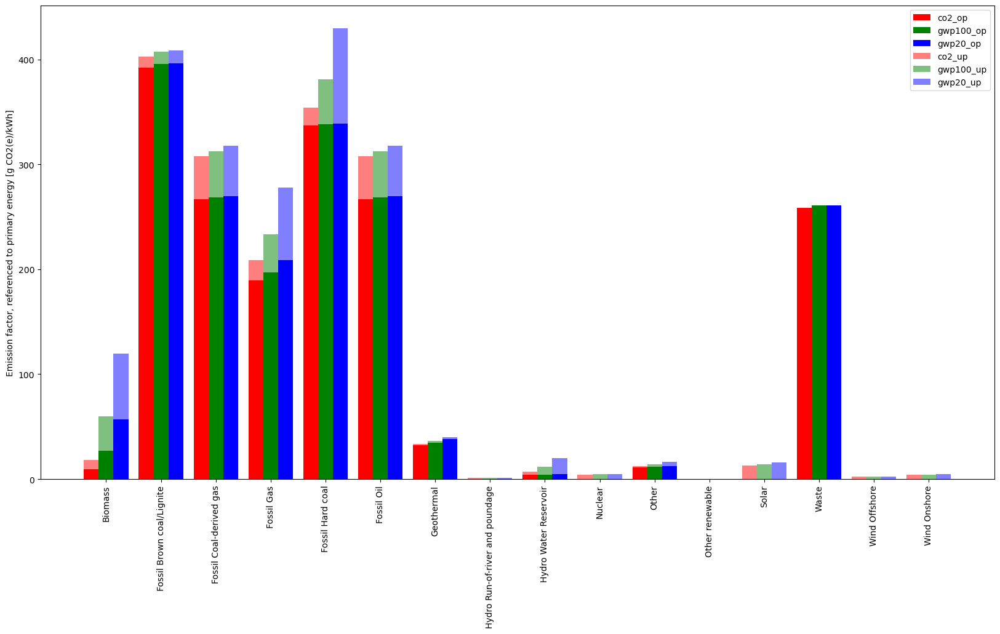

In [7]:
# visualize the results - compare CO2, GWP100 and GWP20 emission factors
# note: values are averaged across years for operational (op) and upstream (up) emission factors

# Group the data by Production Type and calculate the average of the columns
df_grouped = df.groupby("Production Type").mean()

# Initialize two empty dataframes
df_plot_op = pd.DataFrame()
df_plot_up = pd.DataFrame()

# define categories
categories = ['co2', 'gwp100', 'gwp20']

# Iterate over the categories
for cat in categories:
    # Get all columns that contain the category and _op
    cols_op = [col for col in df_grouped.columns if (cat in col) and ('_op' in col)]
    
    # Get all columns that contain the category and _up
    cols_up = [col for col in df_grouped.columns if (cat in col) and ('_up' in col)]
    
    # Calculate the average of the columns and assign it to df_plot_op
    df_plot_op[cat] = df_grouped[cols_op].mean(axis=1)
    
    # Calculate the average of the columns and assign it to df_plot_up
    df_plot_up[cat] = df_grouped[cols_up].mean(axis=1)

# Transpose the dataframes
df_plot_op = df_plot_op.T
df_plot_up = df_plot_up.T

# Get the number of production types
N = len(df_plot_op.columns)

# The x locations for the groups
ind = np.arange(N)

# The width of the bars
width = 0.27

fig, ax = plt.subplots(figsize=(20,10))

# Add some text for labels, title, and axes ticks
ax.set_ylabel('Emission factor, referenced to primary energy [g CO2(e)/kWh]')
ax.set_xticks(ind+width)
ax.set_xticklabels(df_plot_op.columns, rotation='vertical')

# Plot the data for _op
rects1_op = ax.bar(ind, df_plot_op.iloc[0], width, color='r')
rects2_op = ax.bar(ind+width, df_plot_op.iloc[1], width, color='g')
rects3_op = ax.bar(ind+width*2, df_plot_op.iloc[2], width, color='b')

# Plot the data for _up, stacked on top of the _op data
rects1_up = ax.bar(ind, df_plot_up.iloc[0], width, bottom=df_plot_op.iloc[0], color='r', alpha=0.5)
rects2_up = ax.bar(ind+width, df_plot_up.iloc[1], width, bottom=df_plot_op.iloc[1], color='g', alpha=0.5)
rects3_up = ax.bar(ind+width*2, df_plot_up.iloc[2], width, bottom=df_plot_op.iloc[2], color='b', alpha=0.5)

# Add a legend
ax.legend((rects1_op[0], rects2_op[0], rects3_op[0], rects1_up[0], rects2_up[0], rects3_up[0]), 
           [cat + '_op' for cat in df_plot_op.index] + [cat + '_up' for cat in df_plot_up.index])

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_pe_co2_gwp100_gwp20' + '.png')
#plt.savefig(plot_path)

plt.show()

## System boundaries
Here, we expand the previous dataframe with emission factors to calculate emission factors for the whole life cycle (LC), from operational (op) and upstream (up) emission factors.

### Import

In [8]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp.pkl')

# Load the pickle file into a DataFrame
df = pd.read_pickle(pickle_path)

### Calculate

In [9]:
# Single step: calculate lc-ef from op-ef and up-ef (lc = op + up)

# Find all the unique prefixes in the columns
prefixes = set()
for col in df.columns:
    match = re.match(r'(ef_pe_\w+)_op_\w+', col)
    if match:
        prefixes.add(match.group(1))

# For each prefix, create a new column in the dataframe that is the sum of the _op and _up columns
for prefix in prefixes:
    for suffix in ['el_map', 'chp_map', 'el_ap', 'chp_ap']:
        op_column = f'{prefix}_op_{suffix}'
        up_column = f'{prefix}_up_{suffix}'
        lc_column = f'{prefix}_lc_{suffix}'
        if op_column in df.columns and up_column in df.columns:
            df[lc_column] = df[op_column] + df[up_column]

# Drop the upstream emission columns - not needed anymore
columns_to_drop = df.columns[df.columns.str.contains('_up')]
df = df.drop(columns_to_drop, axis=1)
           

# show result
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_gwp100_op_el_ap,ef_pe_gwp20_op_el_ap,ef_pe_gwp100_op_el_map,ef_pe_gwp20_op_el_map,...,ef_pe_gwp100_lc_el_ap,ef_pe_gwp100_lc_chp_ap,ef_pe_gwp20_lc_el_map,ef_pe_gwp20_lc_chp_map,ef_pe_gwp20_lc_el_ap,ef_pe_gwp20_lc_chp_ap,ef_pe_co2_lc_el_map,ef_pe_co2_lc_chp_map,ef_pe_co2_lc_el_ap,ef_pe_co2_lc_chp_ap
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,396.9848,397.0914,394.21614,394.327781,...,407.5961,407.5961,409.098902,413.855942,408.0758,408.0758,401.439827,390.484502,403.796,403.796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,0.0000,0.0000,0.00000,0.000000,...,2.6426,0.0000,2.855800,0.000000,2.8558,0.0000,2.531000,0.000000,2.531,0.000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000


### Check
We want to quickly check that the life cycle emission factors are indeed the sum of the operational and the upstream emission factor, as intended.

In [10]:
# Extract column names
column_names = df.columns

# Initialize an empty DataFrame for storing the results
comparison_df = pd.DataFrame()

# Iterate over each type (co2, ch4, n2o, gwp100, gwp20)
for t in ["co2", "gwp100", "gwp20"]:
    # Iterate over each process type (el, chp)
    for p in ["el", "chp"]:
        # Define column names for op, up, lc
        op_col_map = f'ef_pe_{t}_op_{p}_map'
        up_col_map = f'ef_pe_{t}_up_{p}_map'
        lc_col_map = f'ef_pe_{t}_lc_{p}_map'
        
        op_col_ap = f'ef_pe_{t}_op_{p}_ap'
        up_col_ap = f'ef_pe_{t}_up_{p}_ap'
        lc_col_ap = f'ef_pe_{t}_lc_{p}_ap'

        # Perform the check for both map and ap columns, if they exist in the df
        if op_col_map in column_names and up_col_map in column_names and lc_col_map in column_names:
            comparison_df[f'{t}_{p}_map_check'] = np.isclose(df[op_col_map] + df[up_col_map], df[lc_col_map], equal_nan=True)
        if op_col_ap in column_names and up_col_ap in column_names and lc_col_ap in column_names:
            comparison_df[f'{t}_{p}_ap_check'] = np.isclose(df[op_col_ap] + df[up_col_ap], df[lc_col_ap], equal_nan=True)

# Check if all values in the comparison DataFrame are True
result = comparison_df.all().all()

print("Are all lc columns the sum of the corresponding op and up columns?: ", result)

Are all lc columns the sum of the corresponding op and up columns?:  True


### Save

In [11]:
# Drop the upstream emission columns - not needed anymore
columns_to_drop = df.columns[df.columns.str.contains('_up')]
df = df.drop(columns_to_drop, axis=1)
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_gwp100_op_el_ap,ef_pe_gwp20_op_el_ap,ef_pe_gwp100_op_el_map,ef_pe_gwp20_op_el_map,...,ef_pe_gwp100_lc_el_ap,ef_pe_gwp100_lc_chp_ap,ef_pe_gwp20_lc_el_map,ef_pe_gwp20_lc_chp_map,ef_pe_gwp20_lc_el_ap,ef_pe_gwp20_lc_chp_ap,ef_pe_co2_lc_el_map,ef_pe_co2_lc_chp_map,ef_pe_co2_lc_el_ap,ef_pe_co2_lc_chp_ap
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,380.8894,380.8894,429.712200,429.712200,429.7122,429.7122,353.968000,353.968000,353.968,353.968
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,396.9848,397.0914,394.21614,394.327781,...,407.5961,407.5961,409.098902,413.855942,408.0758,408.0758,401.439827,390.484502,403.796,403.796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,0.0000,0.0000,0.00000,0.000000,...,2.6426,0.0000,2.855800,0.000000,2.8558,0.0000,2.531000,0.000000,2.531,0.000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,23.6016,0.0000,40.337800,0.000000,40.3378,0.0000,14.568000,0.000000,14.568,0.000


In [12]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp_lc.pkl')

# Save the dataframe to a pickle file
df.to_pickle(pickle_path)

## Co-generation of heat
Here, we want to take into account that the emission factor changes based on the allocation principle in combined heat and power (CHP) plants.

In [13]:
# We calculate the ef for six different allocation principles:
# el100: all emissions are allocated to electricity
# th100: for CHP units, all emissions are allocated to heat, for EL units, all emissions are allocated to electricity
# en: emissions are allocated according to their energy share (Calorific method)
# ex: emissions are allocated to their exergy share (Carnot method)
# iea: substitution method for alternative heat source with efficiency of 0.9 (method used by the IEA)
# uba: substition method for alternative hear source with efficiency of 0.8 and alternative electricity source with efficiency of 0.4 (method used by UBA)

# the resulting emission factors are calculated as follows:
# ef_el100 = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp))
# ef_th100 = (ef_pe_el*pe_el / (gep_el + gep_chp))
# ef_en = (ef_pe_el*pe_el + ef_pe_chp*(gep_chp/(gep_chp + ghp)*pe_chp)) / (gep_el + gep_chp)
# ef_ex = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp + (1 - T_0/T)*ghp))
# ef_iea = (ef_pe_el*pe_el + ef_pe_chp*(pe_chp - ghp/eta_th)) / (gep_el + gep_chp)
# ef_uba = (ef_pe_el*pe_el + ef_pe_chp*pe_chp) / (gep_el + gep_chp + (et_ref_el/eta_ref_th)*ghp))

### Import

In [14]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp_lc.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_pe = pd.read_pickle(pickle_path)
pe_gep_nep = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef_pe = ef_pe.replace(np.nan, 0.0)
pe_gep_nep = pe_gep_nep.replace(np.nan, 0.0)

# change data type
ef_pe['Year'] = ef_pe['Year'].astype('i4')
pe_gep_nep['Year'] = pe_gep_nep['Year'].astype('i4')

### Calculate

In [15]:
# step 1: calculate ef for the allocation method "el100"

# ef_el100 = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp))

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_el100 = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_el100'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep[['Year', 'Production Type', pe_el_col, pe_chp_col, gep_el_col, gep_chp_col]],
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_el100[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]) / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_el100[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_el100 = ef_gep_el100.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_el100 # unit: g/kWh

,ef_gep_co2_op_map_el100,Year,Production Type,ef_gep_co2_op_ap_el100,ef_gep_co2_lc_map_el100,ef_gep_co2_lc_ap_el100,ef_gep_gwp100_op_map_el100,ef_gep_gwp100_op_ap_el100,ef_gep_gwp100_lc_map_el100,ef_gep_gwp100_lc_ap_el100,ef_gep_gwp20_op_map_el100,ef_gep_gwp20_op_ap_el100,ef_gep_gwp20_lc_map_el100,ef_gep_gwp20_lc_ap_el100
0,848.435220,2018,Fossil Hard coal,825.361919,890.546268,866.327751,851.463351,828.307699,958.277680,932.217199,851.999740,828.829501,1081.110711,1051.709770
1,893.036876,2019,Fossil Hard coal,826.133964,937.361673,867.138116,896.224194,829.082500,1008.653679,933.089196,896.788781,829.604789,1137.943958,1052.693541
2,908.252647,2020,Fossil Hard coal,819.900666,953.332660,860.595437,911.494271,822.826956,1025.839355,926.048907,912.068477,823.345304,1157.332512,1044.750820
3,873.306262,2021,Fossil Hard coal,817.176071,916.651754,857.735609,876.423160,820.092635,986.368645,922.971572,876.975272,820.609262,1112.802405,1041.279030
4,1000.891702,2018,Fossil Brown coal/Lignite,1017.513951,1028.550917,1044.455904,1009.783897,1026.838102,1041.727018,1054.285216,1010.073179,1027.113833,1050.122951,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [16]:
# step 2: calculate ef for the allocation method "th100"

# ef_th100 = (ef_pe_el*pe_el / (gep_el + gep_chp))

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_th100 = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_th100'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            #ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            #pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep[['Year', 'Production Type', pe_el_col, gep_el_col, gep_chp_col]],
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_th100[new_col] = merged_df[ef_el_col]*merged_df[pe_el_col] / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_th100[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_th100 = ef_gep_th100.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_th100 # unit: g/kWh

,ef_gep_co2_op_map_th100,Year,Production Type,ef_gep_co2_op_ap_th100,ef_gep_co2_lc_map_th100,ef_gep_co2_lc_ap_th100,ef_gep_gwp100_op_map_th100,ef_gep_gwp100_op_ap_th100,ef_gep_gwp100_lc_map_th100,ef_gep_gwp100_lc_ap_th100,ef_gep_gwp20_op_map_th100,ef_gep_gwp20_op_ap_th100,ef_gep_gwp20_lc_map_th100,ef_gep_gwp20_lc_ap_th100
0,661.272361,2018,Fossil Hard coal,510.344636,694.093809,535.674969,663.632494,512.166095,746.883827,576.416280,664.050556,512.488740,842.620174,650.301919
1,655.941937,2019,Fossil Hard coal,542.044601,688.498815,568.948324,658.283045,543.979200,740.863300,612.220273,658.697737,544.321886,835.827930,690.695305
2,653.413560,2020,Fossil Hard coal,459.218702,685.844945,482.011463,655.745643,460.857689,738.007587,518.671340,656.158738,461.148012,832.606169,585.155172
3,655.237945,2021,Fossil Hard coal,441.357456,687.759882,463.263696,657.576540,442.932695,740.068167,498.497692,657.990788,443.211726,834.930875,562.395646
4,954.589379,2018,Fossil Brown coal/Lignite,683.466222,980.767314,701.563187,963.118952,689.729273,992.722539,708.165557,963.391704,689.914482,999.479384,708.998997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [17]:
# step 3: calculate ef for the allocation method "en"

# ef_en = (ef_pe_el*pe_el + ef_pe_chp*(gep_chp/(gep_chp + ghp)*pe_chp)) / (gep_el + gep_chp)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_en = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_en'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_en[new_col] = np.where((merged_df[gep_chp_col] == 0) & (merged_df[ghp_chp_col] == 0),
                                              merged_df[ef_el_col]*merged_df[pe_el_col] / merged_df[gep_el_col],
                                              (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]*(merged_df[gep_chp_col]/(merged_df[gep_chp_col] + merged_df[ghp_chp_col])))/ (merged_df[gep_el_col] + merged_df[gep_chp_col]))
                ef_gep_en[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_en = ef_gep_en.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_en # unit: g/kWh

,ef_gep_co2_op_map_en,Year,Production Type,ef_gep_co2_op_ap_en,ef_gep_co2_lc_map_en,ef_gep_co2_lc_ap_en,ef_gep_gwp100_op_map_en,ef_gep_gwp100_op_ap_en,ef_gep_gwp100_lc_map_en,ef_gep_gwp100_lc_ap_en,ef_gep_gwp20_op_map_en,ef_gep_gwp20_op_ap_en,ef_gep_gwp20_lc_map_en,ef_gep_gwp20_lc_ap_en
0,716.497814,2018,Fossil Hard coal,825.361919,752.060309,866.327751,719.055050,828.307699,809.259029,932.217199,719.508027,828.829501,912.990694,1051.709770
1,725.311052,2019,Fossil Hard coal,826.133964,761.310982,867.138116,727.899743,829.082500,819.213271,933.089196,728.358292,829.604789,924.220881,1052.693541
2,734.264472,2020,Fossil Hard coal,819.900666,770.708794,860.595437,736.885119,822.826956,829.325844,926.048907,737.349328,823.345304,935.629694,1044.750820
3,723.506283,2021,Fossil Hard coal,817.176071,759.416635,857.735609,726.088533,820.092635,817.174848,922.971572,726.545940,820.609262,921.921171,1041.279030
4,969.042754,2018,Fossil Brown coal/Lignite,1017.513951,995.683074,1044.455904,977.685521,1026.838102,1008.019398,1054.285216,977.963432,1027.113833,1015.287889,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [18]:
# step 4: calculate ef for the allocation method "ex"

# ef_ex = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp + (1 - T_0/T)*ghp))

# assumptions: T_0 = 282 K (9°C), T = 363 K (90°C)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_ex = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_ex'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_ex[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col])/ (merged_df[gep_el_col] + merged_df[gep_chp_col] + (1 - (282/363))*merged_df[ghp_chp_col])
                ef_gep_ex[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_ex = ef_gep_ex.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_ex # unit: g/kWh

,ef_gep_co2_op_map_ex,Year,Production Type,ef_gep_co2_op_ap_ex,ef_gep_co2_lc_map_ex,ef_gep_co2_lc_ap_ex,ef_gep_gwp100_op_map_ex,ef_gep_gwp100_op_ap_ex,ef_gep_gwp100_lc_map_ex,ef_gep_gwp100_lc_ap_ex,ef_gep_gwp20_op_map_ex,ef_gep_gwp20_op_ap_ex,ef_gep_gwp20_lc_map_ex,ef_gep_gwp20_lc_ap_ex
0,790.077619,2018,Fossil Hard coal,825.361919,829.292159,866.327751,792.897467,828.307699,892.364826,932.217199,793.396962,828.829501,1006.749079,1051.709770
1,816.382673,2019,Fossil Hard coal,826.133964,856.902832,867.138116,819.296406,829.082500,922.075458,933.089196,819.812531,829.604789,1040.268050,1052.693541
2,828.791622,2020,Fossil Hard coal,819.900666,869.927684,860.595437,831.749644,822.826956,936.090928,926.048907,832.273614,823.345304,1056.080038,1044.750820
3,806.594836,2021,Fossil Hard coal,817.176071,846.629187,857.735609,809.473635,820.092635,911.020440,922.971572,809.983572,820.609262,1027.795989,1041.279030
4,985.264928,2018,Fossil Brown coal/Lignite,1017.513951,1012.492303,1044.455904,994.018290,1026.838102,1025.462688,1054.285216,994.303055,1027.113833,1033.727536,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [19]:
# step 5: calculate ef for the allocation method "iea"

# ef_iea = (ef_pe_el*pe_el + ef_pe_chp*(pe_chp - ghp/eta_th)) / (gep_el + gep_chp)

# assumptions: eta_th = 0.9 (prescribed by IEA)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_iea = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_iea'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_iea[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*(merged_df[pe_chp_col] - (merged_df[ghp_chp_col] / 0.9))) / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_iea[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_iea = ef_gep_iea.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_iea # unit: g/kWh

,ef_gep_co2_op_map_iea,Year,Production Type,ef_gep_co2_op_ap_iea,ef_gep_co2_lc_map_iea,ef_gep_co2_lc_ap_iea,ef_gep_gwp100_op_map_iea,ef_gep_gwp100_op_ap_iea,ef_gep_gwp100_lc_map_iea,ef_gep_gwp100_lc_ap_iea,ef_gep_gwp20_op_map_iea,ef_gep_gwp20_op_ap_iea,ef_gep_gwp20_lc_map_iea,ef_gep_gwp20_lc_ap_iea
0,724.403442,2018,Fossil Hard coal,825.361919,760.358324,866.327751,726.988894,828.307699,818.188157,932.217199,727.446868,828.829501,923.064367,1051.709770
1,735.367448,2019,Fossil Hard coal,826.133964,771.866515,867.138116,737.992031,829.082500,830.571616,933.089196,738.456937,829.604789,937.035150,1052.693541
2,747.257009,2020,Fossil Hard coal,819.900666,784.346200,860.595437,749.924027,822.826956,844.000456,926.048907,750.396450,823.345304,952.185313,1044.750820
3,734.422942,2021,Fossil Hard coal,817.176071,770.875130,857.735609,737.044155,820.092635,829.504830,922.971572,737.508464,820.609262,935.831623,1041.279030
4,971.008777,2018,Fossil Brown coal/Lignite,1017.513951,997.711992,1044.455904,979.666940,1026.838102,1010.100155,1054.285216,979.945554,1027.113833,1017.438242,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [20]:
# step 6: calculate ef for the allocation method "uba"

# ef_uba = (ef_pe_el*pe_el + ef_pe_chp*pe_chp) / (gep_el + gep_chp + (eta_ref_el/eta_ref_th)*ghp))

# assumptions: eta_ref_el = 0.4, eta_ref_th = 0.8 (prescribed by UBA)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_uba = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_uba'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_uba[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]) / (merged_df[gep_el_col] + merged_df[gep_chp_col] + (0.4 / 0.8)*merged_df[ghp_chp_col])
                ef_gep_uba[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_uba = ef_gep_uba.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_uba # unit: g/kWh

,ef_gep_co2_op_map_uba,Year,Production Type,ef_gep_co2_op_ap_uba,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,727.953081,2018,Fossil Hard coal,825.361919,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,737.806626,2019,Fossil Hard coal,826.133964,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,747.635978,2020,Fossil Hard coal,819.900666,784.743979,860.595437,750.304349,822.826956,844.428489,926.048907,750.777012,823.345304,952.668212,1044.750820
3,736.764609,2021,Fossil Hard coal,817.176071,773.333022,857.735609,739.394179,820.092635,832.149660,922.971572,739.859969,820.609262,938.815470,1041.279030
4,966.541566,2018,Fossil Brown coal/Lignite,1017.513951,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


In [21]:
# step 7: combine all dataframes
ef_gep_all = pd.merge(ef_gep_el100, ef_gep_th100, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_en, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_ex, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_iea, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_uba, on=['Year', 'Production Type'])

# show result
ef_gep_all # unit: g/kWh

,ef_gep_co2_op_map_el100,Year,Production Type,ef_gep_co2_op_ap_el100,ef_gep_co2_lc_map_el100,ef_gep_co2_lc_ap_el100,ef_gep_gwp100_op_map_el100,ef_gep_gwp100_op_ap_el100,ef_gep_gwp100_lc_map_el100,ef_gep_gwp100_lc_ap_el100,...,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,848.435220,2018,Fossil Hard coal,825.361919,890.546268,866.327751,851.463351,828.307699,958.277680,932.217199,...,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,893.036876,2019,Fossil Hard coal,826.133964,937.361673,867.138116,896.224194,829.082500,1008.653679,933.089196,...,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,908.252647,2020,Fossil Hard coal,819.900666,953.332660,860.595437,911.494271,822.826956,1025.839355,926.048907,...,784.743979,860.595437,750.304349,822.826956,844.428489,926.048907,750.777012,823.345304,952.668212,1044.750820
3,873.306262,2021,Fossil Hard coal,817.176071,916.651754,857.735609,876.423160,820.092635,986.368645,922.971572,...,773.333022,857.735609,739.394179,820.092635,832.149660,922.971572,739.859969,820.609262,938.815470,1041.279030
4,1000.891702,2018,Fossil Brown coal/Lignite,1017.513951,1028.550917,1044.455904,1009.783897,1026.838102,1041.727018,1054.285216,...,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,...,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,...,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,...,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905268,2020,Hydro Water Reservoir,8.025000,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,...,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


### Check

In [22]:
# We expect the results for all "real" allocation methods to be in between the extremes, el100 and th100

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
methods = ['en', 'ex', 'iea', 'uba']

# Define the error term
error = 0.01

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_all.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the base column name
            base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}'

            # Calculate the column names for el100 and th100
            el100_col = f'{base_col}_el100'
            th100_col = f'{base_col}_th100'

            # Loop over all methods
            for method in methods:
                # Calculate the column name for the current method
                method_col = f'{base_col}_{method}'

                # Check if columns exist before comparison
                if el100_col in grouped_means.columns and th100_col in grouped_means.columns and method_col in grouped_means.columns:
                    # Check if the values in the method column are between the values in the el100 and th100 columns, allowing for a small error
                    check = grouped_means[method_col].between(grouped_means[th100_col] - error, grouped_means[el100_col] + error)

                    # Print the results
                    if check.all():
                        print(f"All values in {method_col} for each 'Production Type' are within the range of {th100_col} and {el100_col}, considering an error of {error}")
                    else:
                        print(f"NOT all values in {method_col} for each 'Production Type' are within the range of {th100_col} and {el100_col}, considering an error of {error}")


All values in ef_gep_co2_op_map_en for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_ex for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_iea for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_uba for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_ap_en for each 'Production Type' are within the range of ef_gep_co2_op_ap_th100 and ef_gep_co2_op_ap_el100, considering an error of 0.01
All values in ef_gep_co2_op_ap_ex for each 'Production Type' are within the range of ef_gep_co2_op_ap_th100 and ef_gep_co2_op_ap_el100, considering an error of 0

### Save

In [23]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_gep_metric_sysbound_gridcon_allocation.pkl')

# Save the dataframe to a pickle file
ef_gep_all.to_pickle(pickle_path)

### Plot

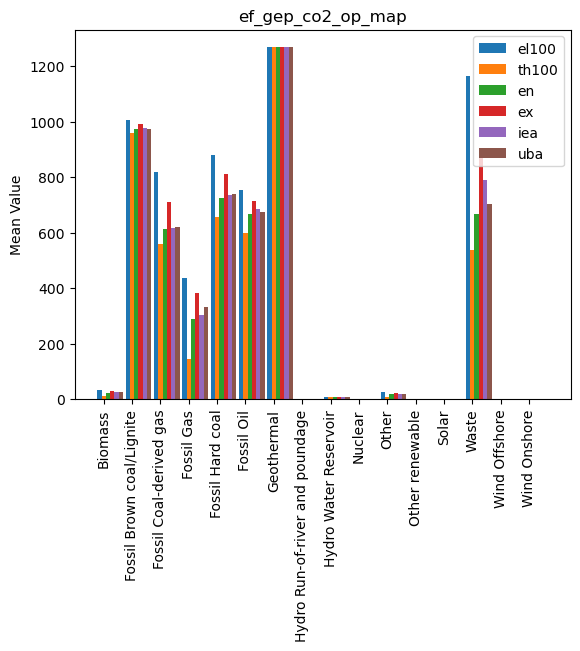

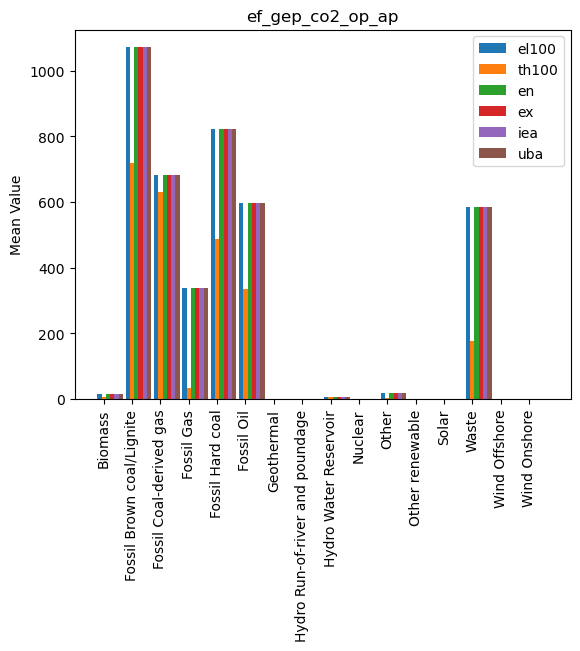

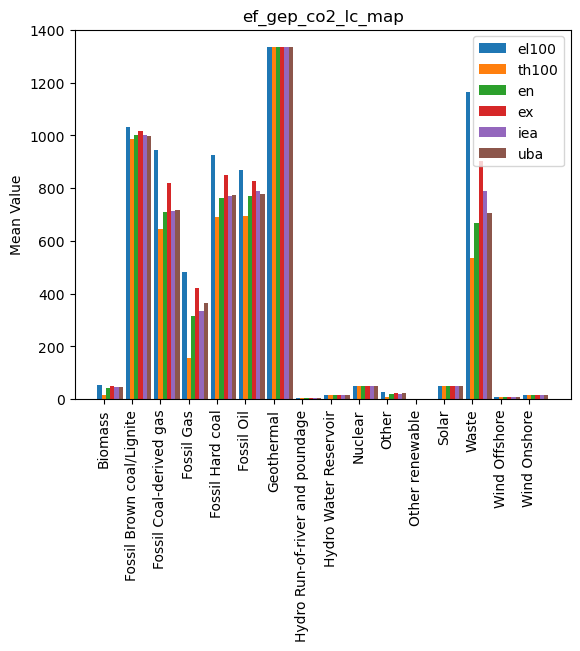

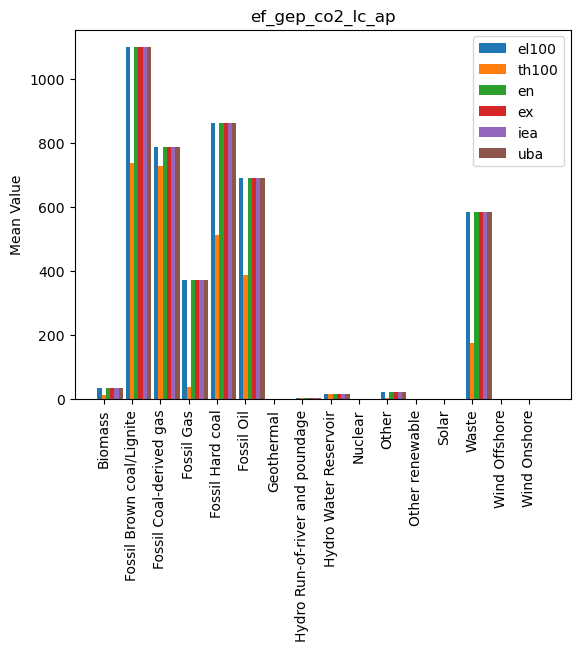

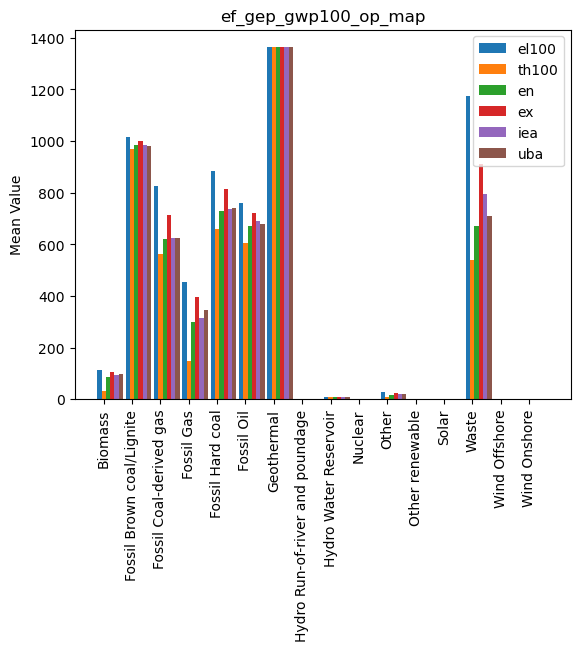

...

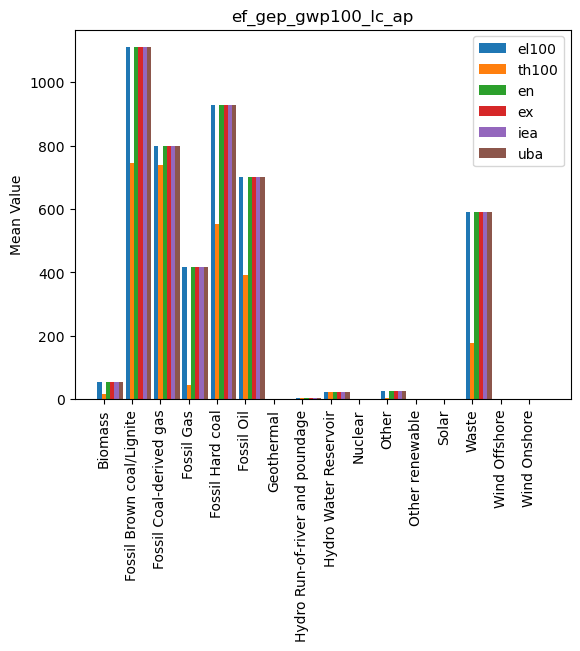

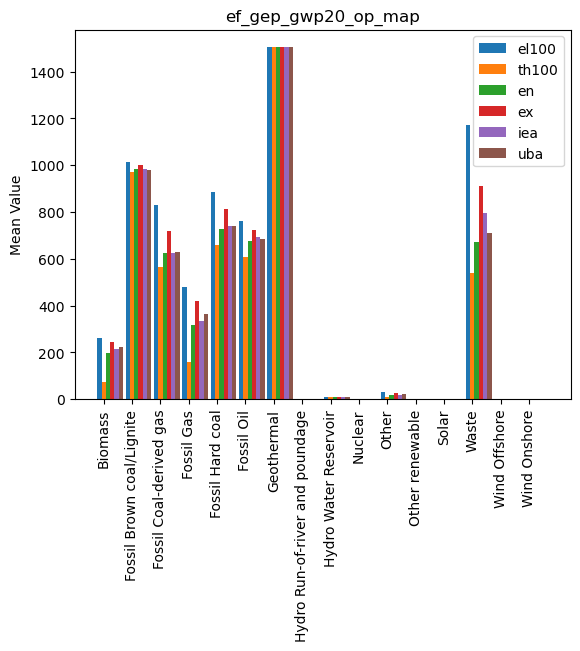

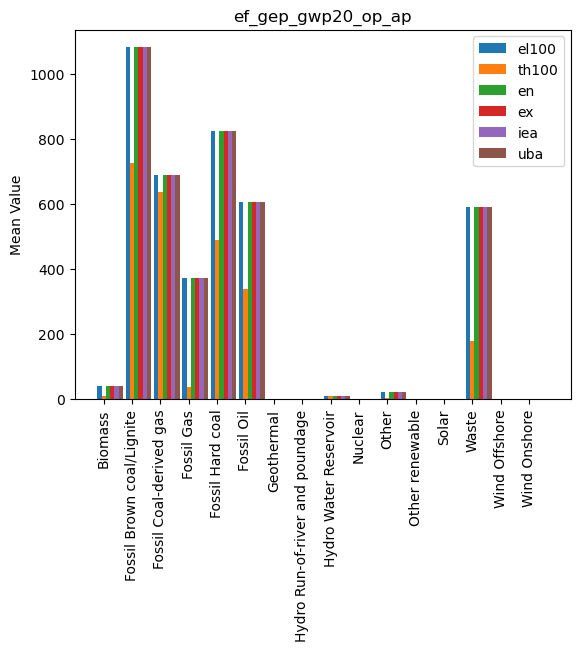

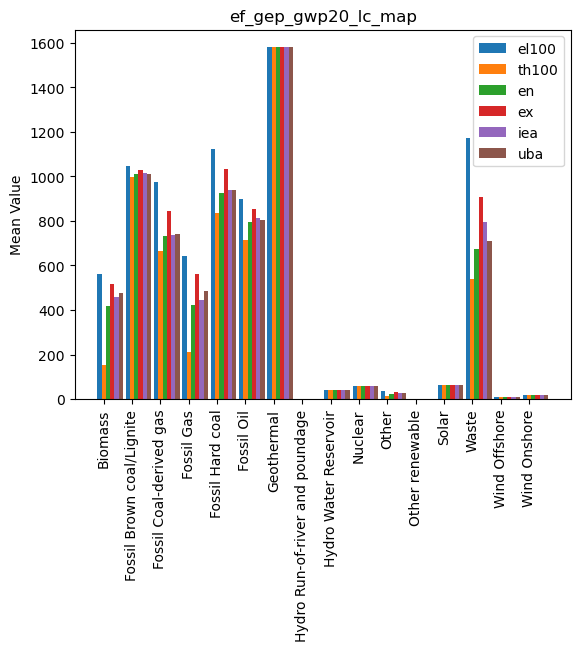

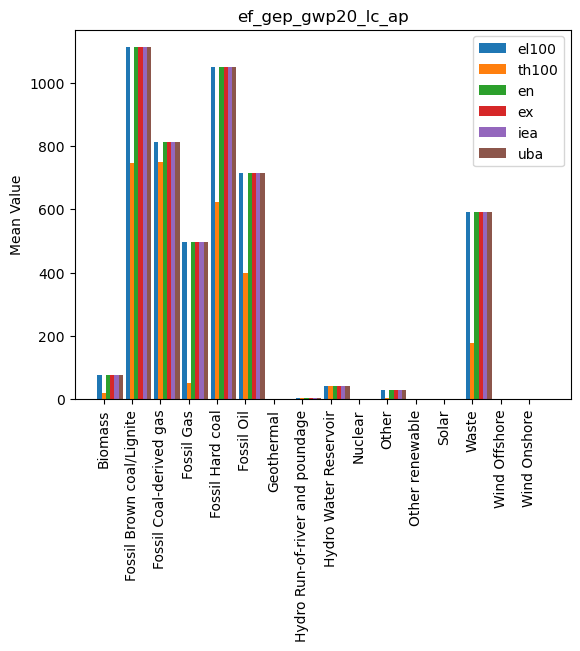

In [24]:
# Visually confirm the results from the check

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
methods = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_all.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the base column name
            base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}'

            # Prepare a list to store the mean values for each method
            mean_values = []

            # Loop over all methods
            for method in methods:
                # Calculate the column name for the current method
                method_col = f'{base_col}_{method}'

                # Check if column exists before getting the mean value
                if method_col in grouped_means.columns:
                    # Get the mean value for the current method and add it to the list
                    mean_values.append(grouped_means[method_col].values)

            # Prepare for the bar chart
            bar_width = 0.15
            r = np.arange(len(grouped_means.index))

            # Create the bar chart
            for i, values in enumerate(mean_values):
                plt.bar(r + i * bar_width, values, width=bar_width, label=methods[i])

            plt.xticks(r + bar_width, grouped_means.index, rotation=90)
            plt.title(f'{base_col}')
            plt.ylabel('Mean Value')
            plt.legend()
            
            # Modify the plot save path to include metric, sysbound, and gridcon
            plot_filename = f'ef_pe_cogen_comp_{metric}_{sysbound}_{gridcon}.png'
            plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', plot_filename)
            #plt.savefig(plot_path)

            plt.show()
            plt.close()  # Close the current plot to free up memory

## Auxiliary consumption
All the EF values calculated above are referenced to gross electricity production (GEP). Now we calculate the EF for net electricity production (NEP), thus effectively taking into account the auxiliary consumption of the power plants.

In [25]:
# ef_nep = gep / nep * ef_gep

### Import

In [26]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_gep_metric_sysbound_gridcon_allocation.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_gep = pd.read_pickle(pickle_path)
pe_gep_nep = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef_gep = ef_gep.replace(np.nan, 0.0)
pe_gep_nep = pe_gep_nep.replace(np.nan, 0.0)

### Calculate

In [27]:
# step 1: calculate ef_nep
# ef_nep = gep / nep * ef_gep

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_gep_nep = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_nep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Calculate the column names in the input DataFrames
                ef_gep_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_{allocation}'
                gep_el_col = f'gep_el_{gridcon}'
                gep_chp_col = f'gep_chp_{gridcon}'
                nep_el_col = f'nep_el_{gridcon}'
                nep_chp_col = f'nep_chp_{gridcon}'

                # Check if columns exist in their respective dataframes before calculation
                if ef_gep_col in ef_gep.columns \
                and gep_el_col in pe_gep_nep.columns \
                and gep_chp_col in pe_gep_nep.columns \
                and nep_el_col in pe_gep_nep.columns \
                and nep_chp_col in pe_gep_nep.columns:
                    # Merge dataframes
                    merged_df = pd.merge(ef_gep,
                                         pe_gep_nep,
                                         on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_gep_nep[new_col] = merged_df[ef_gep_col]*(merged_df[gep_el_col] + merged_df[gep_chp_col]) / (merged_df[nep_el_col] + merged_df[nep_chp_col])
                    ef_gep_nep[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_nep = ef_gep_nep.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_nep # unit: g/kWh

,ef_nep_co2_op_map_el100,Year,Production Type,ef_nep_co2_op_map_th100,ef_nep_co2_op_map_en,ef_nep_co2_op_map_ex,ef_nep_co2_op_map_iea,ef_nep_co2_op_map_uba,ef_nep_co2_op_ap_el100,ef_nep_co2_op_ap_th100,...,ef_nep_gwp20_lc_map_en,ef_nep_gwp20_lc_map_ex,ef_nep_gwp20_lc_map_iea,ef_nep_gwp20_lc_map_uba,ef_nep_gwp20_lc_ap_el100,ef_nep_gwp20_lc_ap_th100,ef_nep_gwp20_lc_ap_en,ef_nep_gwp20_lc_ap_ex,ef_nep_gwp20_lc_ap_iea,ef_nep_gwp20_lc_ap_uba
0,914.086261,2018,Fossil Hard coal,712.440933,771.939674,851.213009,780.457032,784.281338,871.438359,538.835003,...,983.636971,1084.650283,994.490134,999.363222,1110.422247,686.605505,1110.422247,1110.422247,1110.422247,1110.422247
1,960.893077,2019,Fossil Hard coal,705.782799,780.422833,878.414408,791.243350,793.867866,878.910195,576.672243,...,994.446557,1119.311413,1008.234501,1011.578766,1119.943165,734.819258,1119.943165,1119.943165,1119.943165,1119.943165
2,974.642296,2020,Fossil Hard coal,701.175487,787.936279,889.372987,801.878518,802.285189,867.177381,485.697948,...,1004.020496,1133.275280,1021.786265,1022.304462,1104.992735,618.896106,1104.992735,1104.992735,1104.992735,1104.992735
3,939.565351,2021,Fossil Hard coal,704.951856,778.399817,867.792426,790.144740,792.664073,860.460106,464.735199,...,991.868748,1105.776451,1006.834608,1010.044844,1096.433310,592.184517,1096.433310,1096.433310,1096.433310,1096.433310
4,1081.114762,2018,Fossil Brown coal/Lignite,1031.101234,1046.713070,1064.235477,1048.836672,1044.011407,1074.695590,721.875247,...,1096.664825,1116.582440,1098.987533,1095.363601,1114.843822,748.842897,1114.843822,1114.843822,1114.843822,1114.843822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.845466,2.845466,2.845466,2.845466,3.038085,3.038085,3.038085,3.038085,3.038085,3.038085
60,7.991448,2018,Hydro Water Reservoir,7.991448,7.991448,7.991448,7.991448,7.991448,8.213824,8.213824,...,40.169152,40.169152,40.169152,40.169152,41.286925,41.286925,41.286925,41.286925,41.286925,41.286925
61,7.983994,2019,Hydro Water Reservoir,7.983994,7.983994,7.983994,7.983994,7.983994,8.192188,8.192188,...,40.131681,40.131681,40.131681,40.131681,41.178171,41.178171,41.178171,41.178171,41.178171,41.178171
62,7.974105,2020,Hydro Water Reservoir,7.974105,7.974105,7.974105,7.974105,7.974105,8.121687,8.121687,...,40.081977,40.081977,40.081977,40.081977,40.823798,40.823798,40.823798,40.823798,40.823798,40.823798


In [28]:
# step 2: combine all dataframes
ef_gep_nep = pd.merge(ef_gep_nep, ef_gep, on=['Year', 'Production Type'])

# show result
ef_gep_nep # unit: g/kWh

,ef_nep_co2_op_map_el100,Year,Production Type,ef_nep_co2_op_map_th100,ef_nep_co2_op_map_en,ef_nep_co2_op_map_ex,ef_nep_co2_op_map_iea,ef_nep_co2_op_map_uba,ef_nep_co2_op_ap_el100,ef_nep_co2_op_ap_th100,...,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,914.086261,2018,Fossil Hard coal,712.440933,771.939674,851.213009,780.457032,784.281338,871.438359,538.835003,...,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,960.893077,2019,Fossil Hard coal,705.782799,780.422833,878.414408,791.243350,793.867866,878.910195,576.672243,...,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,974.642296,2020,Fossil Hard coal,701.175487,787.936279,889.372987,801.878518,802.285189,867.177381,485.697948,...,784.743979,860.595437,750.304349,822.826956,844.428489,926.048907,750.777012,823.345304,952.668212,1044.750820
3,939.565351,2021,Fossil Hard coal,704.951856,778.399817,867.792426,790.144740,792.664073,860.460106,464.735199,...,773.333022,857.735609,739.394179,820.092635,832.149660,922.971572,739.859969,820.609262,938.815470,1041.279030
4,1081.114762,2018,Fossil Brown coal/Lignite,1031.101234,1046.713070,1064.235477,1048.836672,1044.011407,1074.695590,721.875247,...,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.500910,2.531000,0.000000,0.000000,2.611183,2.642600,0.000000,0.000000,2.821849,2.855800
60,7.991448,2018,Hydro Water Reservoir,7.991448,7.991448,7.991448,7.991448,7.991448,8.213824,8.213824,...,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.983994,2019,Hydro Water Reservoir,7.983994,7.983994,7.983994,7.983994,7.983994,8.192188,8.192188,...,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.974105,2020,Hydro Water Reservoir,7.974105,7.974105,7.974105,7.974105,7.974105,8.121687,8.121687,...,14.350648,14.568000,8.641419,8.772300,23.249468,23.601600,9.534000,9.678400,39.735967,40.337800


### Check

In [29]:
# all nep values should be greater or equal to their corresponding gep values

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
prefixes = ['nep', 'gep']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Define the error term
error = 0.01

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_nep.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            for allocation in allocations:
                # Calculate the base column name
                base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Calculate the column names for nep
                nep_col = f'ef_nep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Check if columns exist before comparison
                if nep_col in grouped_means.columns and base_col in grouped_means.columns:
                    # Check if the values in the nep column are greater than or equal to the values in the gep column, allowing for a small error
                    check = (grouped_means[nep_col] + error) >= grouped_means[base_col]

                    # Print the results
                    if check.all():
                        print(f"All values in {nep_col} for each 'Production Type' are greater than or equal to the values in {base_col}, considering an error of {error}")
                    else:
                        print(f"NOT all values in {nep_col} for each 'Production Type' are greater than or equal to the values in {base_col}, considering an error of {error}")

All values in ef_nep_co2_op_map_el100 for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_nep_co2_op_map_th100 for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_th100, considering an error of 0.01
All values in ef_nep_co2_op_map_en for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_en, considering an error of 0.01
All values in ef_nep_co2_op_map_ex for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_ex, considering an error of 0.01
All values in ef_nep_co2_op_map_iea for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_iea, considering an error of 0.01
All values in ef_nep_co2_op_map_uba for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_uba, considering an error of 0.01
All values in ef_nep_co2_op_ap_el100 for each 'P

### Save

In [30]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_gridcon_allocation.pkl')

# Save the dataframe to a pickle file
ef_gep_nep.to_pickle(pickle_path)

### Plot

In [31]:
# maybe later

## Auto-producers
Here, we take into account that there are generation units connected to the grid (main activity producers, MAP) and not connected to the grid (autoproducers, AP). We calculate individual emission factors for the following combinations. Considering:
- emissions from MAP only, and energy flows through MAP only (_maponly)
- emissions from MAP only, and energy flows through both MAP and AP (_apenergy)
- emissions from both MAP and AP, and energy flows through MAP only (_apemissions)
- emissions from both MAP and AP, and energy flows through both MAP and AP (_mapap)

### Import

In [32]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_gridcon_allocation.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)
en = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef = ef.replace(np.nan, 0.0)
en = en.replace(np.nan, 0.0)

### Calculate

In [33]:
# step 1: calculate the ef for the first combination, _map
# explanation: for the grid ef, only the emissions and the energy flows through MAP are considered
# ef_maponly = ef_map

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_maponly = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'

                # Calculate the column names in the input DataFrames
                ef_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'

                # Check if columns exist in their respective dataframes before calculation
                if ef_col in ef.columns:
                    # Calculate the new column in the result DataFrame
                    ef_maponly[new_col] = ef[ef_col]
                    ef_maponly[['Year', 'Production Type']] = ef[['Year', 'Production Type']]

# replace nan values with zeros
ef_maponly = ef_maponly.replace(np.nan, 0.0)

# Show the new DataFrame
ef_maponly

,ef_gep_co2_op_el100_maponly,Year,Production Type,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,ef_gep_co2_op_uba_maponly,ef_gep_co2_lc_el100_maponly,ef_gep_co2_lc_th100_maponly,...,ef_nep_gwp20_op_en_maponly,ef_nep_gwp20_op_ex_maponly,ef_nep_gwp20_op_iea_maponly,ef_nep_gwp20_op_uba_maponly,ef_nep_gwp20_lc_el100_maponly,ef_nep_gwp20_lc_th100_maponly,ef_nep_gwp20_lc_en_maponly,ef_nep_gwp20_lc_ex_maponly,ef_nep_gwp20_lc_iea_maponly,ef_nep_gwp20_lc_uba_maponly
0,848.435220,2018,Fossil Hard coal,661.272361,716.497814,790.077619,724.403442,727.953081,890.546268,694.093809,...,775.182814,854.789199,783.735956,787.576329,1164.765941,907.821252,983.636971,1084.650283,994.490134,999.363222
1,893.036876,2019,Fossil Hard coal,655.941937,725.311052,816.382673,735.367448,737.806626,937.361673,688.498815,...,783.701613,882.104879,794.567590,797.203133,1224.409092,899.337186,994.446557,1119.311413,1008.234501,1011.578766
2,908.252647,2020,Fossil Hard coal,653.413560,734.264472,828.791622,747.257009,747.635978,953.332660,685.844945,...,791.246625,893.109498,805.247440,805.655819,1241.928907,893.466361,1004.020496,1133.275280,1021.786265,1022.304462
3,873.306262,2021,Fossil Hard coal,655.237945,723.506283,806.594836,734.422942,736.764609,916.651754,687.759882,...,781.670098,871.438271,793.464365,795.994282,1197.232435,898.278365,991.868748,1105.776451,1006.834608,1010.044844
4,1000.891702,2018,Fossil Brown coal/Lignite,954.589379,969.042754,985.264928,971.008777,966.541566,1028.550917,980.767314,...,1056.348754,1073.998024,1058.489746,1053.588433,1134.291973,1079.589244,1096.664825,1116.582440,1098.987533,1095.363601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.500910,2.500910,...,0.000000,0.000000,0.000000,0.000000,2.845466,2.845466,2.845466,2.845466,2.845466,2.845466
60,7.925605,2018,Hydro Water Reservoir,7.925605,7.925605,7.925605,7.925605,7.925605,14.387565,14.387565,...,9.637936,9.637936,9.637936,9.637936,40.169152,40.169152,40.169152,40.169152,40.169152,40.169152
61,7.923264,2019,Hydro Water Reservoir,7.923264,7.923264,7.923264,7.923264,7.923264,14.383316,14.383316,...,9.628945,9.628945,9.628945,9.628945,40.131681,40.131681,40.131681,40.131681,40.131681,40.131681
62,7.905268,2020,Hydro Water Reservoir,7.905268,7.905268,7.905268,7.905268,7.905268,14.350648,14.350648,...,9.617019,9.617019,9.617019,9.617019,40.081977,40.081977,40.081977,40.081977,40.081977,40.081977


In [34]:
# step 2: calculate the ef for the second combination, _apenergy
# explanation: for the grid ef, the emissions from MAP and the energy flows through both MAP and AP are considered
# ef_apenergy = 
# emissions_map / (energy_map + energy_ap) = 
# ef_map * energy_map / (energy_map + energy_ap) = 
# ef_map * (en_el_map + en_chp_map) / (en_el_map + en_chp_map + en_el_ap + en_chp_ap)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_apenergy = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'

                # Calculate the column names in the input DataFrames
                ef_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_apenergy[new_col] = merged_df[ef_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) / (merged_df[el_map_col] + merged_df[chp_map_col] + merged_df[el_ap_col] + merged_df[chp_ap_col])
                    ef_apenergy[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
ef_apenergy = ef_apenergy.replace(np.nan, 0.0)

# Show the new DataFrame
ef_apenergy

,ef_gep_co2_op_el100_apenergy,Year,Production Type,ef_gep_co2_op_th100_apenergy,ef_gep_co2_op_en_apenergy,ef_gep_co2_op_ex_apenergy,ef_gep_co2_op_iea_apenergy,ef_gep_co2_op_uba_apenergy,ef_gep_co2_lc_el100_apenergy,ef_gep_co2_lc_th100_apenergy,...,ef_nep_gwp20_op_en_apenergy,ef_nep_gwp20_op_ex_apenergy,ef_nep_gwp20_op_iea_apenergy,ef_nep_gwp20_op_uba_apenergy,ef_nep_gwp20_lc_el100_apenergy,ef_nep_gwp20_lc_th100_apenergy,ef_nep_gwp20_lc_en_apenergy,ef_nep_gwp20_lc_ex_apenergy,ef_nep_gwp20_lc_iea_apenergy,ef_nep_gwp20_lc_uba_apenergy
0,811.661982,2018,Fossil Hard coal,632.611215,685.443062,755.833740,693.006041,696.401830,851.947835,664.010101,...,740.928957,817.017686,749.104151,752.774825,1113.297144,867.706353,940.171919,1036.721644,950.545502,955.203257
1,847.638871,2019,Fossil Hard coal,622.596779,688.439478,774.881425,697.984651,700.299833,889.710393,653.498611,...,743.431881,836.778793,753.739521,756.239639,1161.494043,853.125635,943.347904,1061.796703,956.427368,959.599792
2,832.551085,2020,Fossil Hard coal,598.952471,673.064576,759.713023,684.974203,685.321586,873.873743,628.680747,...,724.416233,817.675549,737.234509,737.608396,1137.032920,818.002271,919.218765,1037.556413,935.484000,935.958428
3,815.970041,2021,Fossil Hard coal,612.218825,676.005059,753.638500,686.204994,688.392921,856.469719,642.605560,...,729.308663,813.063570,740.312872,742.673318,1117.033885,838.105736,925.426817,1031.704228,939.390164,942.385357
4,978.945444,2018,Fossil Brown coal/Lignite,933.658378,947.794839,963.661313,949.717753,945.348493,1005.998183,959.262318,...,1032.672968,1049.926667,1034.765974,1029.974514,1108.869257,1055.392572,1072.085440,1091.556644,1074.356090,1070.813381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.488339,2.488339,...,0.000000,0.000000,0.000000,0.000000,2.831905,2.831905,2.831905,2.831905,2.831905,2.831905
60,7.887114,2018,Hydro Water Reservoir,7.887114,7.887114,7.887114,7.887114,7.887114,14.317691,14.317691,...,9.591821,9.591821,9.591821,9.591821,39.976954,39.976954,39.976954,39.976954,39.976954,39.976954
61,7.884407,2019,Hydro Water Reservoir,7.884407,7.884407,7.884407,7.884407,7.884407,14.312778,14.312778,...,9.582330,9.582330,9.582330,9.582330,39.937396,39.937396,39.937396,39.937396,39.937396,39.937396
62,7.870325,2020,Hydro Water Reservoir,7.870325,7.870325,7.870325,7.870325,7.870325,14.287214,14.287214,...,9.574649,9.574649,9.574649,9.574649,39.905385,39.905385,39.905385,39.905385,39.905385,39.905385


In [35]:
# step 3: calculate the ef for the third combination, _apemissions
# explanation: for the grid ef, the emissions from both MAP and AP and the energy flows through MAP are considered
# ef_apemissions = 
# (emissions_map + emissions_ap) / energy_map = 
# (ef_map * energy_map + ef_ap * energy_ap) / energy_map =
# (ef_map * (en_el_map + en_chp_map) + ef_ap * (en_el_ap + en_chp_ap)) / (en_el_map + en_chp_map)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_apemissions = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Calculate the column names in the input DataFrames
                ef_map_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                ef_ap_col = f'ef_{perspective}_{metric}_{sysbound}_ap_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_map_col in ef.columns and ef_ap_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_map_col, ef_ap_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_apemissions[new_col] = (merged_df[ef_map_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) + merged_df[ef_ap_col] * (merged_df[el_ap_col] + merged_df[chp_ap_col]))  / (merged_df[el_map_col] + merged_df[chp_map_col])
                    ef_apemissions[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]
                        
# replace nan values with zeros
ef_apemissions = ef_apemissions.replace(np.nan, 0.0)

# Show the new DataFrame
ef_apemissions

,ef_gep_co2_op_el100_apemissions,Year,Production Type,ef_gep_co2_op_th100_apemissions,ef_gep_co2_op_en_apemissions,ef_gep_co2_op_ex_apemissions,ef_gep_co2_op_iea_apemissions,ef_gep_co2_op_uba_apemissions,ef_gep_co2_lc_el100_apemissions,ef_gep_co2_lc_th100_apemissions,...,ef_nep_gwp20_op_en_apemissions,ef_nep_gwp20_op_ex_apemissions,ef_nep_gwp20_op_iea_apemissions,ef_nep_gwp20_op_uba_apemissions,ef_nep_gwp20_lc_el100_apemissions,ef_nep_gwp20_lc_th100_apemissions,ef_nep_gwp20_lc_en_apemissions,ef_nep_gwp20_lc_ex_apemissions,ef_nep_gwp20_lc_iea_apemissions,ef_nep_gwp20_lc_uba_apemissions
0,885.829150,2018,Fossil Hard coal,684.394086,753.891743,827.471549,761.797371,765.347010,929.796200,718.363153,...,815.639507,895.245891,824.192648,828.033021,1216.101829,939.563685,1034.972859,1135.986171,1045.826022,1050.699110
1,937.283118,2019,Fossil Hard coal,684.972866,769.557294,860.628915,779.613689,782.052868,983.804023,718.970659,...,831.509861,929.913127,842.375839,845.011382,1285.073441,939.140395,1055.110906,1179.975762,1068.898849,1072.243115
2,982.803942,2020,Fossil Hard coal,695.169043,808.815767,903.342917,821.808304,822.187274,1031.584218,729.672912,...,871.583429,973.446302,885.584244,885.992623,1343.869054,950.562085,1105.960643,1235.215428,1123.726412,1124.244609
3,930.727227,2021,Fossil Hard coal,686.251055,780.927248,864.015801,791.843908,794.185574,976.922739,720.312290,...,843.707226,933.475399,855.501493,858.031410,1275.951946,940.794836,1070.588260,1184.495963,1085.554119,1088.764355
4,1023.702600,2018,Fossil Brown coal/Lignite,969.911506,991.853651,1008.075825,993.819674,989.352463,1051.965806,996.495143,...,1081.220444,1098.869713,1083.361435,1078.460123,1159.851666,1096.757743,1122.224518,1142.142133,1124.547227,1120.923295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.513697,2.513697,...,0.000000,0.000000,0.000000,0.000000,2.860015,2.860015,2.860015,2.860015,2.860015,2.860015
60,7.964769,2018,Hydro Water Reservoir,7.964769,7.964769,7.964769,7.964769,7.964769,14.458662,14.458662,...,9.685562,9.685562,9.685562,9.685562,40.367648,40.367648,40.367648,40.367648,40.367648,40.367648
61,7.962814,2019,Hydro Water Reservoir,7.962814,7.962814,7.962814,7.962814,7.962814,14.455112,14.455112,...,9.677009,9.677009,9.677009,9.677009,40.332002,40.332002,40.332002,40.332002,40.332002,40.332002
62,7.940899,2020,Hydro Water Reservoir,7.940899,7.940899,7.940899,7.940899,7.940899,14.415329,14.415329,...,9.660365,9.660365,9.660365,9.660365,40.262633,40.262633,40.262633,40.262633,40.262633,40.262633


In [36]:
# step 4: calculate the ef for the fourth combination, _mapap
# explanation: for the grid ef, the emissions from both MAP and AP and the energy flows through both MAP and AP are considered
# ef_mapap = 
# (emissions_map + emissions_ap) / (energy_map + energy_ap) = 
# (ef_map * energy_map + ef_ap * energy_ap) / (energy_map + energy_ap) =
# (ef_map * (en_el_map + en_chp_map) + ef_ap * (en_el_ap + en_chp_ap)) / (en_el_map + en_chp_map + en_el_ap + en_chp_ap)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_mapap = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_mapap'

                # Calculate the column names in the input DataFrames
                ef_map_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                ef_ap_col = f'ef_{perspective}_{metric}_{sysbound}_ap_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_map_col in ef.columns and ef_ap_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_map_col, ef_ap_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_mapap[new_col] = (merged_df[ef_map_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) + merged_df[ef_ap_col] * (merged_df[el_ap_col] + merged_df[chp_ap_col])) / (merged_df[el_map_col] + merged_df[chp_map_col] + merged_df[el_ap_col] + merged_df[chp_ap_col])
                    ef_mapap[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
ef_mapap = ef_mapap.replace(np.nan, 0.0)

# Show the new DataFrame
ef_mapap

,ef_gep_co2_op_el100_mapap,Year,Production Type,ef_gep_co2_op_th100_mapap,ef_gep_co2_op_en_mapap,ef_gep_co2_op_ex_mapap,ef_gep_co2_op_iea_mapap,ef_gep_co2_op_uba_mapap,ef_gep_co2_lc_el100_mapap,ef_gep_co2_lc_th100_mapap,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,847.435168,2018,Fossil Hard coal,654.730788,721.216248,791.606926,728.779227,732.175016,889.496579,687.227553,...,779.597944,855.686674,787.773138,791.443813,1162.364596,898.046148,989.239372,1085.789097,999.612955,1004.270709
1,889.635831,2019,Fossil Hard coal,650.151905,730.436438,816.878385,739.981612,742.296794,933.791821,682.421403,...,788.783550,882.130462,799.091190,801.591308,1219.041214,890.883595,1000.895076,1119.343875,1013.974540,1017.146964
2,900.888636,2020,Fossil Hard coal,637.227695,741.402127,828.050574,753.311754,753.659137,945.603145,668.855715,...,797.967618,891.226933,810.785894,811.159780,1230.362984,870.275567,1012.548829,1130.886476,1028.814063,1029.288491
3,869.621079,2021,Fossil Hard coal,641.195794,729.656098,807.289538,739.856032,742.043959,912.783662,673.020765,...,787.190134,870.945040,798.194342,800.554789,1190.480243,877.774173,998.873175,1105.150586,1012.836522,1015.831715
4,1001.256174,2018,Fossil Brown coal/Lignite,948.644541,970.105568,985.972043,972.028482,967.659222,1028.899661,974.645287,...,1056.987212,1074.240911,1059.080217,1054.288757,1133.856084,1072.176276,1097.072268,1116.543472,1099.342918,1095.800208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.501061,2.501061,...,0.000000,0.000000,0.000000,0.000000,2.846384,2.846384,2.846384,2.846384,2.846384,2.846384
60,7.926088,2018,Hydro Water Reservoir,7.926088,7.926088,7.926088,7.926088,7.926088,14.388442,14.388442,...,9.639219,9.639219,9.639219,9.639219,40.174500,40.174500,40.174500,40.174500,40.174500,40.174500
61,7.923763,2019,Hydro Water Reservoir,7.923763,7.923763,7.923763,7.923763,7.923763,14.384222,14.384222,...,9.630161,9.630161,9.630161,9.630161,40.136747,40.136747,40.136747,40.136747,40.136747,40.136747
62,7.905798,2020,Hydro Water Reservoir,7.905798,7.905798,7.905798,7.905798,7.905798,14.351609,14.351609,...,9.617804,9.617804,9.617804,9.617804,40.085245,40.085245,40.085245,40.085245,40.085245,40.085245


In [37]:
# step 5: merge all previous dataframes

ef_apcoms = pd.merge(ef_maponly, ef_apenergy, on=['Year', 'Production Type'])
ef_apcoms = pd.merge(ef_apcoms, ef_apemissions, on=['Year', 'Production Type'])
ef_apcoms = pd.merge(ef_apcoms, ef_mapap, on=['Year', 'Production Type'])

# show result
ef_apcoms

,ef_gep_co2_op_el100_maponly,Year,Production Type,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,ef_gep_co2_op_uba_maponly,ef_gep_co2_lc_el100_maponly,ef_gep_co2_lc_th100_maponly,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,848.435220,2018,Fossil Hard coal,661.272361,716.497814,790.077619,724.403442,727.953081,890.546268,694.093809,...,779.597944,855.686674,787.773138,791.443813,1162.364596,898.046148,989.239372,1085.789097,999.612955,1004.270709
1,893.036876,2019,Fossil Hard coal,655.941937,725.311052,816.382673,735.367448,737.806626,937.361673,688.498815,...,788.783550,882.130462,799.091190,801.591308,1219.041214,890.883595,1000.895076,1119.343875,1013.974540,1017.146964
2,908.252647,2020,Fossil Hard coal,653.413560,734.264472,828.791622,747.257009,747.635978,953.332660,685.844945,...,797.967618,891.226933,810.785894,811.159780,1230.362984,870.275567,1012.548829,1130.886476,1028.814063,1029.288491
3,873.306262,2021,Fossil Hard coal,655.237945,723.506283,806.594836,734.422942,736.764609,916.651754,687.759882,...,787.190134,870.945040,798.194342,800.554789,1190.480243,877.774173,998.873175,1105.150586,1012.836522,1015.831715
4,1000.891702,2018,Fossil Brown coal/Lignite,954.589379,969.042754,985.264928,971.008777,966.541566,1028.550917,980.767314,...,1056.987212,1074.240911,1059.080217,1054.288757,1133.856084,1072.176276,1097.072268,1116.543472,1099.342918,1095.800208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.500910,2.500910,...,0.000000,0.000000,0.000000,0.000000,2.846384,2.846384,2.846384,2.846384,2.846384,2.846384
60,7.925605,2018,Hydro Water Reservoir,7.925605,7.925605,7.925605,7.925605,7.925605,14.387565,14.387565,...,9.639219,9.639219,9.639219,9.639219,40.174500,40.174500,40.174500,40.174500,40.174500,40.174500
61,7.923264,2019,Hydro Water Reservoir,7.923264,7.923264,7.923264,7.923264,7.923264,14.383316,14.383316,...,9.630161,9.630161,9.630161,9.630161,40.136747,40.136747,40.136747,40.136747,40.136747,40.136747
62,7.905268,2020,Hydro Water Reservoir,7.905268,7.905268,7.905268,7.905268,7.905268,14.350648,14.350648,...,9.617804,9.617804,9.617804,9.617804,40.085245,40.085245,40.085245,40.085245,40.085245,40.085245


### Check

In [38]:
# step 1: calculate the differences between the ef data above (ef_apcoms) and the reference data (ef)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_diff = pd.DataFrame()

# Loop over all combinations
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:               
                # Calculate the new column name
                diff_maponly_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'
                diff_apenergy_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'
                diff_apemissions_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Calculate the column names in the input DataFrames
                ref_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                maponly_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'
                apenergy_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'
                apemissions_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Check if columns exist in their respective dataframes before calculation
                if ref_col in ef.columns and maponly_col in ef_apcoms.columns and apenergy_col in ef_apcoms.columns and apemissions_col in ef_apcoms.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef_apcoms[['Year', 'Production Type', maponly_col, apenergy_col, apemissions_col]], ef[['Year', 'Production Type', ref_col]], on=['Year', 'Production Type'])

                    # Calculate the new columns in the result DataFrame
                    ef_diff[diff_maponly_col] = merged_df[maponly_col] - merged_df[ref_col]
                    ef_diff[diff_apenergy_col] = merged_df[apenergy_col] - merged_df[ref_col]
                    ef_diff[diff_apemissions_col] = merged_df[apemissions_col] - merged_df[ref_col]
                    ef_diff[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_diff = ef_diff.replace(np.nan, 0.0)

# Show the new DataFrame
ef_diff

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\616728657.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ef_diff[diff_apemissions_col] = merged_df[apemissions_col] - merged_df[ref_col]
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\616728657.py:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ef_diff[diff_maponly_col] = merged_df[maponly_col] - merged_df[ref_col]
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\616728657.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

,diff_ef_gep_co2_op_el100_maponly,diff_ef_gep_co2_op_el100_apenergy,diff_ef_gep_co2_op_el100_apemissions,Year,Production Type,diff_ef_gep_co2_op_th100_maponly,diff_ef_gep_co2_op_th100_apenergy,diff_ef_gep_co2_op_th100_apemissions,diff_ef_gep_co2_op_en_maponly,diff_ef_gep_co2_op_en_apenergy,...,diff_ef_nep_gwp20_lc_en_apemissions,diff_ef_nep_gwp20_lc_ex_maponly,diff_ef_nep_gwp20_lc_ex_apenergy,diff_ef_nep_gwp20_lc_ex_apemissions,diff_ef_nep_gwp20_lc_iea_maponly,diff_ef_nep_gwp20_lc_iea_apenergy,diff_ef_nep_gwp20_lc_iea_apemissions,diff_ef_nep_gwp20_lc_uba_maponly,diff_ef_nep_gwp20_lc_uba_apenergy,diff_ef_nep_gwp20_lc_uba_apemissions
0,0.0,-36.773239,37.393929,2018,Fossil Hard coal,0.0,-28.661147,23.121725,0.0,-31.054752,...,51.335888,0.0,-47.928638,51.335888,0.0,-43.944632,51.335888,0.0,-44.159965,51.335888
1,0.0,-45.398006,44.246242,2019,Fossil Hard coal,0.0,-33.345158,29.030929,0.0,-36.871574,...,60.664349,0.0,-57.514709,60.664349,0.0,-51.807132,60.664349,0.0,-51.978974,60.664349
2,0.0,-75.701563,74.551295,2020,Fossil Hard coal,0.0,-54.461088,41.755484,0.0,-61.199896,...,101.940147,0.0,-95.718868,101.940147,0.0,-86.302266,101.940147,0.0,-86.346034,101.940147
3,0.0,-57.336221,57.420966,2021,Fossil Hard coal,0.0,-43.019121,31.013110,0.0,-47.501224,...,78.719512,0.0,-74.072223,78.719512,0.0,-67.444444,78.719512,0.0,-67.659487,78.719512
4,0.0,-21.946258,22.810897,2018,Fossil Brown coal/Lignite,0.0,-20.931001,15.322127,0.0,-21.247916,...,25.559693,0.0,-25.025795,25.559693,0.0,-24.631443,25.559693,0.0,-24.550220,25.559693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.0,0.000000,0.000000,2021,Hydro Run-of-river and poundage,0.0,0.000000,0.000000,0.0,0.000000,...,0.014549,0.0,-0.013561,0.014549,0.0,-0.013561,0.014549,0.0,-0.013561,0.014549
60,0.0,-0.038491,0.039164,2018,Hydro Water Reservoir,0.0,-0.038491,0.039164,0.0,-0.038491,...,0.198496,0.0,-0.192198,0.198496,0.0,-0.192198,0.198496,0.0,-0.192198,0.198496
61,0.0,-0.038857,0.039550,2019,Hydro Water Reservoir,0.0,-0.038857,0.039550,0.0,-0.038857,...,0.200321,0.0,-0.194285,0.200321,0.0,-0.194285,0.200321,0.0,-0.194285,0.200321
62,0.0,-0.034944,0.035630,2020,Hydro Water Reservoir,0.0,-0.034944,0.035630,0.0,-0.034944,...,0.180656,0.0,-0.176592,0.180656,0.0,-0.176592,0.180656,0.0,-0.176592,0.180656


In [39]:
# step 2: check whether all the column entries in ef_diff meets the expectations
# we expect:
# ef_maponly = ef_ref_map
# ef_apenergy <= ef_ref_map (same emissions, more or same energy)
# ef_apemisisons >= ef_ref_map (more or same emissions, same energy)
# (ef_mapap will be somewhere between ef_apenergy and ef_apemissions)

# Fetch the column names
columns = ef_diff.columns

# Columns ending with _maponly
maponly_columns = [col for col in columns if col.endswith('_maponly')]
# Verify that all entries in these columns are 0
maponly_valid = all(ef_diff[col].eq(0).all() for col in maponly_columns)

# Columns ending with _apenergy
apenergy_columns = [col for col in columns if col.endswith('_apenergy')]
# Verify that all entries in these columns are 0 or negative
apenergy_valid = all((ef_diff[col].le(0)).all() for col in apenergy_columns)

# Columns ending with _apemissions
apemissions_columns = [col for col in columns if col.endswith('_apemissions')]
# Verify that all entries in these columns are 0 or positive
apemissions_valid = all((ef_diff[col].ge(0)).all() for col in apemissions_columns)

# Combine the results
valid = maponly_valid and apenergy_valid and apemissions_valid

print(f"Validation result: {valid}")
# Expected result: True

Validation result: True


### Save

In [40]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')

# Save the dataframe to a pickle file
ef_apcoms.to_pickle(pickle_path)

### Plot

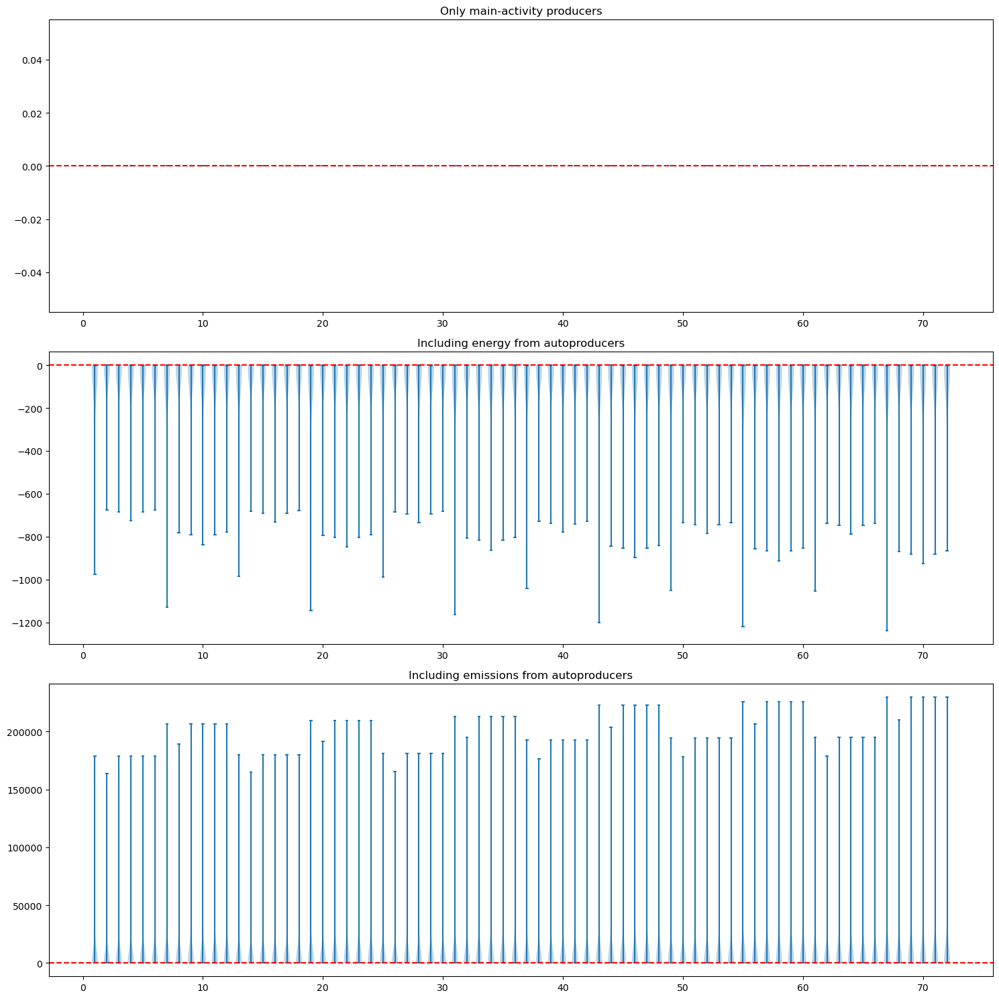

In [41]:
# visually confirm the validation from the "check" section above

# Load your data into df here
df = ef_diff

# Find columns that end with _maponly, _apenergy, _apemissions
cols_maponly = [col for col in df.columns if col.endswith('_maponly')]
cols_apenergy = [col for col in df.columns if col.endswith('_apenergy')]
cols_apemissions = [col for col in df.columns if col.endswith('_apemissions')]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 15))

# Generate violin plots
for ax, cols, title in zip(axes, [cols_maponly, cols_apenergy, cols_apemissions],
                           ['Only main-activity producers', 'Including energy from autoproducers', 'Including emissions from autoproducers']):
    data_to_plot = [df[col] for col in cols]
    ax.violinplot(data_to_plot, showmedians=True)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(title)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_gep_nep_validation_apcoms' + '.png')
#plt.savefig(plot_path)
    
plt.tight_layout()
plt.show()

## Temporal resolution
Up until this point, we have worked with data at an annual resolution level. Now we introduce a higher temporal resolution, so that we can calculate EF for e.g. 15-minute time periods.

In [42]:
# Here are the steps for the subsequent caclulation
# 1) calculate en_hr_i from agpt and mult
# 2) calculate em_hr_i = en_hr_i * ef_lr_i (we assume ef_hr_i = ef_lr_i - not time-dependent)
# 3) sum up em_hr_i across i: sum_i (em_hr_i) = em_hr
# 4) sum up en_hr_i across i: sum_i (en_hr_i) = en_hr
# 5) calculate grid ef: ef_hr = em_hr / en_hr
#
# en: energy, em: emissions, ef: emission factor
# lr: low resolution, hr: high resolution, i: production technology (column "label_entsoe")

### Import

In [43]:
# import the required files

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_lr_i = pd.read_pickle(pickle_path)
agpt = pd.read_pickle(pickle_path2)
mult = pd.read_pickle(pickle_path3)

# replace nan values with zeros
ef_lr_i = ef_lr_i.replace(np.nan, 0.0)
agpt = agpt.replace(np.nan, 0.0)
mult = mult.replace(np.nan, 0.0)

### Calculate

In [44]:
# step 1: calculate en_hr_i from agpt and mult
# use hourly ENTSOE data (agpt) and scaling dataframe (mult) to calculate high resolution energy flows

# filter for Germany
map_codes = ['DE']
agpt = agpt[agpt['MapCode'].isin(map_codes)]

# add column for year
agpt['Year'] = agpt['DateTime'].dt.year.astype('i4')

# Merge the dataframes on the relevant column
en_hr_i = pd.merge(agpt, mult, left_on=['Year', 'ProductionType'], right_on=['Year', 'Production Type'])

# Drop unnecessary columns
en_hr_i = en_hr_i.drop(columns=['MapCode', 'nep', 'nep_map'])

# Get all the columns for energy (pe, gep etc.) from the dataframe
ap_columns = [col for col in en_hr_i.columns if col.endswith('ap')]

# Multiply "ActualGenerationOutput" with each of the ap_columns
for col in ap_columns:
    en_hr_i[col] = en_hr_i[col] * en_hr_i['ActualGenerationOutput']
    
# Drop a few columns
en_hr_i = en_hr_i.drop(columns=['ProductionType', 'ActualGenerationOutput'])
prefixes_to_drop = ['pe_', 'ghp_', 'nhp_']
en_hr_i = en_hr_i.filter(regex=f'^(?!{"|".join(prefixes_to_drop)}).*')

# Divide all numeric columns by 4
# explanation: agpt is in MW (MWh/h), we want MWh
cols_to_exclude = ['Year', 'ProductionType', 'DateTime']
numeric_cols = en_hr_i.select_dtypes(include=np.number).columns.difference(cols_to_exclude)
en_hr_i[numeric_cols] = en_hr_i[numeric_cols] / 4

# Return the modified dataframe
en_hr_i # unit: MWh

,DateTime,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,Production Type
0,2018-01-01 00:00:00,2018,102.497996,34.027675,920.229263,454.450148,420.399565,32.330186,871.904860,96.667658,Biomass
1,2018-01-01 00:15:00,2018,102.497996,34.027675,920.229263,454.450148,420.399565,32.330186,871.904860,96.667658,Biomass
2,2018-01-01 00:30:00,2018,102.497996,34.027675,920.229263,454.450148,420.399565,32.330186,871.904860,96.667658,Biomass
3,2018-01-01 00:45:00,2018,102.497996,34.027675,920.229263,454.450148,420.399565,32.330186,871.904860,96.667658,Biomass
4,2018-01-01 01:00:00,2018,102.541130,34.041995,920.616519,454.641392,420.576480,32.343791,872.271779,96.708338,Biomass
...,...,...,...,...,...,...,...,...,...,...,...
2244091,2021-12-31 22:45:00,2021,0.000000,0.000000,0.000000,6560.604778,6442.592345,0.000000,0.000000,0.000000,Wind Onshore
2244092,2021-12-31 23:00:00,2021,0.000000,0.000000,0.000000,6475.047324,6358.573902,0.000000,0.000000,0.000000,Wind Onshore
2244093,2021-12-31 23:15:00,2021,0.000000,0.000000,0.000000,6475.047324,6358.573902,0.000000,0.000000,0.000000,Wind Onshore
2244094,2021-12-31 23:30:00,2021,0.000000,0.000000,0.000000,6475.047324,6358.573902,0.000000,0.000000,0.000000,Wind Onshore


In [45]:
# step 2: combine el and chp (map only), to reduce computational burden later

# initiate df
en_hr_i_comb = pd.DataFrame()

# copy columns
en_hr_i_comb['DateTime'] = en_hr_i['DateTime']
en_hr_i_comb['Year'] = en_hr_i['Year']
en_hr_i_comb['Production Type'] = en_hr_i['Production Type']

# define new columns
en_hr_i_comb['gep_map'] = en_hr_i['gep_el_map'] + en_hr_i['gep_chp_map']
en_hr_i_comb['nep_map'] = en_hr_i['nep_el_map'] + en_hr_i['nep_chp_map']

en_hr_i_comb

,DateTime,Year,Production Type,gep_map,nep_map
0,2018-01-01 00:00:00,2018,Biomass,1374.679411,1292.304425
1,2018-01-01 00:15:00,2018,Biomass,1374.679411,1292.304425
2,2018-01-01 00:30:00,2018,Biomass,1374.679411,1292.304425
3,2018-01-01 00:45:00,2018,Biomass,1374.679411,1292.304425
4,2018-01-01 01:00:00,2018,Biomass,1375.257911,1292.848259
...,...,...,...,...,...
2244091,2021-12-31 22:45:00,2021,Wind Onshore,6560.604778,6442.592345
2244092,2021-12-31 23:00:00,2021,Wind Onshore,6475.047324,6358.573902
2244093,2021-12-31 23:15:00,2021,Wind Onshore,6475.047324,6358.573902
2244094,2021-12-31 23:30:00,2021,Wind Onshore,6475.047324,6358.573902


In [46]:
# step 3: merge en and ef dataframe, to reduce computational burden later
em_hr_i = pd.merge(en_hr_i_comb, ef_lr_i, on=['Year', 'Production Type'])
em_hr_i

,DateTime,Year,Production Type,gep_map,nep_map,ef_gep_co2_op_el100_maponly,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2018,Biomass,1374.679411,1292.304425,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
1,2018-01-01 00:15:00,2018,Biomass,1374.679411,1292.304425,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
2,2018-01-01 00:30:00,2018,Biomass,1374.679411,1292.304425,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
3,2018-01-01 00:45:00,2018,Biomass,1374.679411,1292.304425,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
4,2018-01-01 01:00:00,2018,Biomass,1375.257911,1292.848259,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2244091,2021-12-31 22:45:00,2021,Wind Onshore,6560.604778,6442.592345,0.777644,0.777644,0.777644,0.777644,0.777644,...,0.955297,0.955297,0.955297,0.955297,19.353668,19.353668,19.353668,19.353668,19.353668,19.353668
2244092,2021-12-31 23:00:00,2021,Wind Onshore,6475.047324,6358.573902,0.777644,0.777644,0.777644,0.777644,0.777644,...,0.955297,0.955297,0.955297,0.955297,19.353668,19.353668,19.353668,19.353668,19.353668,19.353668
2244093,2021-12-31 23:15:00,2021,Wind Onshore,6475.047324,6358.573902,0.777644,0.777644,0.777644,0.777644,0.777644,...,0.955297,0.955297,0.955297,0.955297,19.353668,19.353668,19.353668,19.353668,19.353668,19.353668
2244094,2021-12-31 23:30:00,2021,Wind Onshore,6475.047324,6358.573902,0.777644,0.777644,0.777644,0.777644,0.777644,...,0.955297,0.955297,0.955297,0.955297,19.353668,19.353668,19.353668,19.353668,19.353668,19.353668


In [47]:
# step 4: calculate em_hr_i
# em_hr_i = en_hr_i * ef_lr_i

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map - ap are considered via apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if ef_col in em_hr_i.columns and en_col in em_hr_i.columns:
        
                        # Calculate the new column in the result DataFrame
                        em_hr_i[new_col] = em_hr_i[ef_col] * em_hr_i[en_col]
                        #em_hr_i[["Datetime", "Year", "Production Type"]] = merged_df[["Datetime", "Year", "Production Type"]]

# replace nan values with zeros
em_hr_i = em_hr_i.replace(np.nan, 0.0)

# drop some columns
# get all columns that start with "ef_"
ef_cols = [col for col in em_hr_i.columns if col.startswith("ef_")]
# add the specific columns you want to drop
cols_to_drop = ['gep_map', 'nep_map'] + ef_cols
# drop these columns
em_hr_i = em_hr_i.drop(columns=cols_to_drop)

# Show the new DataFrame
em_hr_i # unit: g/kWh * MWh = kg

,DateTime,Year,Production Type,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2018,Biomass,42677.177133,38821.624820,44800.912411,40753.497070,13211.208511,12017.678176,13954.915000,...,724890.765269,659099.449959,635100.304257,577458.399611,646179.454004,587532.002219,655372.919730,595891.066086,666452.069477,605964.668695
1,2018-01-01 00:15:00,2018,Biomass,42677.177133,38821.624820,44800.912411,40753.497070,13211.208511,12017.678176,13954.915000,...,724890.765269,659099.449959,635100.304257,577458.399611,646179.454004,587532.002219,655372.919730,595891.066086,666452.069477,605964.668695
2,2018-01-01 00:30:00,2018,Biomass,42677.177133,38821.624820,44800.912411,40753.497070,13211.208511,12017.678176,13954.915000,...,724890.765269,659099.449959,635100.304257,577458.399611,646179.454004,587532.002219,655372.919730,595891.066086,666452.069477,605964.668695
3,2018-01-01 00:45:00,2018,Biomass,42677.177133,38821.624820,44800.912411,40753.497070,13211.208511,12017.678176,13954.915000,...,724890.765269,659099.449959,635100.304257,577458.399611,646179.454004,587532.002219,655372.919730,595891.066086,666452.069477,605964.668695
4,2018-01-01 01:00:00,2018,Biomass,42695.136768,38837.961942,44819.765768,40770.647172,13216.768121,12022.735518,13960.787581,...,725195.817635,659376.815676,635367.570527,577701.408709,646451.382660,587779.250545,655648.717229,596141.832117,666732.529362,606219.673952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2244091,2021-12-31 22:45:00,2021,Wind Onshore,5101.813209,5101.813209,5101.813209,5101.813209,5101.813209,5101.813209,5101.813209,...,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216,124687.796216
2244092,2021-12-31 23:00:00,2021,Wind Onshore,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,...,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129
2244093,2021-12-31 23:15:00,2021,Wind Onshore,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,...,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129
2244094,2021-12-31 23:30:00,2021,Wind Onshore,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,5035.279991,...,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129,123061.731129


In [48]:
# step 5: sum up em_hr_i to em_hr
# sum_i (em_hr_i) = em_hr

# group by DateTime - sum up across production technologies
em_hr = em_hr_i.drop(columns=['Year', 'Production Type']).groupby('DateTime', as_index=False).sum()

# show result
em_hr # unit: kg

,DateTime,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,em_gep_co2_op_en_maponly,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2.966474e+06,2.769674e+06,3.465280e+06,2.929974e+06,2.419222e+06,2.317247e+06,2.753568e+06,2.377240e+06,2.632720e+06,...,4.667330e+06,3.962014e+06,3.782829e+06,3.533667e+06,4.410371e+06,3.746414e+06,3.817163e+06,3.556746e+06,4.444705e+06,3.769493e+06
1,2018-01-01 00:15:00,2.966474e+06,2.769674e+06,3.465280e+06,2.929974e+06,2.419222e+06,2.317247e+06,2.753568e+06,2.377240e+06,2.632720e+06,...,4.667330e+06,3.962014e+06,3.782829e+06,3.533667e+06,4.410371e+06,3.746414e+06,3.817163e+06,3.556746e+06,4.444705e+06,3.769493e+06
2,2018-01-01 00:30:00,2.966474e+06,2.769674e+06,3.465280e+06,2.929974e+06,2.419222e+06,2.317247e+06,2.753568e+06,2.377240e+06,2.632720e+06,...,4.667330e+06,3.962014e+06,3.782829e+06,3.533667e+06,4.410371e+06,3.746414e+06,3.817163e+06,3.556746e+06,4.444705e+06,3.769493e+06
3,2018-01-01 00:45:00,2.966474e+06,2.769674e+06,3.465280e+06,2.929974e+06,2.419222e+06,2.317247e+06,2.753568e+06,2.377240e+06,2.632720e+06,...,4.667330e+06,3.962014e+06,3.782829e+06,3.533667e+06,4.410371e+06,3.746414e+06,3.817163e+06,3.556746e+06,4.444705e+06,3.769493e+06
4,2018-01-01 01:00:00,2.952809e+06,2.757343e+06,3.438163e+06,2.916932e+06,2.412124e+06,2.310645e+06,2.734447e+06,2.370468e+06,2.624040e+06,...,4.644156e+06,3.955129e+06,3.776107e+06,3.527830e+06,4.387725e+06,3.739867e+06,3.811426e+06,3.551855e+06,4.423044e+06,3.763892e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,2.119574e+06,1.921237e+06,2.547033e+06,2.076267e+06,1.560140e+06,1.462930e+06,1.812782e+06,1.510591e+06,1.772818e+06,...,3.557825e+06,2.936609e+06,2.759376e+06,2.516617e+06,3.304719e+06,2.726665e+06,2.790698e+06,2.537930e+06,3.336041e+06,2.747978e+06
140252,2021-12-31 23:00:00,2.093510e+06,1.893884e+06,2.522627e+06,2.049702e+06,1.533191e+06,1.436334e+06,1.785297e+06,1.483407e+06,1.747522e+06,...,3.532927e+06,2.908524e+06,2.731152e+06,2.487181e+06,3.279345e+06,2.698776e+06,2.763614e+06,2.509323e+06,3.311808e+06,2.720917e+06
140253,2021-12-31 23:15:00,2.093510e+06,1.893884e+06,2.522627e+06,2.049702e+06,1.533191e+06,1.436334e+06,1.785297e+06,1.483407e+06,1.747522e+06,...,3.532927e+06,2.908524e+06,2.731152e+06,2.487181e+06,3.279345e+06,2.698776e+06,2.763614e+06,2.509323e+06,3.311808e+06,2.720917e+06
140254,2021-12-31 23:30:00,2.093510e+06,1.893884e+06,2.522627e+06,2.049702e+06,1.533191e+06,1.436334e+06,1.785297e+06,1.483407e+06,1.747522e+06,...,3.532927e+06,2.908524e+06,2.731152e+06,2.487181e+06,3.279345e+06,2.698776e+06,2.763614e+06,2.509323e+06,3.311808e+06,2.720917e+06


In [49]:
# step 6: sum up en_hr_i to en_hr
# sum_i (en_hr_i) = en_hr

# group by DateTime - sum up across production technologies
en_hr = en_hr_i_comb.drop(columns=['Year', 'Production Type']).groupby('DateTime', as_index=False).sum()

# show result
en_hr # unit: MWh

,DateTime,gep_map,nep_map
0,2018-01-01 00:00:00,15093.022954,14540.260188
1,2018-01-01 00:15:00,15093.022954,14540.260188
2,2018-01-01 00:30:00,15093.022954,14540.260188
3,2018-01-01 00:45:00,15093.022954,14540.260188
4,2018-01-01 01:00:00,15232.550364,14679.334435
...,...,...,...
140251,2021-12-31 22:45:00,13359.496400,12915.451701
140252,2021-12-31 23:00:00,13197.010342,12756.248193
140253,2021-12-31 23:15:00,13197.010342,12756.248193
140254,2021-12-31 23:30:00,13197.010342,12756.248193


In [50]:
# step 7: divide em_hr by en_hr to get ef_hr
# ef_hr = em_hr / en_hr

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
ef_hr = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    em_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map - ap are considered via apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if em_col in em_hr.columns and en_col in en_hr.columns and en_col in en_hr.columns:
                        # Merge dataframes on 'label_entsoe'
                        merged_df = pd.merge(em_hr[['DateTime', em_col]], en_hr[['DateTime', en_col]], on='DateTime')

                        # Calculate the new column in the result DataFrame
                        ef_hr[new_col] = merged_df[em_col] / merged_df[en_col]
                        ef_hr["DateTime"] = merged_df["DateTime"]

# replace nan values with zeros
ef_hr = ef_hr.replace(np.nan, 0.0)

# Show the new DataFrame
ef_hr # unit: kg/MWh = g/kWh

,ef_gep_co2_op_el100_maponly,DateTime,ef_gep_co2_op_el100_apenergy,ef_gep_co2_op_el100_apemissions,ef_gep_co2_op_el100_mapap,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_th100_apenergy,ef_gep_co2_op_th100_apemissions,ef_gep_co2_op_th100_mapap,ef_gep_co2_op_en_maponly,...,ef_nep_gwp20_lc_ex_apemissions,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_maponly,ef_nep_gwp20_lc_iea_apenergy,ef_nep_gwp20_lc_iea_apemissions,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_maponly,ef_nep_gwp20_lc_uba_apenergy,ef_nep_gwp20_lc_uba_apemissions,ef_nep_gwp20_lc_uba_mapap
0,196.546039,2018-01-01 00:00:00,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.993538,272.485754,260.162410,243.026382,303.321359,257.657974,262.523681,244.613648,305.682630,259.245239
1,196.546039,2018-01-01 00:15:00,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.993538,272.485754,260.162410,243.026382,303.321359,257.657974,262.523681,244.613648,305.682630,259.245239
2,196.546039,2018-01-01 00:30:00,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.993538,272.485754,260.162410,243.026382,303.321359,257.657974,262.523681,244.613648,305.682630,259.245239
3,196.546039,2018-01-01 00:45:00,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.993538,272.485754,260.162410,243.026382,303.321359,257.657974,262.523681,244.613648,305.682630,259.245239
4,193.848642,2018-01-01 01:00:00,181.016487,225.711573,191.493359,158.353260,151.691283,179.513391,155.618600,172.265277,...,316.373713,269.435149,257.239649,240.326261,298.904920,254.770872,259.645662,241.962943,301.310934,256.407554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,158.656701,2021-12-31 22:45:00,143.810556,190.653349,155.415073,116.781332,109.504904,135.692370,113.072446,132.700925,...,275.470442,227.371788,213.649181,194.853224,255.873269,211.116503,216.074346,196.503413,258.298434,212.766692
140252,158.635165,2021-12-31 23:00:00,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,276.956595,228.007790,214.103040,194.977488,257.077564,211.564989,216.647855,196.713216,259.622379,213.300717
140253,158.635165,2021-12-31 23:15:00,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,276.956595,228.007790,214.103040,194.977488,257.077564,211.564989,216.647855,196.713216,259.622379,213.300717
140254,158.635165,2021-12-31 23:30:00,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,276.956595,228.007790,214.103040,194.977488,257.077564,211.564989,216.647855,196.713216,259.622379,213.300717


### Check

In [51]:
# We want to verify that the total sum of emissions is identical for lr and hr data
# i.e., that em_lr = sum_t (em_hr)
# => sum_i (ef_lr_i * en_lr_i) = sum_t (ef_hr * en_hr)
# where i = Production Type, t = time
# --
# We have (from the imports and calculations above): ef_lr_i, ef_hr and en_hr
# --
# We need to import en_lr_i
# --
# Then we need to do the following calculation steps:
# 1) Calculate em_lr_i = ef_lr_i * en_lr_i
# 2) Calculate em_lr = sum_i (em_lr_i)
# 3) Calculate em_hr = ef_hr * en_hr
# 4) Sum up em_hr over time (t)
# 5) Compare em_lr and em_hr

In [52]:
# Import en_lr_i

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
en_lr_i = pd.read_pickle(pickle_path)

In [53]:
# step 1: Calculate em_lr_i = ef_lr_i * en_lr_i

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
em_lr_i = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
                for allocation in allocations:
                    for apcom in apcoms:
                        # Calculate the new column name
                        new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                        # Calculate the column names in the input DataFrames
                        ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                        en_el_col = f'{perspective}_el_map' # only map - ap are considered via apcoms
                        en_chp_col = f'{perspective}_chp_map'

                        # Check if columns exist in their respective dataframes before calculation
                        if ef_col in ef_lr_i.columns and en_el_col in en_lr_i.columns and en_chp_col in en_lr_i.columns:
                            # Merge dataframes on 'Production Type'
                            merged_df = pd.merge(ef_lr_i[['Year', 'Production Type', ef_col]], en_lr_i[['Year', 'Production Type', en_el_col, en_chp_col]], on=['Year', 'Production Type'])

                            # Calculate the new column in the result DataFrame
                            em_lr_i[new_col] = merged_df[ef_col] * (merged_df[en_el_col] + merged_df[en_chp_col])
                            em_lr_i[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
em_lr_i = em_lr_i.replace(np.nan, 0.0)

# Show the new DataFrame
em_lr_i # unit: g/kWh * GWh = t

,em_gep_co2_op_el100_maponly,Year,Production Type,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,6.050607e+07,2018,Fossil Hard coal,5.788359e+07,6.317282e+07,6.043475e+07,4.715857e+07,4.511461e+07,4.880750e+07,4.669206e+07,...,7.519428e+07,7.187159e+07,6.582824e+07,6.291942e+07,6.922632e+07,6.616734e+07,6.615081e+07,6.322773e+07,6.954888e+07,6.647565e+07
1,4.920539e+07,2019,Fossil Hard coal,4.670401e+07,5.164331e+07,4.901800e+07,3.614171e+07,3.430443e+07,3.774128e+07,3.582269e+07,...,6.042417e+07,5.731934e+07,5.162965e+07,4.897671e+07,5.473615e+07,5.192359e+07,5.180090e+07,4.913917e+07,5.490740e+07,5.208604e+07
2,3.605952e+07,2020,Fossil Hard coal,3.305401e+07,3.901936e+07,3.576715e+07,2.594188e+07,2.377966e+07,2.759966e+07,2.529926e+07,...,4.570012e+07,4.184019e+07,3.780374e+07,3.461075e+07,4.157529e+07,3.806375e+07,3.782291e+07,3.462830e+07,4.159446e+07,3.808130e+07
3,4.507744e+07,2021,Fossil Hard coal,4.211792e+07,4.804134e+07,4.488723e+07,3.382141e+07,3.160090e+07,3.542222e+07,3.309660e+07,...,5.682846e+07,5.302171e+07,4.830481e+07,4.506904e+07,5.208153e+07,4.859277e+07,4.845883e+07,4.521274e+07,5.223555e+07,4.873647e+07
4,1.529134e+08,2018,Fossil Brown coal/Lignite,1.495606e+08,1.563984e+08,1.529691e+08,1.458395e+08,1.426417e+08,1.481804e+08,1.449313e+08,...,1.615452e+08,1.579245e+08,1.554414e+08,1.519575e+08,1.590566e+08,1.554916e+08,1.549288e+08,1.514564e+08,1.585440e+08,1.549906e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000e+00,2021,Hydro Run-of-river and poundage,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,5.156513e+04,5.131937e+04,5.130281e+04,5.105831e+04,5.156513e+04,5.131937e+04,5.130281e+04,5.105831e+04,5.156513e+04,5.131937e+04
60,8.356125e+03,2018,Hydro Water Reservoir,8.315542e+03,8.397417e+03,8.356634e+03,8.356125e+03,8.315542e+03,8.397417e+03,8.356634e+03,...,4.220976e+04,4.200780e+04,4.200220e+04,4.180124e+04,4.220976e+04,4.200780e+04,4.200220e+04,4.180124e+04,4.220976e+04,4.200780e+04
61,1.304131e+04,2019,Hydro Water Reservoir,1.297735e+04,1.310641e+04,1.304213e+04,1.304131e+04,1.297735e+04,1.310641e+04,1.304213e+04,...,6.587957e+04,6.556064e+04,6.555236e+04,6.523501e+04,6.587957e+04,6.556064e+04,6.555236e+04,6.523501e+04,6.587957e+04,6.556064e+04
62,1.163652e+04,2020,Hydro Water Reservoir,1.158508e+04,1.168897e+04,1.163730e+04,1.163652e+04,1.158508e+04,1.168897e+04,1.163730e+04,...,5.875479e+04,5.849593e+04,5.849116e+04,5.823346e+04,5.875479e+04,5.849593e+04,5.849116e+04,5.823346e+04,5.875479e+04,5.849593e+04


In [54]:
# step 2: Calculate em_lr = sum_i (em_lr_i)

# sum up across Production Types
em_lr_series = em_lr_i.drop(columns=['Year', 'Production Type']).sum()

# Convert the series to a DataFrame and transpose it
em_lr = em_lr_series.to_frame().T

# show results
em_lr # unit: t

,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,em_gep_co2_op_en_maponly,em_gep_co2_op_en_apenergy,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,8.035065e+08,7.437732e+08,9.002029e+08,7.941837e+08,6.429085e+08,6.101686e+08,6.923552e+08,6.285532e+08,7.050894e+08,6.600675e+08,...,1.123327e+09,9.853875e+08,9.284207e+08,8.601052e+08,1.053230e+09,9.266720e+08,9.383113e+08,8.668951e+08,1.063120e+09,9.334619e+08


In [55]:
# step 3: Calculate em_hr_check = ef_hr * en_hr

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
em_hr_check = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map columns - ap are considered by apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if ef_col in ef_hr.columns and en_col in en_hr.columns:
                        # Merge dataframes on 'label_entsoe'
                        merged_df = pd.merge(ef_hr[['DateTime', ef_col]], en_hr[['DateTime', en_col]], on='DateTime')

                        # Calculate the new column in the result DataFrame
                        em_hr_check[new_col] = ef_hr[ef_col] * en_hr[en_col] / 1000
                        em_hr_check["DateTime"] = merged_df["DateTime"]

# replace nan values with zeros
em_hr_check = em_hr_check.replace(np.nan, 0.0)

# Show the new DataFrame
em_hr_check # unit: g/kWh * MWh / 1000 = t

,em_gep_co2_op_el100_maponly,DateTime,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,em_gep_co2_op_en_maponly,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,2966.473875,2018-01-01 00:00:00,2769.674075,3465.279862,2929.973523,2419.221989,2317.247245,2753.568132,2377.240045,2632.720355,...,4667.329566,3962.013756,3782.829129,3533.666833,4410.371484,3746.413976,3817.162625,3556.746086,4444.704980,3769.493229
1,2966.473875,2018-01-01 00:15:00,2769.674075,3465.279862,2929.973523,2419.221989,2317.247245,2753.568132,2377.240045,2632.720355,...,4667.329566,3962.013756,3782.829129,3533.666833,4410.371484,3746.413976,3817.162625,3556.746086,4444.704980,3769.493229
2,2966.473875,2018-01-01 00:30:00,2769.674075,3465.279862,2929.973523,2419.221989,2317.247245,2753.568132,2377.240045,2632.720355,...,4667.329566,3962.013756,3782.829129,3533.666833,4410.371484,3746.413976,3817.162625,3556.746086,4444.704980,3769.493229
3,2966.473875,2018-01-01 00:45:00,2769.674075,3465.279862,2929.973523,2419.221989,2317.247245,2753.568132,2377.240045,2632.720355,...,4667.329566,3962.013756,3782.829129,3533.666833,4410.371484,3746.413976,3817.162625,3556.746086,4444.704980,3769.493229
4,2952.809208,2018-01-01 01:00:00,2757.342753,3438.162904,2916.932228,2412.124010,2310.645115,2734.446766,2370.468164,2624.039512,...,4644.155544,3955.128656,3776.106831,3527.829562,4387.725285,3739.866828,3811.425510,3551.854964,4423.043964,3763.892230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2119.573626,2021-12-31 22:45:00,1921.236612,2547.032729,2076.267114,1560.139789,1462.930369,1812.781726,1510.590931,1772.817523,...,3557.825186,2936.609352,2759.375675,2516.617404,3304.718844,2726.664999,2790.697784,2537.930343,3336.040954,2747.977937
140252,2093.509918,2021-12-31 23:00:00,1893.884121,2522.626633,2049.702457,1533.191343,1436.333684,1785.296765,1483.406946,1747.522181,...,3532.927061,2908.523963,2731.151520,2487.181228,3279.345213,2698.775504,2763.613812,2509.322607,3311.807505,2720.916883
140253,2093.509918,2021-12-31 23:15:00,1893.884121,2522.626633,2049.702457,1533.191343,1436.333684,1785.296765,1483.406946,1747.522181,...,3532.927061,2908.523963,2731.151520,2487.181228,3279.345213,2698.775504,2763.613812,2509.322607,3311.807505,2720.916883
140254,2093.509918,2021-12-31 23:30:00,1893.884121,2522.626633,2049.702457,1533.191343,1436.333684,1785.296765,1483.406946,1747.522181,...,3532.927061,2908.523963,2731.151520,2487.181228,3279.345213,2698.775504,2763.613812,2509.322607,3311.807505,2720.916883


In [56]:
# step 4: sum up em_hr_check over time

# sum up across DatTime
em_hr_check_series = em_hr_check.drop(columns=['DateTime']).sum()

# Convert the series to a DataFrame and transpose it
em_hr_check_sum = em_hr_check_series.to_frame().T

# show results
em_hr_check_sum # unit: t

,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,em_gep_co2_op_en_maponly,em_gep_co2_op_en_apenergy,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,8.035065e+08,7.437732e+08,9.002029e+08,7.941837e+08,6.429085e+08,6.101686e+08,6.923552e+08,6.285532e+08,7.050894e+08,6.600675e+08,...,1.123327e+09,9.853875e+08,9.284207e+08,8.601052e+08,1.053230e+09,9.266720e+08,9.383113e+08,8.668951e+08,1.063120e+09,9.334619e+08


In [57]:
# step 5: compare em_lr and em_hr_check_check_sum

# define your threshold here
threshold = 0.001  # example: 0.1 % relative difference

# compute the relative difference
diff = (em_hr_check_sum - em_lr) / em_lr

# compute the average relative difference
avg_diff = diff.abs().mean().mean()

# create a boolean mask where True indicates that the relative difference is below the threshold
mask = np.abs(diff) < threshold

# check if all cells are below the threshold
all_below_threshold = mask.all().all()

print("Average relative difference:", avg_diff) # should be (close to) zero
print("All differences below threshold:", all_below_threshold) # should be "True"

Average relative difference: 1.1135808142332549e-16
All differences below threshold: True


### Save

In [58]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms.pkl')

# Save the dataframe to a pickle file
ef_hr.to_pickle(pickle_path)

### Plot

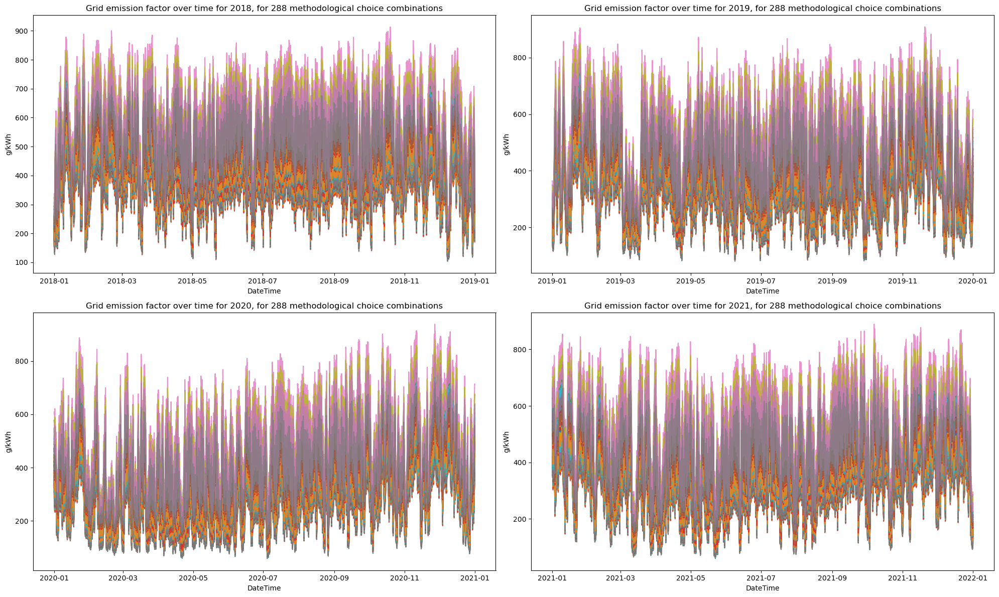

In [59]:
# plot 1: line plot, EF over time

# Convert the 'DateTime' column to datetime
ef_hr['DateTime'] = pd.to_datetime(ef_hr['DateTime'])

# Add a new column for the year
ef_hr['Year'] = ef_hr['DateTime'].dt.year

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Subset the DataFrame for the current year
    ef_hr_year = ef_hr[ef_hr['Year'] == year]
    
    # Remove the 'DateTime' and 'Year' columns from the columns to plot
    columns_to_plot = ef_hr_year.columns.drop(['DateTime', 'Year'])

    for column in columns_to_plot:
        axs[i].plot(ef_hr_year['DateTime'], ef_hr_year[column], label=column, alpha=0.8)
        
    axs[i].set_xlabel('DateTime')
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Grid emission factor over time for {year}, for 288 methodological choice combinations')
    # axs[i].legend(loc='upper right')  # Adjust the position of the legend as needed

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_gep_nep_de' + '.png')
#plt.savefig(plot_path)

plt.show()

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\2469296766.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_vals_years = ef_hr.groupby('Year').mean()


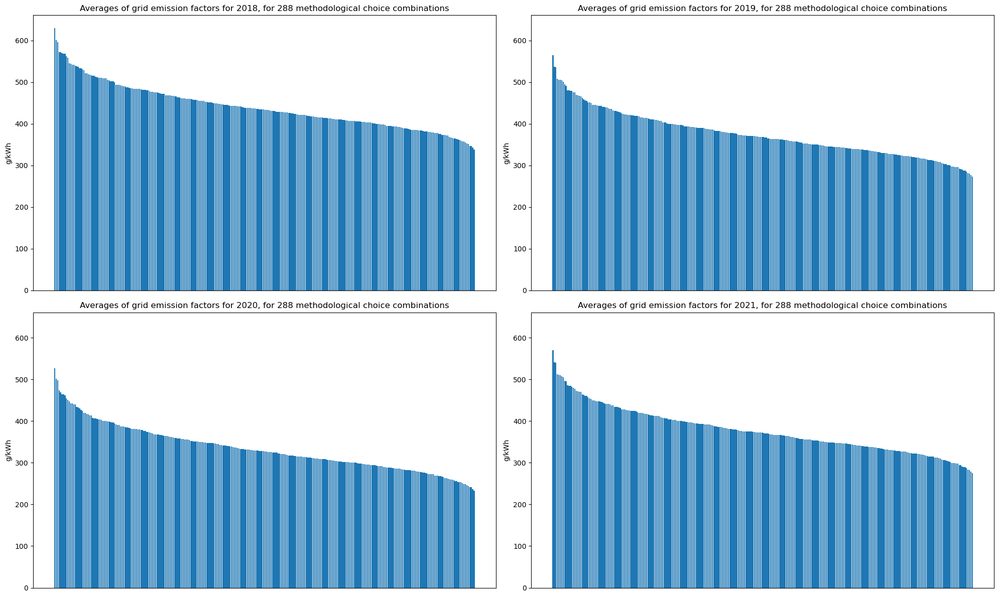

In [60]:
# Plot 2: bar plot, means of ef, sorted

# Convert the 'DateTime' column to datetime
ef_hr['DateTime'] = pd.to_datetime(ef_hr['DateTime'])

# Add a new column for the year
ef_hr['Year'] = ef_hr['DateTime'].dt.year

# Calculate the means for each year
mean_vals_years = ef_hr.groupby('Year').mean()

# Find the global maximum value to set y limit
global_max = 1.05*mean_vals_years.max().max()

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Select the mean values for the current year and sort them
    mean_vals_year = mean_vals_years.loc[year].sort_values(ascending=False)
    
    # Plot the results
    axs[i].bar(mean_vals_year.index, mean_vals_year.values)
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Averages of grid emission factors for {year}, for 288 methodological choice combinations')
    
    # Remove x-tick labels
    axs[i].set_xticks([])

    # Set y limit
    axs[i].set_ylim([0, global_max])

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_gep_nep_mean_de' + '.png')
#plt.savefig(plot_path)

plt.show()

## Electricity trading
Here, we consider how the grid emission factor changes when taking into account the trade of electricity with neighboring countries.

In [ ]:
# The trade-corrected ef for a country (e.g. Germany) is calculated as follows:
# ef =
# em / en =
# (em_dom + em_imp - em_exp) / (en_dom + en_imp - en_exp) = 
# (ef_dom*en_dom + sum_n (ef_dom_n * imp_n) - sum_n (ef_dom * exp_n)) / (en_dom + sum_n (imp_n) - sum_n (exp_n))

    # ef_dom: the domestic grid emission factor for the country of interest (from previous section, ef_hr)
    # ef_dom_n =
    # em_dom_n / en_dom_n = 
    # sum_i (ef_n_i * en_dom_n_i) / sum_i (en_dom_n_i)

        # ef_n_i: we assume this to be the same as for Germany (ef_lr_i)
        # en_dom_n_i: to be extracted from agpt (only nep, en_hr_n_i)

    # imp_n: the imports from neighbor country n (from pf, imp_hr_n)
    # exp_n: the exports to neighbor country n (from pf, exp_hr_n)
    # en_dom: the net electricity production within Germany (nep_map_hr)
    
# ef: emission factor
# em: emissions
# en: energy
# dom: domestic
# imp: imports
# exp: exports
# n: neighbor
# i: production type
# lr: low temporal resolution
# hr: high temporal resolution
# pf: physical flows
# map: main activity producer

In [ ]:
# step 1: extract ef_n_i (from ef_lr_i)
# step 2: extract en_dom_n_i from agpt (en_hr_n_i)
# step 3: calculate en_dom_n = sum_i (en_dom_n_i)
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 5: calculate ef_dom_n = em_dom_n / en_dom_n
# step 6: extract imp_n from pf (imp_hr_n)
# step 7: extract exp_n from pf (exp_hr_n)
# step 8: calculate en_imp = sum_n (imp_n)
# step 9: calculate en_exp = sum_n (exp_n)
# step 10: extract ef_dom (from ef_hr)
# step 11: calculate em_imp = sum_n (ef_dom_n * imp_n)
# step 12: calculate em_exp = sum_n (ef_dom * exp_n)
# step 13: extract en_dom from agpt and mult (nep_map)
# step 14: calculate em_dom = ef_dom * en_dom
# step 15: calculate em = em_dom + em_imp - em_exp
# step 16: calculate en = en_dom + en_imp - en_exp
# step 17: calculate ef = em / en

# Final step: apply to all variations of (prod) ef calculated before
# (step 18: calculate ef_cons = ef_rel_diff * ef_prod)

### Import

In [61]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path4 = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path5 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Load the pickle file into a DataFrame
agpt = pd.read_pickle(pickle_path)
pf = pd.read_pickle(pickle_path2)
ef_dom = pd.read_pickle(pickle_path3)
ef_n_i = pd.read_pickle(pickle_path4)
mult = pd.read_pickle(pickle_path5)

# replace nan values with zeros
agpt = agpt.replace(np.nan, 0.0)
pf = pf.replace(np.nan, 0.0)
ef_dom = ef_dom.replace(np.nan, 0.0)
ef_n_i = ef_n_i.replace(np.nan, 0.0)
mult = mult.replace(np.nan, 0.0)

### Calculate

In [62]:
# step 1: extract ef_n_i (from ef_lr_i)
# we look at only one ef to save computational load
# from this one ef, we calculate the relative difference in ef and apply it to all other ef

# limit to ef_nep columns
desired_columns = ['Year', 'Production Type', 'ef_nep_gwp100_lc_ex_maponly'] # limit to only one ef
ef_n_i = ef_n_i[desired_columns]
ef_n_i # unit: g/kWh

,Year,Production Type,ef_nep_gwp100_lc_ex_maponly
0,2018,Fossil Hard coal,961.415094
1,2019,Fossil Hard coal,992.138116
2,2020,Fossil Hard coal,1004.515444
3,2021,Fossil Hard coal,980.140962
4,2018,Fossil Brown coal/Lignite,1107.655151
...,...,...,...
59,2021,Hydro Run-of-river and poundage,2.633038
60,2018,Hydro Water Reservoir,23.502924
61,2019,Hydro Water Reservoir,23.481000
62,2020,Hydro Water Reservoir,23.451918


In [63]:
# step 2: extract en_dom_n_i from agpt (en_hr_n_i)

#rename a column
agpt.rename(columns={'ActualGenerationOutput': 'nep',
                     'ProductionType': 'Production Type',}, inplace=True)
# new name
en_dom_n_i = agpt

# divide by 4 to get from MW to MWh (15 minute intervals)
en_dom_n_i['nep'] = en_dom_n_i['nep'] / 4 # unit: MW -> MWh

en_dom_n_i # unit: MWh

,DateTime,nep,MapCode,Production Type
0,2018-01-01 00:00:00,158.00000,AT,Biomass
1,2018-01-01 00:15:00,158.00000,AT,Biomass
2,2018-01-01 00:30:00,158.00000,AT,Biomass
3,2018-01-01 00:45:00,158.00000,AT,Biomass
4,2018-01-01 01:00:00,158.00000,AT,Biomass
...,...,...,...,...
17531995,2021-12-31 22:45:00,502.40250,SE,Wind Onshore
17531996,2021-12-31 23:00:00,501.72375,SE,Wind Onshore
17531997,2021-12-31 23:15:00,501.72375,SE,Wind Onshore
17531998,2021-12-31 23:30:00,501.72375,SE,Wind Onshore


In [64]:
# step 3: calculate en_dom_n = sum_i (en_dom_n_i)

# sum up across Production Types, grouped by location and time
en_dom_n = en_dom_n_i.groupby(['DateTime', 'MapCode']).nep.sum().reset_index()
en_dom_n # unit: MWh

,DateTime,MapCode,nep
0,2018-01-01 00:00:00,AT,2418.628750
1,2018-01-01 00:00:00,BE,1758.626250
2,2018-01-01 00:00:00,CH,578.673750
3,2018-01-01 00:00:00,CZ,1075.599375
4,2018-01-01 00:00:00,DE,14389.464375
...,...,...,...
1683067,2021-12-31 23:45:00,LU,29.438750
1683068,2021-12-31 23:45:00,NL,7286.799375
1683069,2021-12-31 23:45:00,NO,1682.076250
1683070,2021-12-31 23:45:00,PL,2661.755625


In [65]:
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 4.1: merge dataframes ef_n_i and en_dom_n_i, multiply values

# Extract the year from the 'DateTime' column in the en_dom_n_i dataframe and add it as a new column
en_dom_n_i['Year'] = en_dom_n_i['DateTime'].dt.year.astype('i4')

# Merge
em_dom_n_i = pd.merge(ef_n_i, en_dom_n_i, on=['Year', 'Production Type'])

# Calculate
em_dom_n_i['em_nep_gwp100_lc_ex_maponly'] = em_dom_n_i['ef_nep_gwp100_lc_ex_maponly'] * em_dom_n_i['nep']
em_dom_n_i # unit: g/kWh * MWh = kg

,Year,Production Type,ef_nep_gwp100_lc_ex_maponly,DateTime,nep,MapCode,em_nep_gwp100_lc_ex_maponly
0,2018,Fossil Hard coal,961.415094,2018-01-01 00:00:00,75.350000,AT,72442.627363
1,2018,Fossil Hard coal,961.415094,2018-01-01 00:15:00,75.350000,AT,72442.627363
2,2018,Fossil Hard coal,961.415094,2018-01-01 00:30:00,75.350000,AT,72442.627363
3,2018,Fossil Hard coal,961.415094,2018-01-01 00:45:00,75.350000,AT,72442.627363
4,2018,Fossil Hard coal,961.415094,2018-01-01 01:00:00,74.700000,AT,71817.707551
...,...,...,...,...,...,...,...
16269691,2021,Hydro Water Reservoir,23.516198,2021-12-31 22:45:00,956.645000,SE,22496.653068
16269692,2021,Hydro Water Reservoir,23.516198,2021-12-31 23:00:00,992.508125,SE,23340.017410
16269693,2021,Hydro Water Reservoir,23.516198,2021-12-31 23:15:00,992.508125,SE,23340.017410
16269694,2021,Hydro Water Reservoir,23.516198,2021-12-31 23:30:00,992.508125,SE,23340.017410


In [66]:
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 4.2: sum up across Production Types, grouped by DateTime and MapCode

em_dom_n = em_dom_n_i.groupby(['DateTime', 'MapCode']).em_nep_gwp100_lc_ex_maponly.sum().reset_index()
em_dom_n # unit: kg

,DateTime,MapCode,em_nep_gwp100_lc_ex_maponly
0,2018-01-01 00:00:00,AT,1.919629e+05
1,2018-01-01 00:00:00,BE,2.558345e+05
2,2018-01-01 00:00:00,CH,2.928948e+04
3,2018-01-01 00:00:00,CZ,5.383944e+05
4,2018-01-01 00:00:00,DE,3.392567e+06
...,...,...,...
1683067,2021-12-31 23:45:00,LU,1.132225e+04
1683068,2021-12-31 23:45:00,NL,2.783181e+06
1683069,2021-12-31 23:45:00,NO,4.129806e+04
1683070,2021-12-31 23:45:00,PL,1.743204e+06


In [67]:
# step 5: calculate ef_dom_n = em_dom_n / en_dom_n

# merge
ef_dom_n = pd.merge(em_dom_n, en_dom_n, on=['DateTime', 'MapCode'])

# calculate new column
ef_dom_n['ef'] = ef_dom_n['em_nep_gwp100_lc_ex_maponly'] / ef_dom_n['nep']

# drop
ef_dom_n = ef_dom_n.drop(['em_nep_gwp100_lc_ex_maponly', 'nep'], axis=1)

ef_dom_n # unit: kg / MWh = g/kWh

,DateTime,MapCode,ef
0,2018-01-01 00:00:00,AT,79.368487
1,2018-01-01 00:00:00,BE,145.474057
2,2018-01-01 00:00:00,CH,50.614836
3,2018-01-01 00:00:00,CZ,500.552870
4,2018-01-01 00:00:00,DE,235.767405
...,...,...,...
1683067,2021-12-31 23:45:00,LU,384.603783
1683068,2021-12-31 23:45:00,NL,381.948404
1683069,2021-12-31 23:45:00,NO,24.551835
1683070,2021-12-31 23:45:00,PL,654.907497


In [68]:
# step 6: extract imp_n from pf

# limit to inflows into Germany
imp_n = pf[(pf['InMapCode'] == 'DE')]

# reset
imp_n = imp_n.reset_index()

# drop
imp_n = imp_n.drop(['InMapCode', 'index'], axis=1)

# rename
imp_n.rename(columns={'OutMapCode': 'MapCode'}, inplace=True)

imp_n # unit: MWh

,DateTime,MapCode,FlowValue_corr
0,2018-01-01 00:00:00,DK,0.000000
1,2018-01-01 00:15:00,DK,0.000000
2,2018-01-01 00:30:00,DK,0.000000
3,2018-01-01 00:45:00,DK,0.000000
4,2018-01-01 01:00:00,DK,0.000000
...,...,...,...
1542811,2021-12-31 22:45:00,SE,0.000000
1542812,2021-12-31 23:00:00,SE,31.395249
1542813,2021-12-31 23:15:00,SE,31.395249
1542814,2021-12-31 23:30:00,SE,31.395249


In [69]:
# step 7: extract exp_n from pf (exp_n_hr_n)

# limit to inflows into Germany
exp_n = pf[(pf['OutMapCode'] == 'DE')]

# reset
exp_n = exp_n.reset_index()

# drop
exp_n = exp_n.drop(['OutMapCode', 'index'], axis=1)

# rename
exp_n.rename(columns={'InMapCode': 'MapCode'}, inplace=True)

exp_n # unit: MWh

,DateTime,MapCode,FlowValue_corr
0,2018-01-01 00:00:00,DK,521.448461
1,2018-01-01 00:15:00,DK,521.448461
2,2018-01-01 00:30:00,DK,521.448461
3,2018-01-01 00:45:00,DK,521.448461
4,2018-01-01 01:00:00,DK,563.428586
...,...,...,...
1542811,2021-12-31 22:45:00,SE,35.103244
1542812,2021-12-31 23:00:00,SE,0.000000
1542813,2021-12-31 23:15:00,SE,0.000000
1542814,2021-12-31 23:30:00,SE,0.000000


In [70]:
# step 8: calculate en_imp = sum_n (imp_n)

en_imp = imp_n.groupby(['DateTime']).FlowValue_corr.sum().reset_index()
en_imp # unit: MWh

,DateTime,FlowValue_corr
0,2018-01-01 00:00:00,176.803746
1,2018-01-01 00:15:00,176.803746
2,2018-01-01 00:30:00,176.803746
3,2018-01-01 00:45:00,176.803746
4,2018-01-01 01:00:00,195.096162
...,...,...
140251,2021-12-31 22:45:00,707.437563
140252,2021-12-31 23:00:00,936.657160
140253,2021-12-31 23:15:00,936.657160
140254,2021-12-31 23:30:00,936.657160


In [71]:
# step 9: calculate en_exp = sum_n (exp_n)

en_exp = exp_n.groupby(['DateTime']).FlowValue_corr.sum().reset_index()
en_exp # unit: MWh

,DateTime,FlowValue_corr
0,2018-01-01 00:00:00,4180.242011
1,2018-01-01 00:15:00,4180.242011
2,2018-01-01 00:30:00,4180.242011
3,2018-01-01 00:45:00,4180.242011
4,2018-01-01 01:00:00,4276.684107
...,...,...
140251,2021-12-31 22:45:00,4805.360958
140252,2021-12-31 23:00:00,5103.096915
140253,2021-12-31 23:15:00,5103.096915
140254,2021-12-31 23:30:00,5103.096915


In [72]:
# step 10: extract ef_dom (from ef_hr)

desired_columns = ['DateTime', 'ef_nep_gwp100_lc_ex_maponly'] # limit to only one ef
ef_dom_des = ef_dom[desired_columns]
ef_dom_des # unit: g/kWh

,DateTime,ef_nep_gwp100_lc_ex_maponly
0,2018-01-01 00:00:00,241.107055
1,2018-01-01 00:15:00,241.107055
2,2018-01-01 00:30:00,241.107055
3,2018-01-01 00:45:00,241.107055
4,2018-01-01 01:00:00,238.187393
...,...,...
140251,2021-12-31 22:45:00,196.793264
140252,2021-12-31 23:00:00,197.119635
140253,2021-12-31 23:15:00,197.119635
140254,2021-12-31 23:30:00,197.119635


In [73]:
# step 11: calculate em_imp = sum_n (ef_dom_n * imp_n)

# merge
em_imp = pd.merge(ef_dom_n, imp_n, on=['DateTime', 'MapCode'])

# calculate new column
em_imp['em'] = em_imp['ef'] * em_imp['FlowValue_corr'] 

# drop
em_imp = em_imp.drop(['ef', 'FlowValue_corr'], axis=1)

# sum up across countries n
em_imp = em_imp.groupby(['DateTime']).em.sum().reset_index()

em_imp # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,28701.980668
1,2018-01-01 00:15:00,28701.980668
2,2018-01-01 00:30:00,28701.980668
3,2018-01-01 00:45:00,28701.980668
4,2018-01-01 01:00:00,26743.447358
...,...,...
140251,2021-12-31 22:45:00,220092.420242
140252,2021-12-31 23:00:00,243106.086255
140253,2021-12-31 23:15:00,243106.086255
140254,2021-12-31 23:30:00,243106.086255


In [74]:
# step 12: calculate em_exp = sum_n (ef_dom * exp_n)

# merge
em_exp = pd.merge(ef_dom_des, exp_n, on=['DateTime'])

# calculate new column
em_exp['em'] = em_exp['ef_nep_gwp100_lc_ex_maponly'] * em_exp['FlowValue_corr']

# drop
em_exp = em_exp.drop(['ef_nep_gwp100_lc_ex_maponly', 'FlowValue_corr', 'MapCode'], axis=1)

# sum up across countries n
em_exp = em_exp.groupby(['DateTime']).em.sum().reset_index()

em_exp # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,1.007886e+06
1,2018-01-01 00:15:00,1.007886e+06
2,2018-01-01 00:30:00,1.007886e+06
3,2018-01-01 00:45:00,1.007886e+06
4,2018-01-01 01:00:00,1.018652e+06
...,...,...
140251,2021-12-31 22:45:00,9.456627e+05
140252,2021-12-31 23:00:00,1.005921e+06
140253,2021-12-31 23:15:00,1.005921e+06
140254,2021-12-31 23:30:00,1.005921e+06


In [75]:
# step 13: extract en_dom from agpt and mult (nep_map)

# import, filter, drop
df1 = agpt[(agpt['MapCode'] == 'DE')]
columns = ['Year', 'Production Type', 'DateTime', 'nep']
df1 = df1[columns]
columns = ['Year', 'Production Type', 'nep_el_map', 'nep_chp_map']
df2 = mult[columns]

# merge
en_dom = pd.merge(df1, df2, on=['Year', 'Production Type'])

# create new column
en_dom['nep_map'] = en_dom['nep'] * (en_dom['nep_el_map'] + en_dom['nep_chp_map'])

# drop
columns = ['Production Type', 'DateTime', 'nep_map']
en_dom = en_dom[columns]

# sum up across Production Types
en_dom  = en_dom .groupby(['DateTime']).nep_map.sum().reset_index()

en_dom # unit: MWh

,DateTime,nep_map
0,2018-01-01 00:00:00,14540.260188
1,2018-01-01 00:15:00,14540.260188
2,2018-01-01 00:30:00,14540.260188
3,2018-01-01 00:45:00,14540.260188
4,2018-01-01 01:00:00,14679.334435
...,...,...
140251,2021-12-31 22:45:00,12915.451701
140252,2021-12-31 23:00:00,12756.248193
140253,2021-12-31 23:15:00,12756.248193
140254,2021-12-31 23:30:00,12756.248193


In [76]:
# step 14: calculate em_dom = ef_dom * en_dom

# merge
em_dom = pd.merge(en_dom, ef_dom_des, on=['DateTime'])

# create new columns
em_dom['em'] = em_dom['nep_map'] * em_dom['ef_nep_gwp100_lc_ex_maponly']

# drop
columns = ['DateTime', 'em']
em_dom = em_dom[columns]

em_dom # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,3.505759e+06
1,2018-01-01 00:15:00,3.505759e+06
2,2018-01-01 00:30:00,3.505759e+06
3,2018-01-01 00:45:00,3.505759e+06
4,2018-01-01 01:00:00,3.496432e+06
...,...,...
140251,2021-12-31 22:45:00,2.541674e+06
140252,2021-12-31 23:00:00,2.514507e+06
140253,2021-12-31 23:15:00,2.514507e+06
140254,2021-12-31 23:30:00,2.514507e+06


In [77]:
# step 15: calculate em = em_dom + em_imp - em_exp

# merge
em = pd.merge(em_exp, em_imp, on=['DateTime'], suffixes=('_exp', '_imp'))
em = pd.merge(em, em_dom, on=['DateTime'])

# create new columns
em['em_net'] = em['em'] + em['em_imp'] - em['em_exp']

# drop
columns = ['DateTime', 'em_net']
em = em[columns]

em # unit: kg

,DateTime,em_net
0,2018-01-01 00:00:00,2.526575e+06
1,2018-01-01 00:15:00,2.526575e+06
2,2018-01-01 00:30:00,2.526575e+06
3,2018-01-01 00:45:00,2.526575e+06
4,2018-01-01 01:00:00,2.504524e+06
...,...,...
140251,2021-12-31 22:45:00,1.816104e+06
140252,2021-12-31 23:00:00,1.751692e+06
140253,2021-12-31 23:15:00,1.751692e+06
140254,2021-12-31 23:30:00,1.751692e+06


In [78]:
# step 16: calculate en = en_dom + en_imp - en_exp

# merge
en = pd.merge(en_exp, en_imp, on=['DateTime'], suffixes=('_exp', '_imp'))
en = pd.merge(en, en_dom, on=['DateTime'])

# create new columns
en['en_net'] = en['nep_map'] + en['FlowValue_corr_imp'] - en['FlowValue_corr_exp']

# drop
columns = ['DateTime', 'en_net']
en = en[columns]

en # unit: MWh

,DateTime,en_net
0,2018-01-01 00:00:00,10536.821923
1,2018-01-01 00:15:00,10536.821923
2,2018-01-01 00:30:00,10536.821923
3,2018-01-01 00:45:00,10536.821923
4,2018-01-01 01:00:00,10597.746489
...,...,...
140251,2021-12-31 22:45:00,8817.528307
140252,2021-12-31 23:00:00,8589.808439
140253,2021-12-31 23:15:00,8589.808439
140254,2021-12-31 23:30:00,8589.808439


In [79]:
# step 17: calculate ef = em / ef

# merge
ef = pd.merge(em, en, on=['DateTime'])

# merge with ef_dom
ef = pd.merge(ef, ef_dom_des, on=['DateTime'])

# rename
ef.rename(columns={'ef_nep_gwp100_lc_ex_maponly': 'ef_gross'}, inplace=True)

# create new columns
ef['ef_net'] = ef['em_net'] / ef['en_net']
ef['ef_diff_abs'] = ef['ef_net'] - ef['ef_gross']
ef['ef_diff_rel'] = ef['ef_diff_abs'] / ef['ef_gross']

ef # unit: g/kWh

,DateTime,em_net,en_net,ef_gross,ef_net,ef_diff_abs,ef_diff_rel
0,2018-01-01 00:00:00,2.526575e+06,10536.821923,241.107055,239.785342,-1.321713,-0.005482
1,2018-01-01 00:15:00,2.526575e+06,10536.821923,241.107055,239.785342,-1.321713,-0.005482
2,2018-01-01 00:30:00,2.526575e+06,10536.821923,241.107055,239.785342,-1.321713,-0.005482
3,2018-01-01 00:45:00,2.526575e+06,10536.821923,241.107055,239.785342,-1.321713,-0.005482
4,2018-01-01 01:00:00,2.504524e+06,10597.746489,238.187393,236.326054,-1.861339,-0.007815
...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,1.816104e+06,8817.528307,196.793264,205.965162,9.171898,0.046607
140252,2021-12-31 23:00:00,1.751692e+06,8589.808439,197.119635,203.926838,6.807203,0.034533
140253,2021-12-31 23:15:00,1.751692e+06,8589.808439,197.119635,203.926838,6.807203,0.034533
140254,2021-12-31 23:30:00,1.751692e+06,8589.808439,197.119635,203.926838,6.807203,0.034533


In [80]:
# step 18: calculate consumption based ef using relative difference
# ef_diff_rel: relative difference between production and consumption based ef
# production: w/o trade
# consumption: w trade

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# merge
ef_prod_cons = pd.merge(ef[['DateTime', 'ef_diff_rel']], ef_dom, on='DateTime')

# calculate consumption based values from production based values, rename columns
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_') and col not in ['ef_diff_rel', 'DateTime']:
            df[col+'_cons'] = (1 + df['ef_diff_rel']) * df[col]
            df.rename(columns={col: col+'_prod'}, inplace=True)
    return df

ef_prod_cons = adjust_ef_columns(ef_prod_cons)

# drop
ef_prod_cons = ef_prod_cons.drop("ef_diff_rel", axis=1)

# show
ef_prod_cons

,DateTime,ef_gep_co2_op_el100_maponly_prod,ef_gep_co2_op_el100_apenergy_prod,ef_gep_co2_op_el100_apemissions_prod,ef_gep_co2_op_el100_mapap_prod,ef_gep_co2_op_th100_maponly_prod,ef_gep_co2_op_th100_apenergy_prod,ef_gep_co2_op_th100_apemissions_prod,ef_gep_co2_op_th100_mapap_prod,ef_gep_co2_op_en_maponly_prod,...,ef_nep_gwp20_lc_ex_apemissions_cons,ef_nep_gwp20_lc_ex_mapap_cons,ef_nep_gwp20_lc_iea_maponly_cons,ef_nep_gwp20_lc_iea_apenergy_cons,ef_nep_gwp20_lc_iea_apemissions_cons,ef_nep_gwp20_lc_iea_mapap_cons,ef_nep_gwp20_lc_uba_maponly_cons,ef_nep_gwp20_lc_uba_apenergy_cons,ef_nep_gwp20_lc_uba_apemissions_cons,ef_nep_gwp20_lc_uba_mapap_cons
0,2018-01-01 00:00:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,319.233900,270.992028,258.736239,241.694148,301.658597,256.245531,261.084566,243.272713,304.006924,257.824096
1,2018-01-01 00:15:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,319.233900,270.992028,258.736239,241.694148,301.658597,256.245531,261.084566,243.272713,304.006924,257.824096
2,2018-01-01 00:30:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,319.233900,270.992028,258.736239,241.694148,301.658597,256.245531,261.084566,243.272713,304.006924,257.824096
3,2018-01-01 00:45:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,319.233900,270.992028,258.736239,241.694148,301.658597,256.245531,261.084566,243.272713,304.006924,257.824096
4,2018-01-01 01:00:00,193.848642,181.016487,225.711573,191.493359,158.353260,151.691283,179.513391,155.618600,172.265277,...,313.901380,267.329621,255.229424,238.448208,296.569098,252.779939,257.616635,240.072100,298.956310,254.403831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.656701,143.810556,190.653349,155.415073,116.781332,109.504904,135.692370,113.072446,132.700925,...,288.309229,237.968853,223.606679,203.934703,267.798695,220.955961,226.144874,205.661803,270.336890,222.683061
140252,2021-12-31 23:00:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,286.520836,235.881665,221.496737,201.710715,265.955316,218.871038,224.129433,203.506384,268.588012,220.666707
140253,2021-12-31 23:15:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,286.520836,235.881665,221.496737,201.710715,265.955316,218.871038,224.129433,203.506384,268.588012,220.666707
140254,2021-12-31 23:30:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,286.520836,235.881665,221.496737,201.710715,265.955316,218.871038,224.129433,203.506384,268.588012,220.666707


### Check

In [81]:
# Quick check 1: is the net energy roughly what we would expect?
# should be around 500 TWh / year (https://www.umweltbundesamt.de/daten/energie/stromverbrauch)
en.en_net.sum() / 4 # unit: MWh

492066500.00000006

In [82]:
# Quick check 1a: check 1 repeated for domestic energy
en_dom.nep_map.sum() / 4

521818250.0

In [83]:
# Quick check 2: is the net emission roughly what we would expect?
# should be around 200 Mt / year (https://www.umweltbundesamt.de/themen/co2-emissionen-pro-kilowattstunde-strom-stiegen-in)
em.em_net.sum() / (4*1000) # unit: t

202189941.19058377

In [84]:
# Quick check 2a: check 2 repeated for domestic emissions
em_dom.em.sum() / (4*1000) # unit: t

223782805.14035347

### Save

In [85]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'ef_neighbors.pkl')

# Save the dataframe to a pickle file
ef_prod_cons.to_pickle(pickle_path)
ef_dom_n.to_pickle(pickle_path2)

### Plot

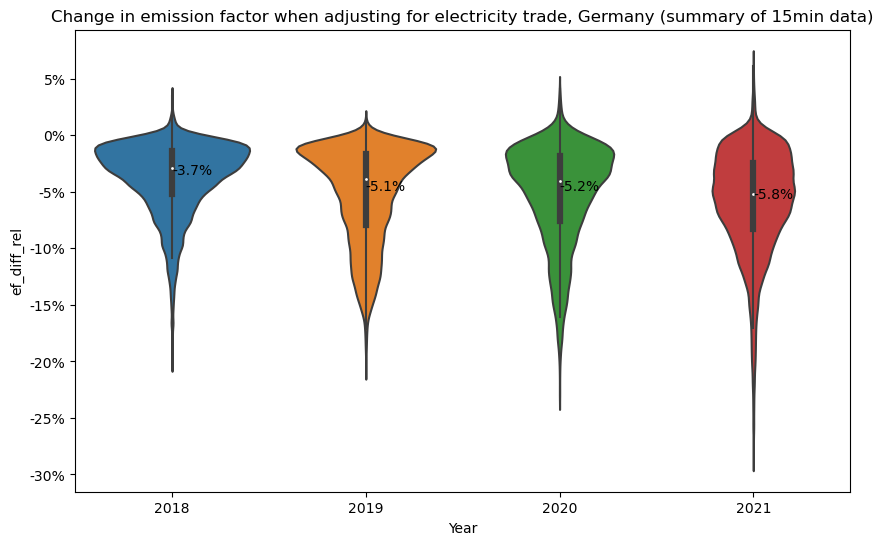

In [86]:
# plot 1: How does the EF change when adjusting for electricity trading?

# Ensure the 'DateTime' column is of datetime type
ef['DateTime'] = pd.to_datetime(ef['DateTime'])

# Extract the year from each date
ef['Year'] = ef['DateTime'].dt.year

# Create a function to convert y values to percentages, rounded to the nearest integer
def to_percent(y, position):
    return str(round(100 * y)) + '%'

# Create a formatter
formatter = FuncFormatter(to_percent)

# Create the violin plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(x='Year', y='ef_diff_rel', data=ef, ax=ax)

# Set the formatter
ax.yaxis.set_major_formatter(formatter)

# Calculate the means and annotate them
for i, year in enumerate(ef['Year'].unique()):
    mean = ef.loc[ef['Year'] == year, 'ef_diff_rel'].mean()
    ax.text(i, mean, f'{mean:.1%}', ha='left', va='bottom')

# Add a title
ax.set_title('Change in emission factor when adjusting for electricity trade, Germany (summary of 15min data)')

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_tradeadjustment_relative' + '.png')
#plt.savefig(plot_path)

# Display the plot
plt.show()

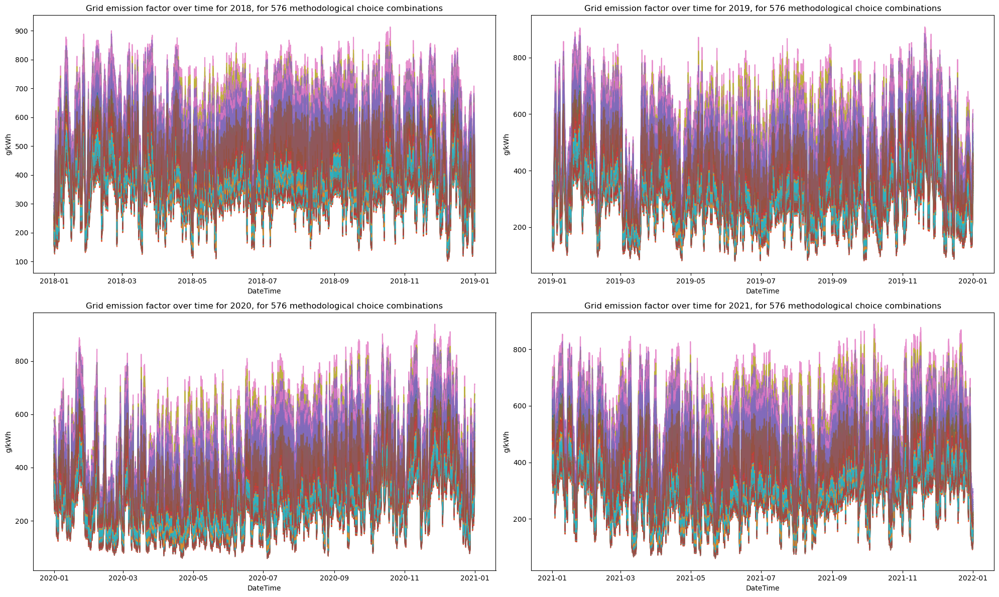

In [87]:
# plot 2: line plot, EF over time

df = ef_prod_cons

# Convert the 'DateTime' column to datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Add a new column for the year
df['Year'] = df['DateTime'].dt.year

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Subset the DataFrame for the current year
    df_year = df[df['Year'] == year]
    
    # Remove the 'DateTime' and 'Year' columns from the columns to plot
    columns_to_plot = df_year.columns.drop(['DateTime', 'Year'])

    for column in columns_to_plot:
        axs[i].plot(df_year['DateTime'], df_year[column], label=column, alpha=0.8)
        
    axs[i].set_xlabel('DateTime')
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Grid emission factor over time for {year}, for 576 methodological choice combinations')

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_prod_cons_de' + '.png')
#plt.savefig(plot_path)

plt.show()

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\3458725025.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_vals_years = df.groupby('Year').mean()


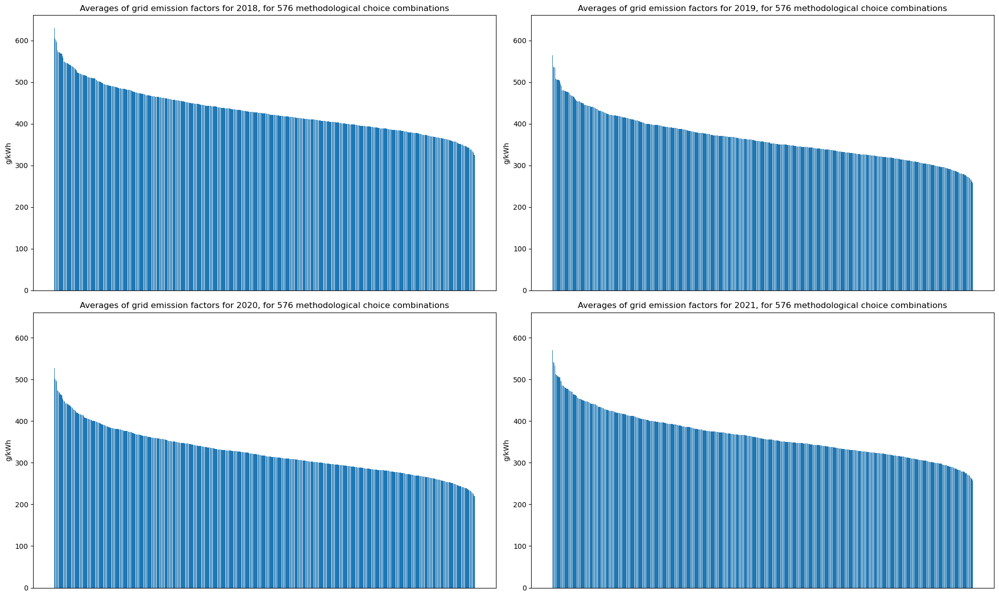

In [88]:
# Plot 3: bar plot, means of ef, sorted

df = ef_prod_cons

# Convert the 'DateTime' column to datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Add a new column for the year
df['Year'] = df['DateTime'].dt.year

# Calculate the means for each year
mean_vals_years = df.groupby('Year').mean()

# Find the global maximum value to set y limit
global_max = 1.05*mean_vals_years.max().max()

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Select the mean values for the current year and sort them
    mean_vals_year = mean_vals_years.loc[year].sort_values(ascending=False)
    
    # Plot the results
    axs[i].bar(mean_vals_year.index, mean_vals_year.values)
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Averages of grid emission factors for {year}, for 576 methodological choice combinations')
    
    # Remove x-tick labels
    axs[i].set_xticks([])

    # Set y limit
    axs[i].set_ylim([0, global_max])

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_prod_cons_mean_de' + '.png')
#plt.savefig(plot_path)

plt.show()

## Storage cycling (pumped hydro)
Here, we consider how the grid emission factor changes when we take into account the losses from pumped hydro storage cycling.

In [ ]:
# We want to calculate the grid emission factor which takes into account pumped hydro losses

# ef_grid_ph_in =
# em_grid_ph_in / en_grid_ph_in =
# em / (en_grid + en_ph_in)

# ef_grid_ph_out =
# em_grid_ph_out / en_grid_ph_out =
# em / (en_grid + en_ph_out) = 
# ef_grid_ph_in * (en_grid + en_ph_in) / (en_grid + en_ph_out) 

# ef_grid_ph_in: ef_nep
# en_grid: nep
# en_ph_in: energy going into pumped hydro plants
# en_ph_out: energy coming out of pumped hydro plants

# ef: emission factor
# em: emissions
# en: energy
# grid: grid
# ph: pumped hydro
# in: going into pumped hydro plants (charging)
# out: going out of pumped hydro plants (discharging)

### Import

In [89]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_input_annual.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_output_annual.pkl')
pickle_path4 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade.pkl')

# Load the pickle file into a DataFrame
en = pd.read_pickle(pickle_path)
en_ph_in = pd.read_pickle(pickle_path2)
en_ph_out = pd.read_pickle(pickle_path3)
ef_in = pd.read_pickle(pickle_path4)

### Calculate

In [90]:
# step 1: filter en_ph_in for Germany
en_ph_in = en_ph_in[(en_ph_in['Country'] == 'Germany')]
en_ph_in

,Country,Year,sum
12,Germany,2018,8445.0
13,Germany,2019,8180.0
14,Germany,2020,8872.0
15,Germany,2021,8156.0


In [91]:
# step 2: filter en for relevant columns, sum up

en = en[['Year', 'Production Type', 'nep_el_map', 'nep_chp_map']]
en ['nep'] = en['nep_el_map'] + en['nep_chp_map']
en_grid = en.groupby('Year')['nep'].sum()
en_grid

Year
2018    554709.0
2019    526506.0
2020    498555.0
2021    507503.0
Name: nep, dtype: float64

In [92]:
# step 3: calculate en_in = en_grid + en_ph_in

en_in = pd.merge(en_grid, en_ph_in, on="Year")
en_in['en_in'] = en_in['nep'] + en_in['sum']
en_in = en_in[['Year', 'en_in']]
en_in

,Year,en_in
0,2018,563154.0
1,2019,534686.0
2,2020,507427.0
3,2021,515659.0


In [93]:
# step 4: calculate en_out = en_grid + en_ph_out

en_out = pd.merge(en_grid, en_ph_out, on="Year")
en_out['en_out'] = en_out['nep'] + en_out['nep_el_map']
en_out = en_out[['Year', 'en_out']]
en_out

,Year,en_out
0,2018,560878.0
1,2019,532446.0
2,2020,505109.0
3,2021,512818.0


In [94]:
# step 5: calculate ratio_in_out = en_in / en_out

ratio = pd.merge(en_in, en_out, on="Year")
ratio['ratio_in_out'] = ratio['en_in'] / ratio['en_out']
ratio = ratio[['Year', 'ratio_in_out']]
ratio

,Year,ratio_in_out
0,2018,1.004058
1,2019,1.004207
2,2020,1.004589
3,2021,1.005540


In [95]:
# step 6: calculate ef_out = ef_in * ratio_in_out

# merge
ef_in['Year'] = ef_in['DateTime'].dt.year.astype('i4')
ef_out = pd.merge(ef_in, ratio, on="Year")

# calculate ef_out from ratio and ef_in
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_'):
            df[col+'_ph'] = df[col] * df['ratio_in_out']
            df.rename(columns={col: col+'_noph'}, inplace=True)
    return df

ef_out = adjust_ef_columns(ef_out)

ef_out

,DateTime,ef_gep_co2_op_el100_maponly_prod_noph,ef_gep_co2_op_el100_apenergy_prod_noph,ef_gep_co2_op_el100_apemissions_prod_noph,ef_gep_co2_op_el100_mapap_prod_noph,ef_gep_co2_op_th100_maponly_prod_noph,ef_gep_co2_op_th100_apenergy_prod_noph,ef_gep_co2_op_th100_apemissions_prod_noph,ef_gep_co2_op_th100_mapap_prod_noph,ef_gep_co2_op_en_maponly_prod_noph,...,ef_nep_gwp20_lc_ex_apemissions_cons_ph,ef_nep_gwp20_lc_ex_mapap_cons_ph,ef_nep_gwp20_lc_iea_maponly_cons_ph,ef_nep_gwp20_lc_iea_apenergy_cons_ph,ef_nep_gwp20_lc_iea_apemissions_cons_ph,ef_nep_gwp20_lc_iea_mapap_cons_ph,ef_nep_gwp20_lc_uba_maponly_cons_ph,ef_nep_gwp20_lc_uba_apenergy_cons_ph,ef_nep_gwp20_lc_uba_apemissions_cons_ph,ef_nep_gwp20_lc_uba_mapap_cons_ph
0,2018-01-01 00:00:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.529327,272.091693,259.786170,242.674925,302.882705,257.285356,262.144027,244.259895,305.240561,258.870326
1,2018-01-01 00:15:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.529327,272.091693,259.786170,242.674925,302.882705,257.285356,262.144027,244.259895,305.240561,258.870326
2,2018-01-01 00:30:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.529327,272.091693,259.786170,242.674925,302.882705,257.285356,262.144027,244.259895,305.240561,258.870326
3,2018-01-01 00:45:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,320.529327,272.091693,259.786170,242.674925,302.882705,257.285356,262.144027,244.259895,305.240561,258.870326
4,2018-01-01 01:00:00,193.848642,181.016487,225.711573,191.493359,158.353260,151.691283,179.513391,155.618600,172.265277,...,315.175167,268.414424,256.265125,239.415812,297.772553,253.805701,258.662024,241.046294,300.169451,255.436183
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.656701,143.810556,190.653349,155.415073,116.781332,109.504904,135.692370,113.072446,132.700925,...,289.906456,239.287195,224.845455,205.064497,269.282294,222.180052,227.397711,206.801164,271.834550,223.916720
140252,2021-12-31 23:00:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,288.108155,237.188444,222.723824,202.828188,267.428702,220.083579,225.371105,204.633805,270.075983,221.889195
140253,2021-12-31 23:15:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,288.108155,237.188444,222.723824,202.828188,267.428702,220.083579,225.371105,204.633805,270.075983,221.889195
140254,2021-12-31 23:30:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,288.108155,237.188444,222.723824,202.828188,267.428702,220.083579,225.371105,204.633805,270.075983,221.889195


### Check

In [96]:
# A) Absolute differences
# We expect the ef to increase when taking into account ph
# step 1: calculate difference of the mean ef before and after taking into account ph

# Filter columns that start with 'ef_' and end with '_ph'
columns_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_ph')]

# Filter columns that start with 'ef_' and do not end with '_ph'
columns_non_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_noph')]

# Calculate the means for each group of columns
mean_ph = ef_out[columns_ph].mean(axis=1)
mean_non_ph = ef_out[columns_non_ph].mean(axis=1)

# Calculate the difference of the column means
diff_abs = mean_ph - mean_non_ph

# Print the result
diff_abs

0         0.868441
1         0.868441
2         0.868441
3         0.868441
4         0.856007
            ...   
140251    0.966487
140252    0.961220
140253    0.961220
140254    0.961220
140255    0.961220
Length: 140256, dtype: float64

In [97]:
# A) Absolute differences
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_abs = diff_abs.describe()

# Print the result
description_abs

count    140256.000000
mean          1.700906
std           0.517074
min           0.484037
25%           1.336229
50%           1.726016
75%           2.067979
max           3.077400
dtype: float64

In [98]:
# B) Relative differences
# Same as for absolute differences, but now relative
# step 1: calculate difference of the mean ef before and after taking into account ph

# Filter columns that start with 'ef_' and end with '_ph'
columns_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_ph')]

# Filter columns that start with 'ef_' and do not end with '_ph'
columns_non_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_noph')]

# Calculate the means for each group of columns
mean_ph = ef_out[columns_ph].mean(axis=1)
mean_non_ph = ef_out[columns_non_ph].mean(axis=1)

# Calculate the difference of the column means
diff_rel = (mean_ph - mean_non_ph) / mean_non_ph

# Print the result
diff_rel

0         0.004058
1         0.004058
2         0.004058
3         0.004058
4         0.004058
            ...   
140251    0.005540
140252    0.005540
140253    0.005540
140254    0.005540
140255    0.005540
Length: 140256, dtype: float64

In [99]:
# B) Relative differences
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_rel = diff_rel.describe()

# Print the result
description_rel

count    140256.000000
mean          0.004598
std           0.000577
min           0.004058
25%           0.004207
50%           0.004589
75%           0.004589
max           0.005540
dtype: float64

### Save

In [100]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'gec_annual_de.pkl')

# Save the dataframe to a pickle file
ef_out.to_pickle(pickle_path)
en_out.to_pickle(pickle_path2)

### Plot

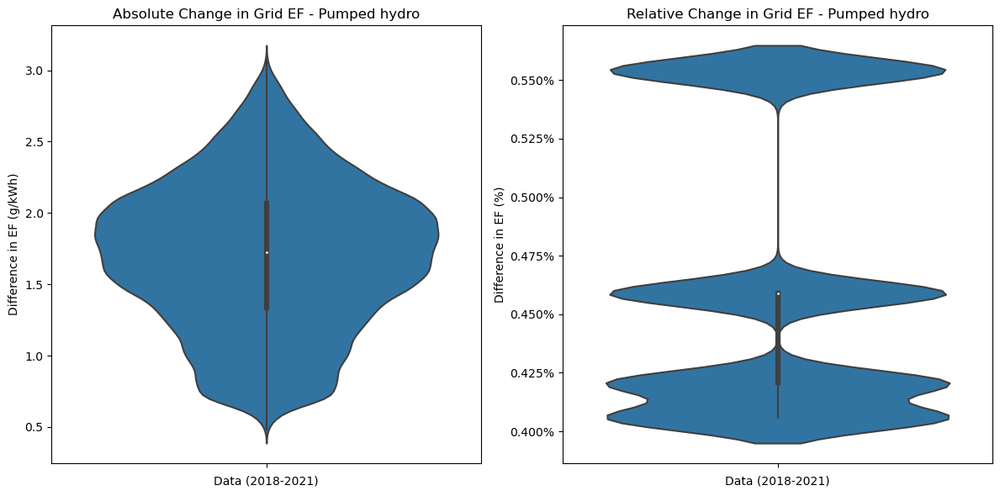

In [101]:
# Create a figure and a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# plot distribution: how much does the ef change when taking into account pumped hydro (absolute values)
# Create a violin plot for diff_abs on the left subplot
sns.violinplot(y=diff_abs, ax=axes[0])

# Add labels and title
axes[0].set_xlabel('Data (2018-2021)')
axes[0].set_ylabel('Difference in EF (g/kWh)')
axes[0].set_title('Absolute Change in Grid EF - Pumped hydro')

# plot distribution: how much does the ef change when taking into account pumped hydro (relative values)
# Create a violin plot for diff_rel on the right subplot
sns.violinplot(y=diff_rel, ax=axes[1])

# Add labels and title
axes[1].set_xlabel('Data (2018-2021)')
axes[1].set_ylabel('Difference in EF (%)')
axes[1].set_title('Relative Change in Grid EF - Pumped hydro')

# Format the y-axis labels to show percentage
formatter = FuncFormatter(lambda y, _: '{:.3%}'.format(y))
axes[1].yaxis.set_major_formatter(formatter)

# Adjust layout
fig.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_ph_comparison' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

## Grid losses (T&D)
Here, we consider how the grid emission factor changes when we take into account the transformation and distribution losses in the grid.

In [ ]:
# to calculate ef including transformation & distribution losses:
# assuming emissions are constant:
# em = ef_gec * gec = ef_nec * nec
# ef_nec = ef_gec * (gec/nec) = 
# ef_gec * (gec/(gec-losses))

# em: emissions
# ef: emission factor
# gec: gross electricity consumption (before losses)
# nec: net electricity consumption (after losses)

### Import

In [102]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'distribution_losses.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'gec_annual_de.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph.pkl')

# Load the pickle file into a DataFrame
dl = pd.read_pickle(pickle_path)
gec = pd.read_pickle(pickle_path2)
ef = pd.read_pickle(pickle_path3)

### Calculate

In [103]:
# step 1: filter dl for Germany
dl = dl[(dl['Country'] == 'Germany')]
dl

,Country,Year,losses
12,Germany,2018,26661.0
13,Germany,2019,27474.0
14,Germany,2020,26939.0
15,Germany,2021,26582.0


In [104]:
# step 2: calculate nec = gec-losses

nec = pd.merge(gec, dl, on="Year")
nec['nec'] = nec['en_out'] - nec['losses']
nec = nec[['Year', 'nec']]
nec

,Year,nec
0,2018,534217.0
1,2019,504972.0
2,2020,478170.0
3,2021,486236.0


In [105]:
# step 3: calculate ratio = gec / nec

ratio = pd.merge(gec, nec, on="Year")
ratio['ratio'] = ratio['en_out'] / ratio['nec']
ratio = ratio[['Year', 'ratio']]
ratio

,Year,ratio
0,2018,1.049907
1,2019,1.054407
2,2020,1.056338
3,2021,1.054669


In [106]:
# step 4: calculate ef_nec = ef_gec * ratio (gec: nodl, nec: dl)

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# merge
ef_nec = pd.merge(ef, ratio, on="Year")

# calculate ef_out from ratio and ef_in
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_'):
            df[col+'_dl'] = df[col] * df['ratio']
            df.rename(columns={col: col+'_nodl'}, inplace=True)
    return df

# apply function
ef_nec = adjust_ef_columns(ef_nec)

ef_nec

,DateTime,ef_gep_co2_op_el100_maponly_prod_noph_nodl,ef_gep_co2_op_el100_apenergy_prod_noph_nodl,ef_gep_co2_op_el100_apemissions_prod_noph_nodl,ef_gep_co2_op_el100_mapap_prod_noph_nodl,ef_gep_co2_op_th100_maponly_prod_noph_nodl,ef_gep_co2_op_th100_apenergy_prod_noph_nodl,ef_gep_co2_op_th100_apemissions_prod_noph_nodl,ef_gep_co2_op_th100_mapap_prod_noph_nodl,ef_gep_co2_op_en_maponly_prod_noph_nodl,...,ef_nep_gwp20_lc_ex_apemissions_cons_ph_dl,ef_nep_gwp20_lc_ex_mapap_cons_ph_dl,ef_nep_gwp20_lc_iea_maponly_cons_ph_dl,ef_nep_gwp20_lc_iea_apenergy_cons_ph_dl,ef_nep_gwp20_lc_iea_apemissions_cons_ph_dl,ef_nep_gwp20_lc_iea_mapap_cons_ph_dl,ef_nep_gwp20_lc_uba_maponly_cons_ph_dl,ef_nep_gwp20_lc_uba_apenergy_cons_ph_dl,ef_nep_gwp20_lc_uba_apemissions_cons_ph_dl,ef_nep_gwp20_lc_uba_mapap_cons_ph_dl
0,2018-01-01 00:00:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,336.525883,285.670887,272.751237,254.786026,317.998577,270.125616,275.226766,256.450097,320.474106,271.789686
1,2018-01-01 00:15:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,336.525883,285.670887,272.751237,254.786026,317.998577,270.125616,275.226766,256.450097,320.474106,271.789686
2,2018-01-01 00:30:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,336.525883,285.670887,272.751237,254.786026,317.998577,270.125616,275.226766,256.450097,320.474106,271.789686
3,2018-01-01 00:45:00,196.546039,183.506915,229.594818,194.127680,160.287439,153.531022,182.439803,157.505892,174.432939,...,336.525883,285.670887,272.751237,254.786026,317.998577,270.125616,275.226766,256.450097,320.474106,271.789686
4,2018-01-01 01:00:00,193.848642,181.016487,225.711573,191.493359,158.353260,151.691283,179.513391,155.618600,172.265277,...,330.904515,281.810099,269.054468,251.364262,312.633394,266.472302,271.570988,253.076116,315.149914,268.184156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.656701,143.810556,190.653349,155.415073,116.781332,109.504904,135.692370,113.072446,132.700925,...,305.755330,252.368769,237.137514,216.275153,284.003668,234.326397,239.829300,218.106762,286.695453,236.158006
140252,2021-12-31 23:00:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,303.858718,250.155281,234.899896,213.916587,282.048742,232.115312,237.691901,215.820915,284.840747,234.019639
140253,2021-12-31 23:15:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,303.858718,250.155281,234.899896,213.916587,282.048742,232.115312,237.691901,215.820915,284.840747,234.019639
140254,2021-12-31 23:30:00,158.635165,143.508573,191.151372,155.315666,116.177172,108.837808,135.280395,112.404773,132.418035,...,303.858718,250.155281,234.899896,213.916587,282.048742,232.115312,237.691901,215.820915,284.840747,234.019639


### Check

In [107]:
# A) Absolute values
# We expect the ef to increase when taking into account dl
# step 1: calculate difference of the mean ef before and after taking into account dl

# Assuming you have the DataFrame 'ef_out' already defined.

# Filter columns that start with 'ef_' and end with '_dl'
columns_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_dl')]

# Filter columns that start with 'ef_' and do not end with '_dl'
columns_non_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_nodl')]

# Calculate the means for each group of columns
mean_dl = ef_nec[columns_dl].mean(axis=1)
mean_non_dl = ef_nec[columns_non_dl].mean(axis=1)

# Calculate the difference of the column means
diff_abs = mean_dl - mean_non_dl

# Print the result
diff_abs

0         10.702255
1         10.702255
2         10.702255
3         10.702255
4         10.549026
            ...    
140251     9.563791
140252     9.511667
140253     9.511667
140254     9.511667
140255     9.511667
Length: 140256, dtype: float64

In [108]:
# A) Absolute values
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_abs = diff_abs.describe()

# Print the result
description_abs

count    140256.000000
mean         19.968921
std           5.625134
min           5.862278
25%          15.999146
50%          20.615490
75%          24.386789
max          33.329853
dtype: float64

In [109]:
# B) Relative values
# We expect the ef to increase when taking into account dl
# step 1: calculate difference of the mean ef before and after taking into account dl

# Assuming you have the DataFrame 'ef_out' already defined.

# Filter columns that start with 'ef_' and end with '_dl'
columns_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_dl')]

# Filter columns that start with 'ef_' and do not end with '_dl'
columns_non_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_nodl')]

# Calculate the means for each group of columns
mean_dl = ef_nec[columns_dl].mean(axis=1)
mean_non_dl = ef_nec[columns_non_dl].mean(axis=1)

# Calculate the difference of the column means
diff_rel = (mean_dl - mean_non_dl) / mean_non_dl

# Print the result
diff_rel

0         0.049907
1         0.049907
2         0.049907
3         0.049907
4         0.049907
            ...   
140251    0.054669
140252    0.054669
140253    0.054669
140254    0.054669
140255    0.054669
Length: 140256, dtype: float64

In [110]:
# B) Relative values
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_rel = diff_rel.describe()

# Print the result
description_rel

count    140256.000000
mean          0.053832
std           0.002383
min           0.049907
25%           0.054407
50%           0.054669
75%           0.056338
max           0.056338
dtype: float64

### Save

In [111]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'nec_annual_de.pkl')

# Save the dataframe to a pickle file
ef_nec.to_pickle(pickle_path)
nec.to_pickle(pickle_path2)

### Plot

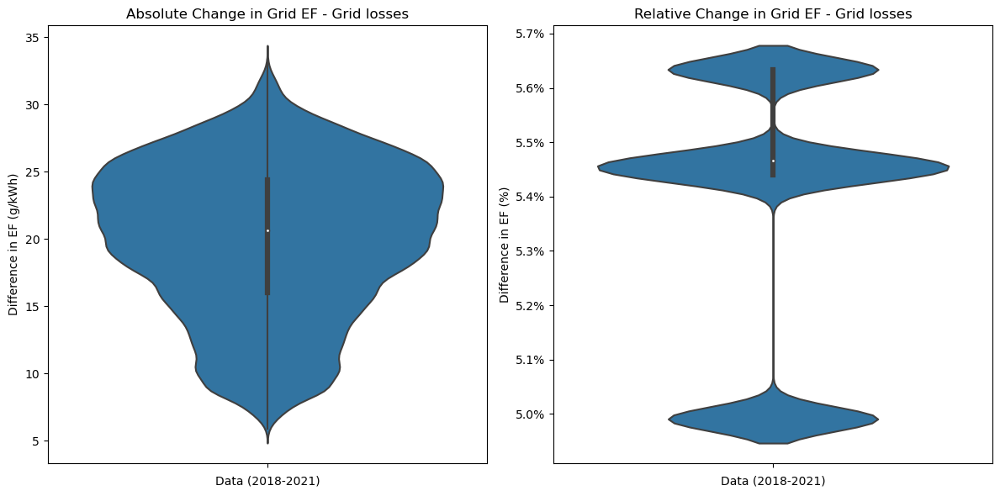

In [112]:
# Create a figure and a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# plot distribution: how much does the ef change when taking into account grid losses (absolute values)
# Create a violin plot for diff_abs on the left subplot
sns.violinplot(y=diff_abs, ax=axes[0])

# Add labels and title
axes[0].set_xlabel('Data (2018-2021)')
axes[0].set_ylabel('Difference in EF (g/kWh)')
axes[0].set_title('Absolute Change in Grid EF - Grid losses')

# plot distribution: how much does the ef change when taking into account grid losses (relative values)
# Create a violin plot for diff_rel on the right subplot
sns.violinplot(y=diff_rel, ax=axes[1])

# Add labels and title
axes[1].set_xlabel('Data (2018-2021)')
axes[1].set_ylabel('Difference in EF (%)')
axes[1].set_title('Relative Change in Grid EF - Grid losses')

# Format the y-axis labels to show percentage
formatter = FuncFormatter(lambda y, _: '{:.1%}'.format(y))
axes[1].yaxis.set_major_formatter(formatter)

# Adjust layout
fig.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_dl_comparison' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

# Plot results

In [2]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

## Overall

### EF over time

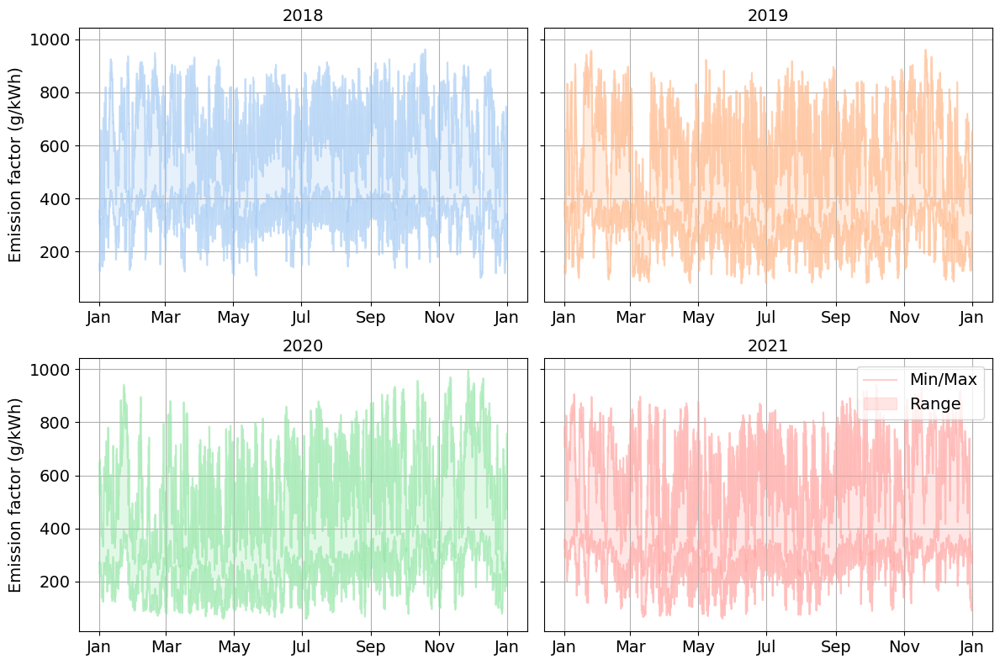

In [8]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Specify the pastel color palette
colors = sns.color_palette("pastel", 4)

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):
    # Subset the DataFrame for the current year
    ef_year = ef[ef['Year'] == year]
    
    # define non-zero columns
    non_zero_columns = ef_year.columns[(ef_year != 0).any()].drop(['DateTime', 'Year'])
    
    # Define function to get min column
    def get_min_column(ef_year, non_zero_columns):
        valid_columns = ef_year[non_zero_columns].columns[ef_year[non_zero_columns].mean() > 10]
        return ef_year[valid_columns].mean().idxmin()
    
    # Get the column with the largest average
    max_column = ef_year[non_zero_columns].mean().idxmax()
    # Get the column with the smallest average
    min_column = get_min_column(ef_year, non_zero_columns)
    
    # Plot the lines and capture the Line2D objects
    line_max, = axs[i].plot(ef_year['DateTime'], ef_year[max_column], color=colors[i], alpha=0.5)
    line_min, = axs[i].plot(ef_year['DateTime'], ef_year[min_column], color=colors[i], alpha=0.5)
    
    # Shade the area between the two columns
    axs[i].fill_between(ef_year['DateTime'], ef_year[max_column], ef_year[min_column], color=colors[i], alpha=0.25)
    
    # Add the year as the title of the subplot
    axs[i].set_title(year, fontsize=14)
    
    # Label y-axis only for the left subplots (0 and 2)
    if i % 2 == 0:
        axs[i].set_ylabel('Emission factor (g/kWh)', fontsize=14)
        
    # Format x-axis
    month_locator = mdates.MonthLocator(interval=2)
    month_formatter = mdates.DateFormatter('%b')
    axs[i].xaxis.set_major_locator(month_locator)
    axs[i].xaxis.set_major_formatter(month_formatter)
    
    axs[i].tick_params(axis='both', labelsize=14)
    axs[i].grid(True, which='major')
    
    # Create patch for legend
    custom_patch = Patch(color=colors[i], alpha=0.25, label='Shaded Area')
    
    # Add legend to the top right corner of the bottom right subplot
    if i == 3:
        axs[i].legend([line_max, custom_patch], ['Min/Max', 'Range'], loc='upper right', fontsize=14)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'overall', 'ef_over_time' + '.png')
plt.savefig(plot_path)

plt.show()

### Mean annual EF, histogram

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_14248\2000780956.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_14248\2000780956.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_14248\2000780956.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_14248\2000780956.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. 

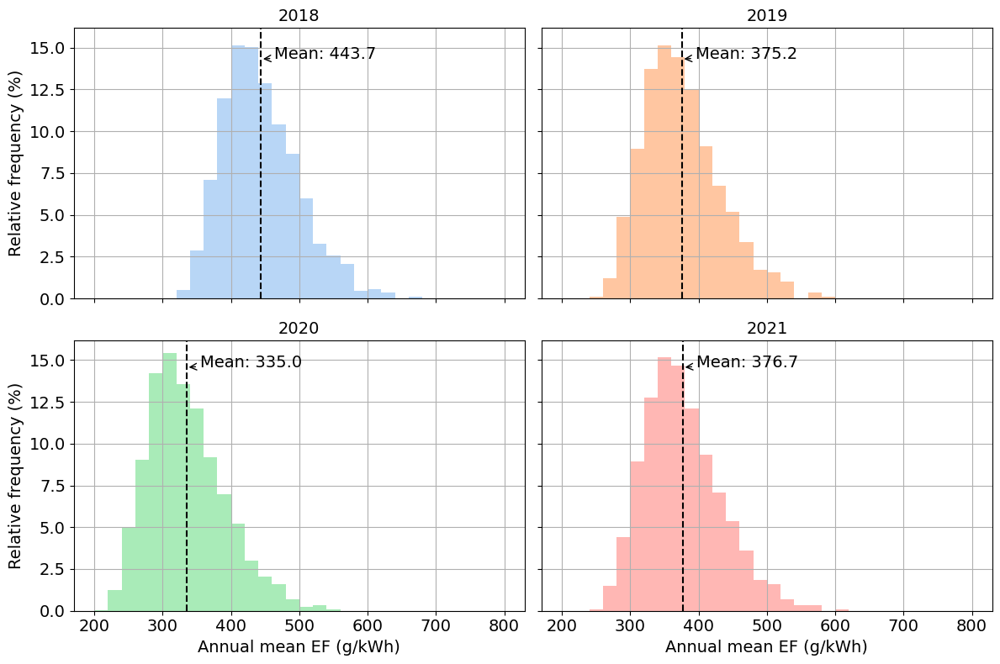

In [16]:
# working copy
df = ef

# Make sure DateTime column is in datetime format
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Extract year from DateTime
df['Year'] = df['DateTime'].dt.year

# Select the columns starting with "ef_"
ef_columns = df.filter(regex='^ef_')

# Initialize a DataFrame to hold the annual mean values
annual_means = pd.DataFrame()

# Loop through each year and calculate the mean
for year in range(2018, 2022):
    # Select the data for this year
    data = df[df['Year'] == year]
    # Calculate the mean of the selected columns
    annual_mean = ef_columns.loc[data.index].mean()
    # Append the result to the annual_means DataFrame
    annual_means = annual_means.append(annual_mean, ignore_index=True)

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()

# Define the bins for the histogram
bins = range(200, 801, 20)

# Define the color palette
palette = sns.color_palette("pastel", 4)

for i, year in enumerate(range(2018, 2022)):
    ax = axs[i]
    
    # Select the data for this year
    data = annual_means.iloc[i]
    
    # Calculate the median
    mean_value = data.mean()
    
    # Plot the histogram
    sns.histplot(data, bins=bins, color=palette[i], edgecolor=None, stat="percent", ax=ax)
    
    # Add median line
    ax.axvline(mean_value, color='k', linestyle='--')
    
    # Add median label
    ax.annotate(f'Mean: {mean_value:.1f}',
                xy=(mean_value, ax.get_ylim()[1] * 0.9), 
                xytext=(mean_value + 20, ax.get_ylim()[1] * 0.9),
                fontsize=14,
                arrowprops=dict(facecolor='black', arrowstyle='->'))
    
    # Set the title and labels
    ax.set_title(year, fontsize = 14)
    ax.set_ylabel('Relative frequency (%)', fontsize = 14)
    ax.set_xlabel('Annual mean EF (g/kWh)', fontsize = 14)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'overall', 'ef_histogram' + '.png')
plt.savefig(plot_path)

plt.show()

## Individual effects

### Define functions

#### Violin plots

##### Single plot (all years in one)

In [116]:
def create_violinplot(df,
                      expressions,
                      save_file=False,
                      file_name='plot.png', 
                      file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                      xtick_labels=None,
                      legend_labels=None,
                      legend_title='Expression'):
    """
    Create a violin plot.
    """
    # Get the first color of the seaborn's pastel color palette
    first_color = sns.color_palette("pastel")[0]
    
    # Generate slight variations of the first color
    color_variations = [(min(1, first_color[0] * factor), 
                         min(1, first_color[1] * factor), 
                         min(1, first_color[2] * factor)) 
                        for factor in [0.8, 0.9, 1, 1.1, 1.2, 1.3]]

    # Make sure the color variations list has the same length as the expressions list
    color_variations = color_variations[:len(expressions)]
    
    # Create a palette dictionary mapping each expression to a color
    palette = {expression: color for expression, color in zip(expressions, color_variations)}

    # Create a violin plot for all years, ensuring the order of the violins match the expressions order
    plt.figure(figsize=(10, 7))
    ax = sns.violinplot(x="Expression", y="value", data=df, palette=palette, order=expressions,
                        inner=None)  # Remove the inner boxplot
    
    # Calculate mean values for each expression
    mean_values = {expression: df[df['Expression'] == expression]['value'].mean()
                   for expression in expressions}

    # Add a dot at the mean position of each violin with grey color
    grey_color = (0.5, 0.5, 0.5)  # RGB tuple for medium grey
    for i, expression in enumerate(expressions):
        mean_val = mean_values[expression]
        ax.scatter(x=i, y=mean_val, zorder=2, color=grey_color)
    
    # Customize the appearance
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    # Calculate the mean values for each expression for all years
    mean_values = {expression: df[df['Expression'] == expression]['value'].mean()
                   for expression in expressions}
    
    # Calculate the differences between mean values and the first expression
    diff_values = {expression: ((mean_values[expression] - mean_values[expressions[0]]) / mean_values[expressions[0]]) * 100
                   for expression in expressions}

    # Add mean values and relative differences as text labels
    label_offset = 30  # Adjust this value to move the labels up or down
    for i, expression in enumerate(expressions):
        mean_val = mean_values[expression]
        offset = 0.0  # Adjust this value to move the labels left or right
        ax.text(i + offset, mean_val + label_offset, f'{mean_val:.0f}', ha='center', va='center', fontsize=14, color='black')
        if i != 0:
            diff = diff_values[expression]
            ax.text(i + offset, mean_val - label_offset, f'({diff:+.1f}%)', ha='center', va='center', fontsize=14, color='black')

    # Set the y-axis label and title
    ax.set_ylabel("Emission factor (g/kWh)", fontsize=14)
    ax.set_xlabel("", fontsize=14)
    #plt.title(plot_title, fontsize=14)

    '''# Manually add a legend, ensuring the order of the legend matches the expressions order
    legend_labels = legend_labels or expressions
    legend_elements = [Patch(facecolor=palette[expression], label=label) for expression, label in zip(expressions, legend_labels)]
    ax.legend(handles=legend_elements, title=legend_title, fontsize=14, title_fontsize=14)'''

    # Customize the x-tick labels if provided
    if xtick_labels is not None:
        ax.set_xticklabels(xtick_labels)

    # Save plot if required
    if save_file:
        plot_path = os.path.join(file_path, file_name)
        plt.savefig(plot_path)

    # Show the plot
    plt.show()

##### Multi plot (disaggregated per year)

In [9]:
def create_violinplot_multiyear(df,
                                expressions,
                                save_file=False,
                                file_name='plot.png', 
                                file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                                xtick_labels=None,
                                legend_labels=None,
                                legend_title='Expression'):
    """
    Create a violin plot for each year.
    """
    # Get the first four colors of the Seaborn pastel color palette
    base_colors = sns.color_palette("pastel", 4)  # [blue, green, red, yellow]

    # Create a FacetGrid with 2x2 layout for each year
    g = sns.FacetGrid(df, col="Year", row_order=[2018, 2019, 2020, 2021], height=4, aspect=1.25, col_wrap=2)
    
    # Adjust the spacing at the top of the subplots
    g.fig.subplots_adjust(top=0.9)  # Adjust this value as needed

    # Loop through the axes and their corresponding year values in the 'Year' column
    for ax_idx, (ax, year) in enumerate(zip(g.axes.flat, g.col_names)):
        # Get the base color for this subplot
        base_color = base_colors[ax_idx % 4]
        
        # Generate slight variations of the base color
        color_variations = [(min(1, base_color[0] * factor), 
                             min(1, base_color[1] * factor), 
                             min(1, base_color[2] * factor)) 
                            for factor in [0.8, 0.9, 1, 1.1, 1.2, 1.3]]

        # Create a palette dictionary mapping each expression to a color
        palette = {expression: color for expression, color in zip(expressions, color_variations)}

        # Create the violin plots for this subplot
        sns.violinplot(x="Expression", y="value", data=df[df['Year'] == year], palette=palette, ax=ax, order=expressions, inner=None)

        # Calculate mean values and differences for this year
        year_df = df[df['Year'] == year]
        mean_values = {expression: year_df[year_df['Expression'] == expression]['value'].mean()
                       for expression in expressions}
        diff_values = {expression: ((mean_values[expression] - mean_values[expressions[0]]) / mean_values[expressions[0]]) * 100
                       for expression in expressions}

        # Add grey dots at mean positions and text labels
        grey_color = (0.5, 0.5, 0.5)  # RGB tuple for medium grey
        label_offset = 45  # Adjust this value to move the labels up or down
        for i, expression in enumerate(expressions):
            mean_val = mean_values[expression]
            ax.scatter(x=i, y=mean_val, zorder=2, color=grey_color)
            ax.text(i, mean_val + label_offset, f'{mean_val:.0f}', ha='center', va='center', fontsize=14, color='black')
            if i != 0:
                diff = diff_values[expression]
                ax.text(i, mean_val - label_offset, f'({diff:+.1f}%)', ha='center', va='center', fontsize=14, color='black')

        # Set title and labels for this subplot
        ax.set_title(year, fontsize=14)
        ax.set_xlabel("")
        ax.set_ylabel("Emission factor (g/kWh)", fontsize=14)
        ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)

    # Customize the x-tick labels if provided
    if xtick_labels is not None:
        g.set_xticklabels(xtick_labels, fontsize=14)
    else:
        g.set_xticklabels(expressions, fontsize=14)

    # Save plot if required
    if save_file:
        plot_path = os.path.join(file_path, file_name)
        plt.savefig(plot_path)

    plt.show()  # Show the plot

### Sample data
To reduce computational load, we only plot a sample of the data. To ensure the sample data is representative of the whole dataset, we test this here.

#### Create

In [103]:
# part 1: define expressions of interest
# here: use impact metric as example

# working copy
df = ef # adjust if necessary

# optional: ignore warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Create a dictionary of patterns for each expression
expressions = {
    'gwp100': '_gwp100_|DateTime|Year', # adjust
    'co2': '_co2_|DateTime|Year', # adjust
    'gwp20': '_gwp20_|DateTime|Year' # adjust
}

# Initialize an empty dictionary to hold the DataFrames
df_dict = {}

# Loop over the expressions and process each one
for expression, pattern in expressions.items():
    # Subset the DataFrame
    df_subset = df.filter(regex=pattern)
    # Add 'Year' back to the DataFrame
    df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
    # Melt the DataFrame
    df_subset = df_subset.melt(id_vars=['DateTime', 'Year'], var_name='column', value_name='value')
    # Add 'expression' column
    df_subset['Expression'] = expression
    # Store the DataFrame in the dictionary
    df_dict[expression] = df_subset

# Concatenate the dataframes
df_expression = pd.concat(df_dict.values())

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [104]:
# part 2: pick a random sample from the data

sample_size = int(0.10 * len(df_expression)) # e.g. 10 % of the dataframe's length
df_sample = df_expression.sample(n=sample_size)

#### Test

In [105]:
# part 3: test how representative the sample is

# Get the list of numeric columns
numeric_cols = df_expression.select_dtypes(include=[np.number]).columns.tolist()

# Initialize an empty dataframe to store the results
results = pd.DataFrame(columns=['Column',
                                'Population_Mean',
                                'Sample_Mean',
                                'Population_Median',
                                'Sample_Median',
                                'Population_Std',
                                'Sample_Std'])

# Loop over the numeric columns and calculate the statistics
for col in numeric_cols:
    pop_mean = df_expression[col].mean()
    sample_mean = df_sample[col].mean()
    pop_median = df_expression[col].median()
    sample_median = df_sample[col].median()
    pop_std = df_expression[col].std()
    sample_std = df_sample[col].std()
    
    results = results.append({
        'Column': col,
        'Population_Mean': pop_mean,
        'Sample_Mean': sample_mean,
        'Population_Median': pop_median,
        'Sample_Median': sample_median,
        'Population_Std': pop_std,
        'Sample_Std': sample_std
    }, ignore_index=True)

print(results)

  Column  Population_Mean  Sample_Mean  Population_Median  Sample_Median  \
0   Year      2019.500342  2019.500511        2020.000000    2020.000000   
1  value       383.021393   383.038526         385.636066     385.656449   

   Population_Std  Sample_Std  
0        1.117728    1.117731  
1      126.029844  126.023916  


#### Save

In [22]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_sample_10percent_plots.pkl')


# Save the dataframe to a pickle file
df_sample.to_pickle(pickle_path)

### Create plots

In [4]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_sample_10percent_plots.pkl')

# Load the pickle file into a DataFrame
df_sample = pd.read_pickle(pickle_path)

#### Impact metric

##### Prepare data

In [5]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["co2", "gwp100", "gwp20"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,gwp100
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,gwp100
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,gwp100
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,gwp20
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,gwp20
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,gwp20
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,gwp20
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,gwp100
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,gwp20


##### Violin plot

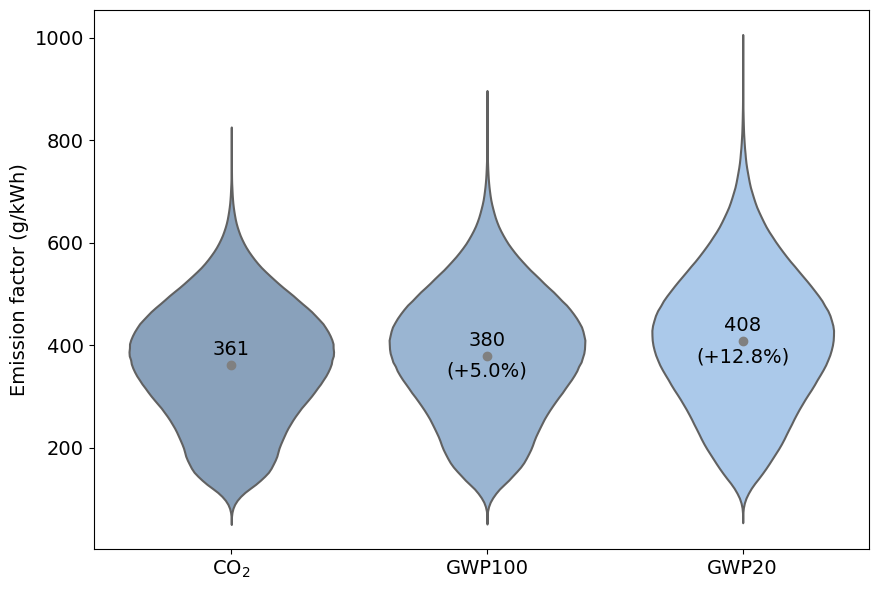

In [120]:
# create plot
create_violinplot(df_sample,
                  ["co2", "gwp100", "gwp20"],
                  save_file=True,
                  file_name='impact_metric.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_title='Impact metric')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


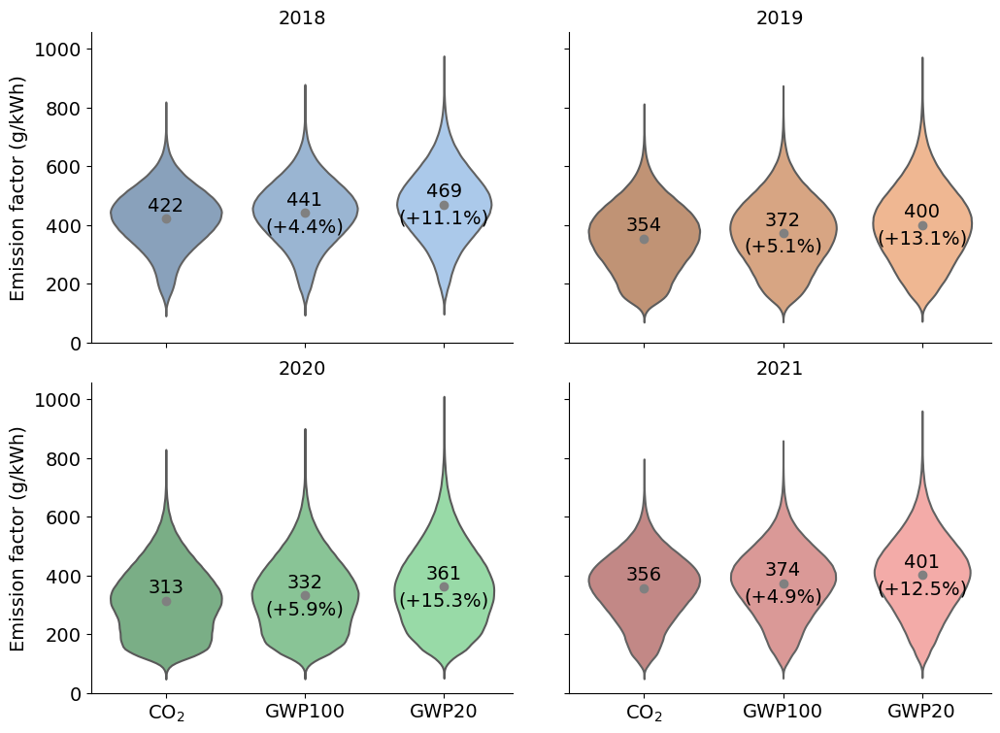

In [10]:
# create multiplot
create_violinplot_multiyear(df_sample,
                  ["co2", "gwp100", "gwp20"],
                  save_file=True,
                  file_name='impact_metric.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_title='Impact metric')

#### System boundaries

##### Prepare data

In [49]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["op", "lc"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,op
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,lc
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,lc
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,lc
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,lc
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,lc
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,lc
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,lc
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,op


##### Violin plot

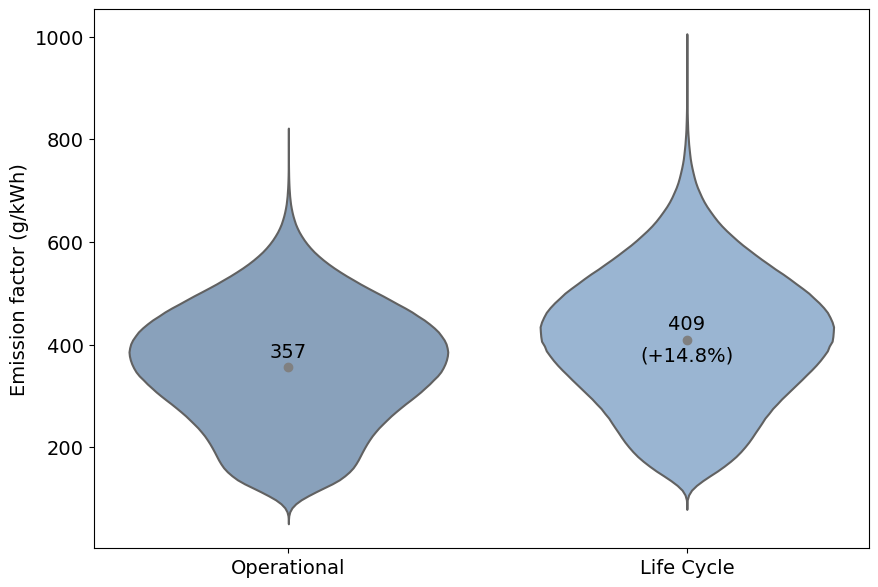

In [50]:
# create plot
create_violinplot(df_sample,
                  ["op", "lc"],
                  save_file=True,
                  file_name='system_boundaries.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["Operational", "Life Cycle"],
                  legend_labels=["Operational", "Life Cycle"],
                  legend_title='System boundaries')

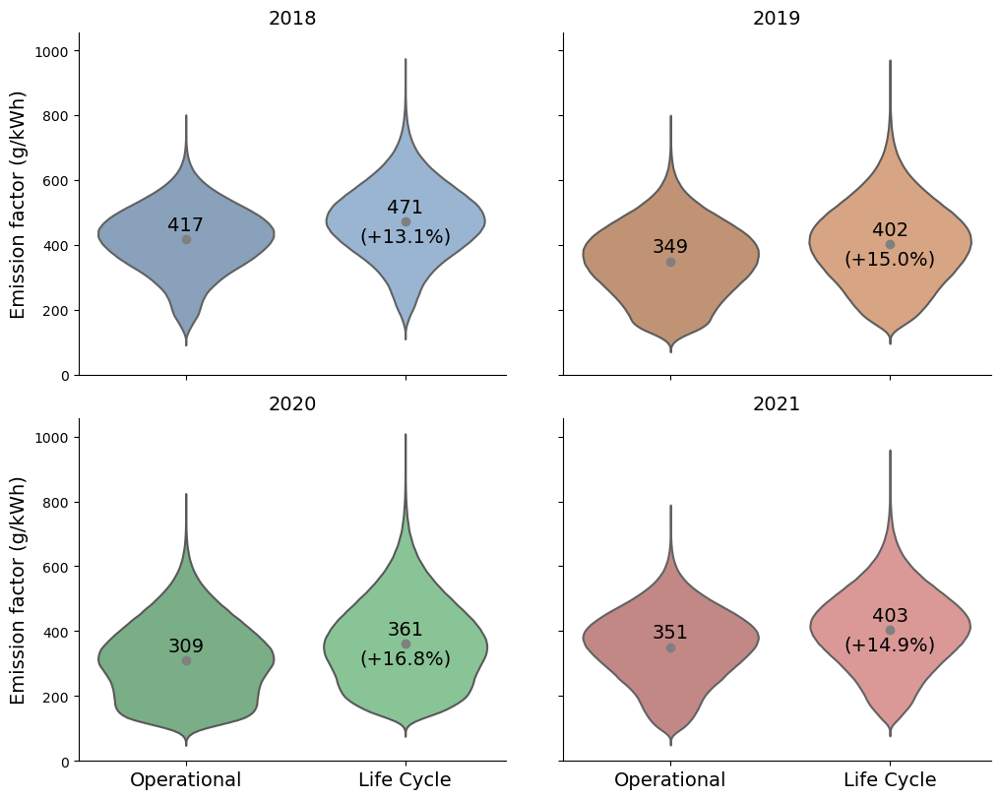

In [51]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["op", "lc"], 
                  save_file=True,
                  file_name='system_boundaries.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["Operational", "Life Cycle"],
                  legend_labels=["Operational", "Life Cycle"],
                  legend_title='System boundaries')

#### Co-generation of heat

##### Prepare data

In [11]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["th100", "en", "iea", "uba", "ex", "el100"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,en
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,iea
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,th100
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,uba
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,el100
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,uba
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,th100
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,uba
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,uba


##### Violin plot

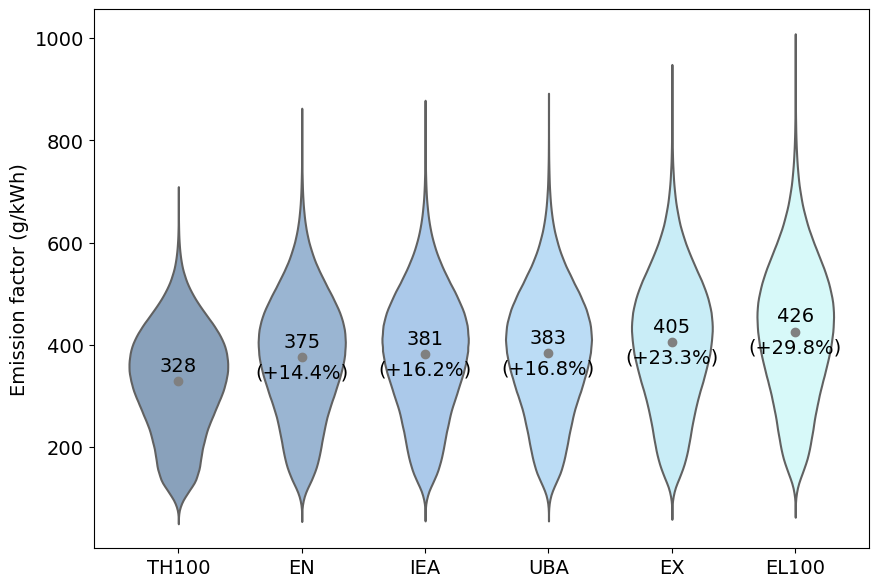

In [53]:
# create plot
create_violinplot(df_sample,
                  ["th100", "en", "iea", "uba", "ex", "el100"],
                  save_file=True,
                  file_name='cogen_allocation.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_title='Allocation method')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


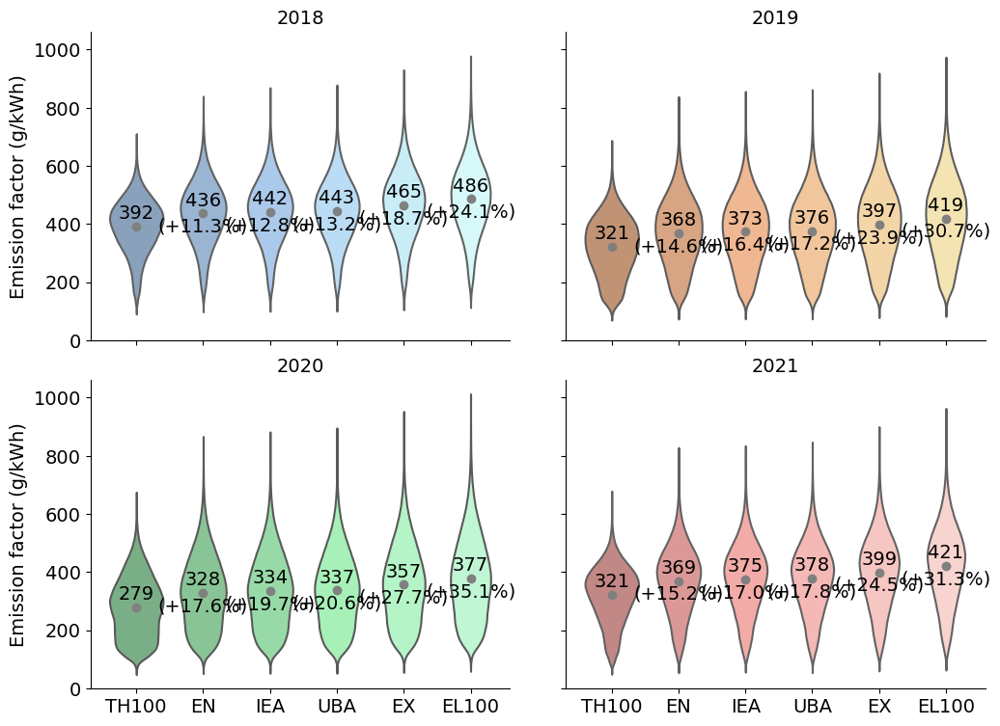

In [12]:
# create plot - caution: different function
create_violinplot_multiyear(df_sample,
                  ["th100", "en", "iea", "uba", "ex", "el100"], 
                  save_file=True,
                  file_name='cogen_allocation.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_title='Allocation method')

#### Auxiliary consumption

##### Prepare data

In [13]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["gep", "nep"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,nep
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,nep
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,gep
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,gep
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,nep
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,gep
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,gep
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,nep
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,gep


##### Violin plot

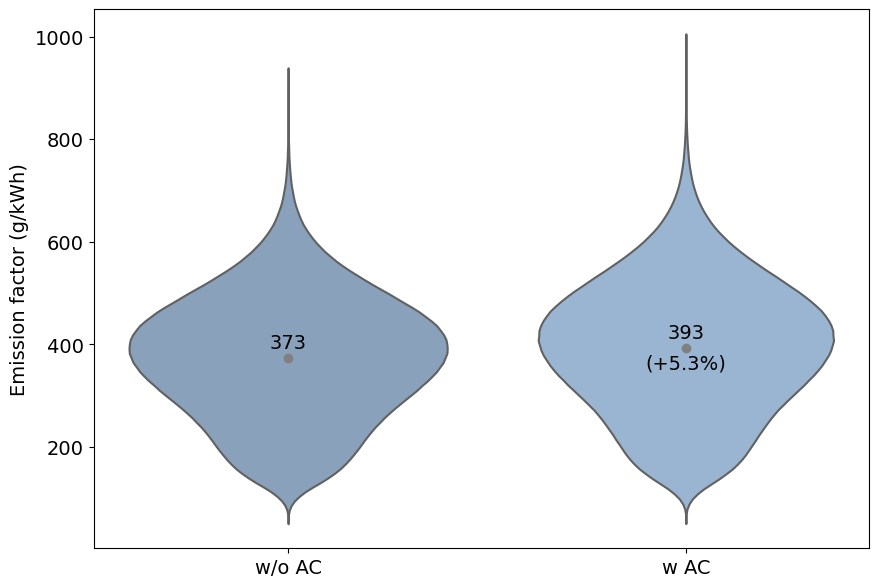

In [56]:
# create plot
create_violinplot(df_sample,
                  ["gep", "nep"],
                  save_file=True,
                  file_name='aux_cons.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o AC", "w AC"],
                  legend_labels=["w/o AC", "w AC"],
                  legend_title='Auxiliary consumption (AC)')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


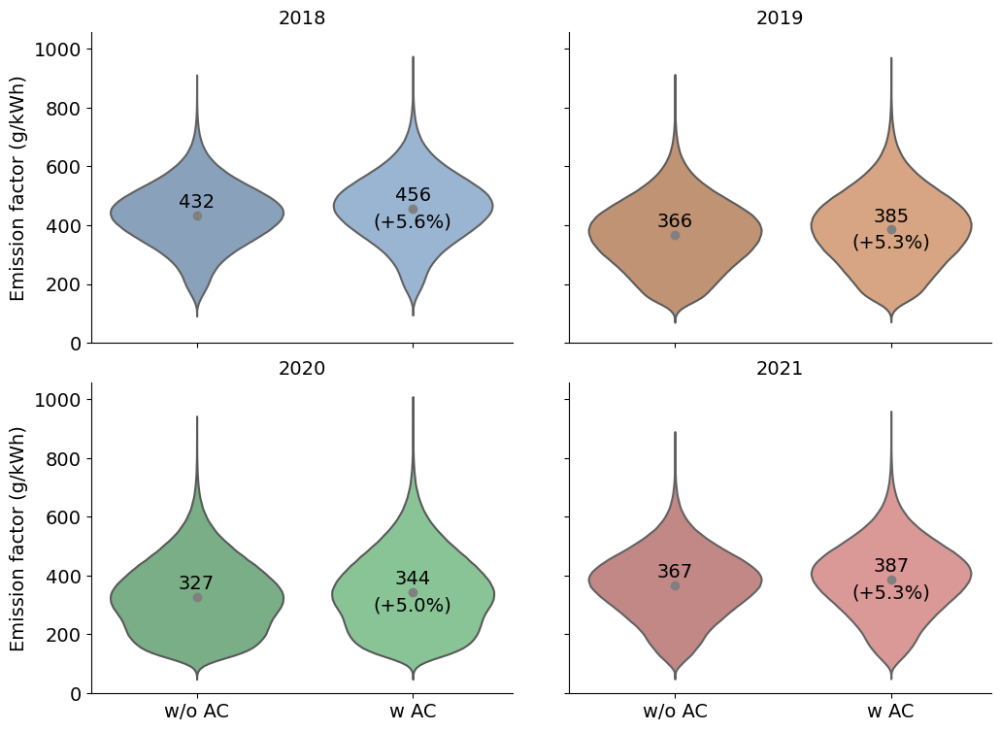

In [14]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["gep", "nep"], 
                  save_file=True,
                  file_name='aux_cons.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o AC", "w AC"],
                  legend_labels=["w/o AC", "w AC"],
                  legend_title='Auxiliary consumption (AC)')

#### Auto-producers

##### Prepare data

In [15]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["maponly", "apemissions", "apenergy", "mapap"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,maponly
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,maponly
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,maponly
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,apenergy
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,maponly
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,apenergy
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,maponly
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,apemissions
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,apenergy


##### Violin plot

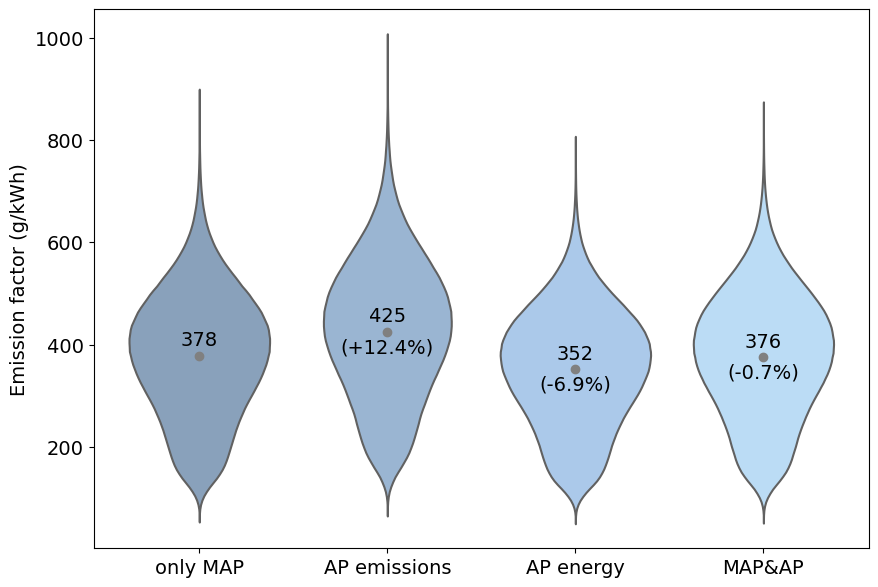

In [59]:
# create plot
create_violinplot(df_sample,
                  ["maponly", "apemissions", "apenergy", "mapap"],
                  save_file=True,
                  file_name='ap.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["only MAP", "AP emissions", "AP energy", "MAP&AP"],
                  legend_labels=["only MAP", "AP emissions", "AP energy", "MAP&AP"],
                  legend_title='Auto-producers')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


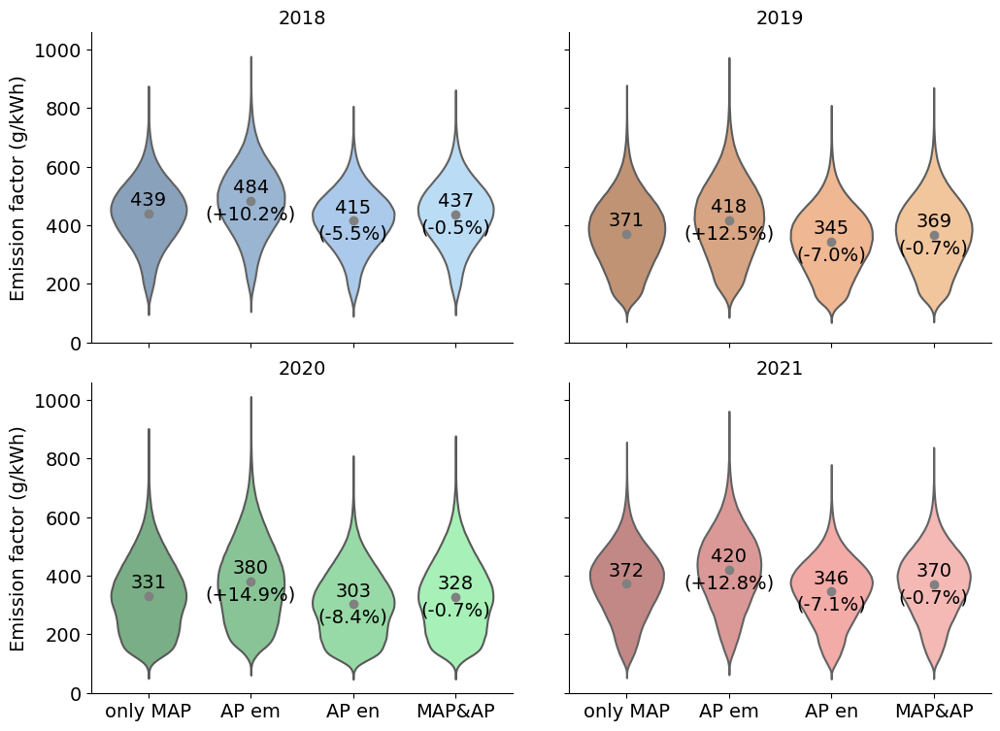

In [16]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["maponly", "apemissions", "apenergy", "mapap"],
                  save_file=True,
                  file_name='ap.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["only MAP", "AP em", "AP en", "MAP&AP"],
                  legend_labels=["only MAP", "AP em", "AP en", "MAP&AP"],
                  legend_title='Auto-producers')

#### Temporal resolution

##### Effect of EF only
Here, we calculate the degree to which high resolution EF can differ from low resolution EF. However, this shows a large effect, which is not directly comparable to the other effects shown in this section. The HR EF min and max may be very far from the mean, but the effect on the resulting overall emissions is neglibible, since these extremes are rare. For this reason, we calculate the effect of using HR in emission accounting further down.

In [57]:
# step 1: calculate the values (means, deviations)

# 1. Calculate the annual mean for each column
annual_means = ef.filter(like='ef_').groupby(ef['Year']).mean()

# 2. Calculate the relative differences
def positive_deviation(x):
    return (x.max() - x.mean()) / x.mean()

def negative_deviation(x):
    return (x.min() - x.mean()) / x.mean()

deviations = ef.filter(like='ef_').groupby(ef['Year']).agg({
    col: [positive_deviation, negative_deviation] for col in ef.columns if col.startswith('ef_')
})

# 3. Get the maximum positive and negative deviations across all columns
max_positive_deviation = deviations.xs('positive_deviation', axis=1, level=1).max(axis=1)
max_negative_deviation = deviations.xs('negative_deviation', axis=1, level=1).max(axis=1)

# Results
print(annual_means)
print(max_positive_deviation)
print(max_negative_deviation)

      ef_gep_co2_op_el100_maponly_prod_noph_nodl  \
Year                                               
2018                                  424.186234   
2019                                  362.255995   
2020                                  321.097421   
2021                                  366.780680   

      ef_gep_co2_op_el100_apenergy_prod_noph_nodl  \
Year                                                
2018                                   399.115975   
2019                                   334.842978   
2020                                   291.936695   
2021                                   338.495406   

      ef_gep_co2_op_el100_apemissions_prod_noph_nodl  \
Year                                                   
2018                                      466.367487   
2019                                      406.748130   
2020                                      368.189680   
2021                                      412.488690   

      ef_gep_co2_op_el100_mapap

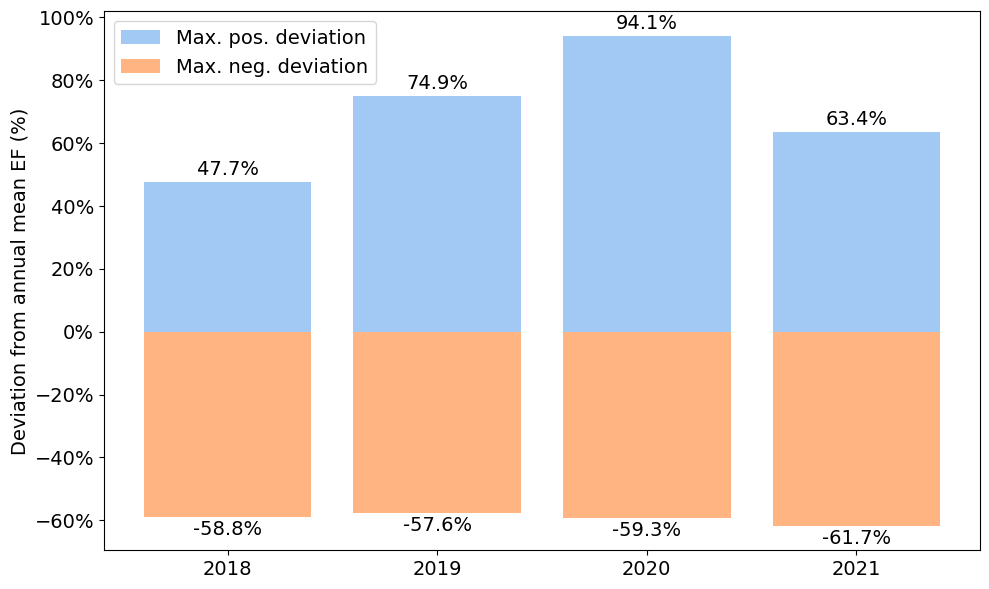

In [71]:
# plot effect

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

years = max_positive_deviation.index

# Plotting
plt.figure(figsize=(10, 6))

# Positive deviations
plt.bar(years, max_positive_deviation * 100, color=colors[0], label='Max. pos. deviation')

# Negative deviations
plt.bar(years, max_negative_deviation * 100, color=colors[1], label='Max. neg. deviation')

# Annotations
for i, year in enumerate(years):
    plt.text(year, (max_positive_deviation.iloc[i] + 0.01) * 100, f"{max_positive_deviation.iloc[i] * 100:.1f}%", ha='center', va='bottom', fontsize=14)
    plt.text(year, (max_negative_deviation.iloc[i] - 0.01) * 100, f"{max_negative_deviation.iloc[i] * 100:.1f}%", ha='center', va='top', fontsize=14)

# Labeling and title
plt.ylabel('Deviation from annual mean EF (%)', fontsize=14)
#plt.title('Max Positive and Negative Deviation per Year', fontsize=14)
plt.legend(fontsize=14)
plt.xticks(years, fontsize=14)  # Set x-ticks for full years
plt.yticks(fontsize=14)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.PercentFormatter(100))  # Convert y-axis to percentages

# Remove x-axis label
plt.xlabel('')

# Display the plot
plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'ef_max_deviation' + '.png')
#plt.savefig(plot_path)

plt.show()

##### Effect in emission accounting
Here, we combine the EF with an electric load profile (LP) of a consumer, to find out the degree to which the temporal resolution has an effect on overall emissions.

In [104]:
# step 1: import

# Define path
path = os.path.join('..', '1_data', '1_raw', 'Load profile', 'blb_load_el_2020_2022.csv')
#pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_gep_nep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load
lp = pd.read_csv(path)
#ef = pd.read_pickle(pickle_path)

In [105]:
# step 2: create high resolution load profile for the consumer

# Convert the 'Datetime' column to a pandas datetime object (if not already done)
lp['Datetime'] = pd.to_datetime(lp['Datetime'])

# Filter the DataFrame to include only rows from the year 2021
lp_2021 = lp[lp['Datetime'].dt.year == 2021]

# calculate mean load
lp_2021['load_mean'] = lp_2021['load_kW'].mean()

# rename
lp_2021.rename(columns={"Datetime": "DateTime"}, inplace=True)

lp_2021 # unit: kW

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\1695371363.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lp_2021['load_mean'] = lp_2021['load_kW'].mean()
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\1695371363.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lp_2021.rename(columns={"Datetime": "DateTime"}, inplace=True)


,DateTime,load_kW,load_mean
24239,2021-01-01 00:00:00,9.185031,48.559505
24240,2021-01-01 00:15:00,9.207808,48.559505
24241,2021-01-01 00:30:00,9.238449,48.559505
24242,2021-01-01 00:45:00,9.141300,48.559505
24243,2021-01-01 01:00:00,9.316424,48.559505
...,...,...,...
59274,2021-12-31 22:45:00,8.745683,48.559505
59275,2021-12-31 23:00:00,8.432545,48.559505
59276,2021-12-31 23:15:00,8.501255,48.559505
59277,2021-12-31 23:30:00,8.553713,48.559505


In [106]:
# step 3: limit the EF data to time period and choice of interest

# limit to ef_nep columns
desired_columns = ['DateTime', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'] # limit to only one ef
ef = ef[desired_columns]
ef['ef_mean'] = ef['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'].mean()

# Filter the DataFrame to include only rows from the year 2021
ef_2021 = ef[ef['DateTime'].dt.year == 2021]
ef_2021.rename(columns={"ef_nep_gwp100_lc_ex_maponly_cons_ph_dl": "ef"}, inplace=True)

ef_2021 # unit: g/kWh

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\3233536552.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ef['ef_mean'] = ef['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'].mean()
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\3233536552.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ef_2021.rename(columns={"ef_nep_gwp100_lc_ex_maponly_cons_ph_dl": "ef"}, inplace=True)


,DateTime,ef,ef_mean
105216,2021-01-01 00:00:00,526.616614,433.028701
105217,2021-01-01 00:15:00,526.616614,433.028701
105218,2021-01-01 00:30:00,526.616614,433.028701
105219,2021-01-01 00:45:00,526.616614,433.028701
105220,2021-01-01 01:00:00,532.623046,433.028701
...,...,...,...
140251,2021-12-31 22:45:00,218.361174,433.028701
140252,2021-12-31 23:00:00,216.200511,433.028701
140253,2021-12-31 23:15:00,216.200511,433.028701
140254,2021-12-31 23:30:00,216.200511,433.028701


In [107]:
# step 4: merge ef and lp data
df_2021 = pd.merge(lp_2021, ef_2021, on="DateTime")
df_2021['DateTime'] = pd.to_datetime(df_2021['DateTime'])
df_2021

,DateTime,load_kW,load_mean,ef,ef_mean
0,2021-01-01 00:00:00,9.185031,48.559505,526.616614,433.028701
1,2021-01-01 00:15:00,9.207808,48.559505,526.616614,433.028701
2,2021-01-01 00:30:00,9.238449,48.559505,526.616614,433.028701
3,2021-01-01 00:45:00,9.141300,48.559505,526.616614,433.028701
4,2021-01-01 01:00:00,9.316424,48.559505,532.623046,433.028701
...,...,...,...,...,...
35035,2021-12-31 22:45:00,8.745683,48.559505,218.361174,433.028701
35036,2021-12-31 23:00:00,8.432545,48.559505,216.200511,433.028701
35037,2021-12-31 23:15:00,8.501255,48.559505,216.200511,433.028701
35038,2021-12-31 23:30:00,8.553713,48.559505,216.200511,433.028701


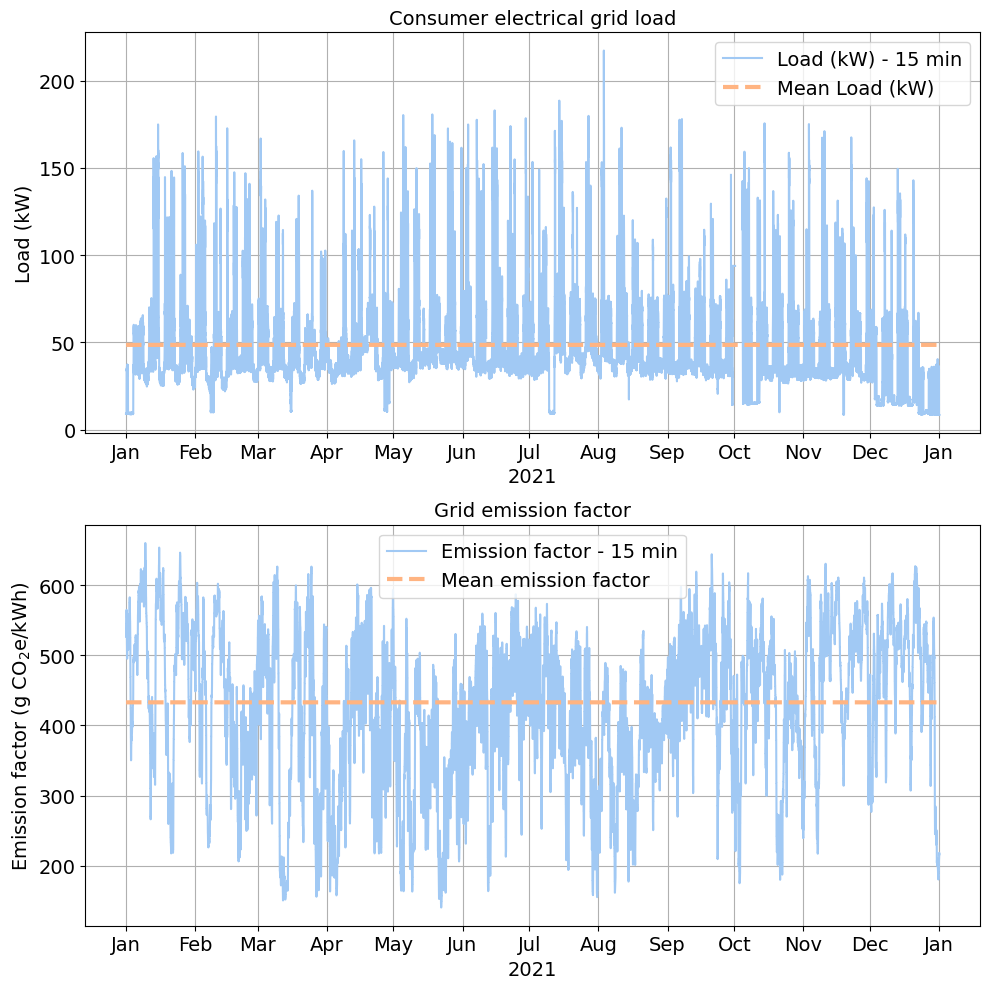

In [108]:
# working copy
df = df_2021.copy()

# Set the 'Datetime' column as the index (if not already set)
df.set_index('DateTime', inplace=True)

# Create a line plot with two subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))  # Create a figure and two subplots (2 rows, 1 column)

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Plot the first subplot
axs[0].plot(df.index, df['load_kW'], label='Load (kW) - 15 min', color=colors[0])
axs[0].plot(df.index, df['load_mean'], label='Mean Load (kW)', linestyle='--', linewidth=3, color=colors[1])  # Plot the mean load
axs[0].set_xlabel('2021', fontsize=14)
axs[0].set_ylabel('Load (kW)', fontsize=14)
axs[0].set_title('Consumer electrical grid load', fontsize=14)
axs[0].grid(True)  # Optional: add gridlines to the plot
axs[0].legend(fontsize=14)  # Add a legend

# Define the x-ticks as the start of each month and label them as "Jan", "Feb", "Mar", etc.
month_locator = mdates.MonthLocator()
month_formatter = mdates.DateFormatter('%b')  # %b represents the abbreviated month name (Jan, Feb, Mar, etc.)
axs[0].xaxis.set_major_locator(month_locator)
axs[0].xaxis.set_major_formatter(month_formatter)
axs[0].tick_params(axis='both', which='major', labelsize=14)

# Plot the second subplot
axs[1].plot(df.index, df['ef'], label='Emission factor - 15 min', color=colors[0])
axs[1].plot(df.index, df['ef_mean'], label='Mean emission factor',  linestyle='--', linewidth=3, color=colors[1])
axs[1].set_xlabel('2021', fontsize=14)
axs[1].set_ylabel('Emission factor (g CO$_2$e/kWh)', fontsize=14)
axs[1].set_title('Grid emission factor', fontsize=14)
axs[1].grid(True)  # Optional: add gridlines to the plot
axs[1].legend(fontsize=14)  # Add a legend

# Define the x-ticks as the start of each month and label them as "Jan", "Feb", "Mar", etc.
axs[1].xaxis.set_major_locator(month_locator)
axs[1].xaxis.set_major_formatter(month_formatter)
axs[1].tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()  # Optional: adjust the spacing of plot elements for better appearance

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'ef_blb_gridload_2021' + '.png')
plt.savefig(plot_path)

plt.show()

In [109]:
# step 6: preparation for plot 2

# calculate high and low resultion emissions
df['em_hr'] = df['load_kW'] * df['ef'] / 4 * 1e-6
df['em_lr'] = df['load_mean'] * df['ef_mean'] / 4 * 1e-6
df # unit (new columns): kW * h * g/kWh * 1e-6 = t

,load_kW,load_mean,ef,ef_mean,em_hr,em_lr
DateTime,,,,,,
2021-01-01 00:00:00,9.185031,48.559505,526.616614,433.028701,0.001209,0.005257
2021-01-01 00:15:00,9.207808,48.559505,526.616614,433.028701,0.001212,0.005257
2021-01-01 00:30:00,9.238449,48.559505,526.616614,433.028701,0.001216,0.005257
2021-01-01 00:45:00,9.141300,48.559505,526.616614,433.028701,0.001203,0.005257
2021-01-01 01:00:00,9.316424,48.559505,532.623046,433.028701,0.001241,0.005257
...,...,...,...,...,...,...
2021-12-31 22:45:00,8.745683,48.559505,218.361174,433.028701,0.000477,0.005257
2021-12-31 23:00:00,8.432545,48.559505,216.200511,433.028701,0.000456,0.005257
2021-12-31 23:15:00,8.501255,48.559505,216.200511,433.028701,0.000459,0.005257


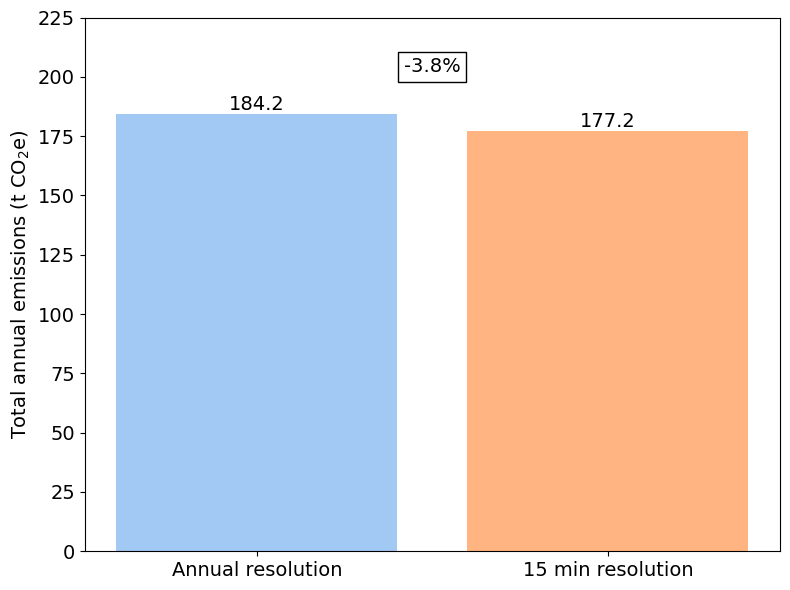

In [111]:
# Calculate the sum of 'em_lr' and 'em_hr'
em_lr_sum = df['em_lr'].sum()
em_hr_sum = df['em_hr'].sum()

# Calculate the relative difference
relative_diff = (em_hr_sum - em_lr_sum) / em_lr_sum * 100

# Data for plotting
bars = ['em_lr', 'em_hr']
heights = [em_lr_sum, em_hr_sum]

# Create a bar plot
fig, ax = plt.subplots(figsize=(8, 6))

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")
bar_plot = ax.bar(bars, heights, color=colors)

# Add data values on top of the bars
for bar in bar_plot:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.01,
            round(yval, 1), ha='center', va='bottom', fontsize=14)

# Add the relative difference between the bars
ax.text(0.5, max(heights) + 20, f'{relative_diff:.1f}%', 
        ha='center', va='center', color='black', bbox=dict(facecolor='none', edgecolor='black'), fontsize=14)

# label y axis
plt.ylabel('Total annual emissions (t CO$_2$e)', fontsize=14)

# Custom x-tick labels
custom_labels = ['Annual resolution', '15 min resolution']
plt.xticks(range(len(bars)), custom_labels, fontsize=14)
ax.tick_params(axis='y', labelsize=14)  # Set y-tick label font size to 14

# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, 225)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'blb_emissions_lr_hr' + '.png')
plt.savefig(plot_path)

plt.tight_layout()
plt.show()

#### Electricity trading

##### Prepare data

In [17]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["prod", "cons"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,cons
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,prod
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,cons
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,cons
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,cons
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,prod
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,prod
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,prod
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,cons


##### Violin plot

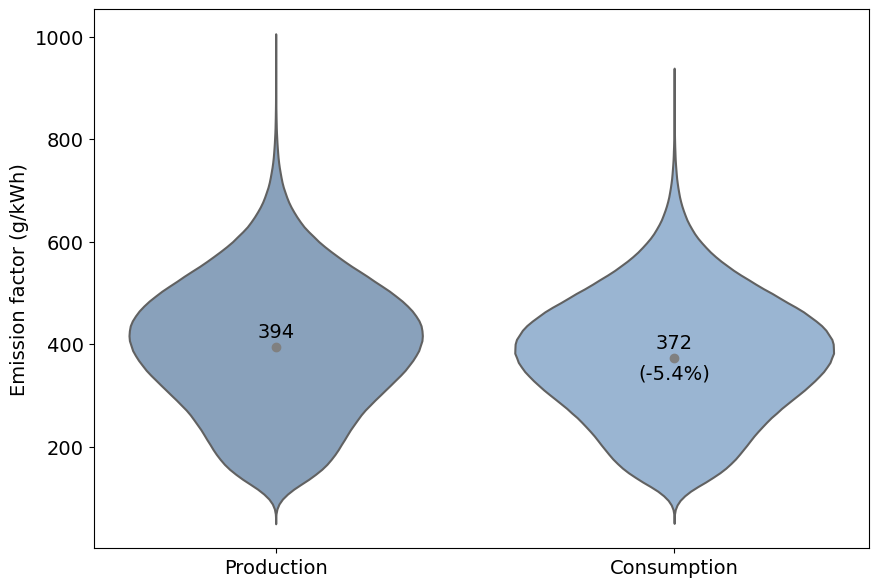

In [62]:
# create plot
create_violinplot(df_sample,
                  ["prod", "cons"],
                  save_file=True,
                  file_name='trade.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["Production", "Consumption"],
                  legend_labels=["Production", "Consumption"],
                  legend_title='Perspective')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


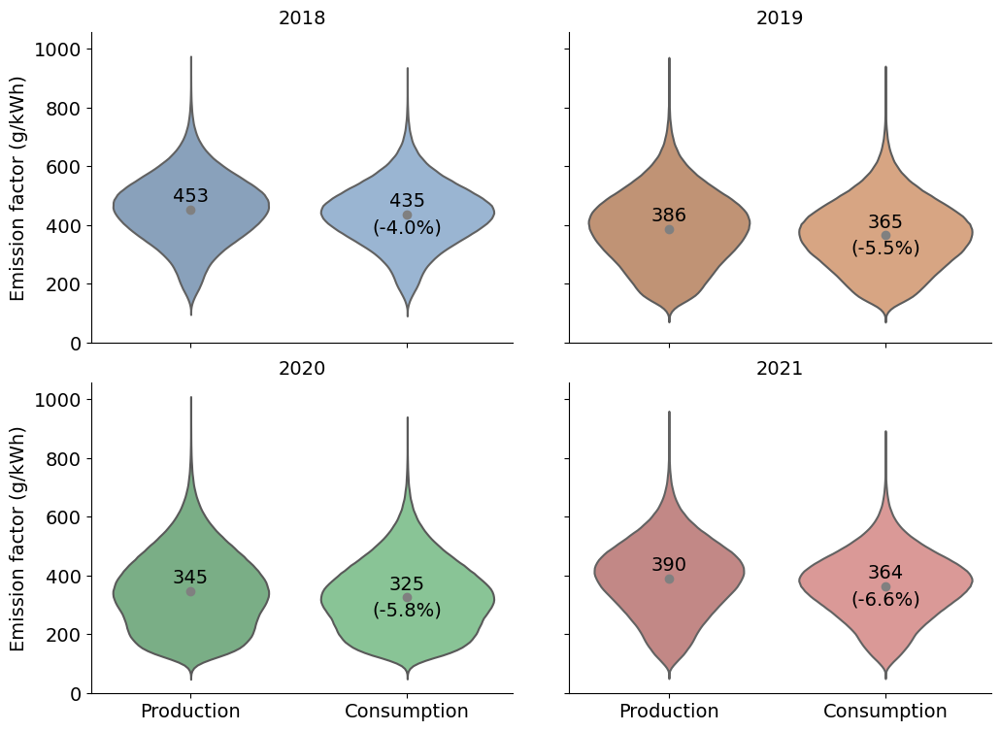

In [18]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["prod", "cons"],
                  save_file=True,
                  file_name='trade.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["Production", "Consumption"],
                  legend_labels=["Production", "Consumption"],
                  legend_title='Perspective')

##### Trading flows

In [28]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'ef_neighbors.pkl')

# Load the pickle file into a DataFrame
pf = pd.read_pickle(pickle_path)
ef_n = pd.read_pickle(pickle_path2)

# replace nan values with zeros
pf = pf.replace(np.nan, 0.0)
ef_n = ef_n.replace(np.nan, 0.0)

In [23]:
# choose one column
trade = pd.merge(ef[['DateTime', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl']], pf, on='DateTime')
trade = pd.merge(trade, ef_n, left_on=['DateTime', 'OutMapCode'], right_on=['DateTime', 'MapCode'])
trade

,DateTime,ef_nep_gwp100_lc_ex_maponly_cons_ph_dl,InMapCode,OutMapCode,FlowValue_corr,MapCode,ef
0,2018-01-01 00:00:00,252.773825,DE,DK,0.000000,DK,190.193750
1,2018-01-01 00:00:00,252.773825,DK,DE,521.448461,DE,235.767405
2,2018-01-01 00:00:00,252.773825,AT,DE,833.758150,DE,235.767405
3,2018-01-01 00:00:00,252.773825,BE,DE,0.000000,DE,235.767405
4,2018-01-01 00:00:00,252.773825,CH,DE,986.819929,DE,235.767405
...,...,...,...,...,...,...,...
3085627,2021-12-31 23:45:00,216.266812,DE,LU,0.000000,LU,384.603783
3085628,2021-12-31 23:45:00,216.266812,DE,NL,432.638311,NL,381.948404
3085629,2021-12-31 23:45:00,216.266812,DE,NO,0.000000,NO,24.551835
3085630,2021-12-31 23:45:00,216.266812,DE,PL,0.369149,PL,654.907497


In [24]:
# Create a new column 'em_out' for rows where 'OutMapCode' is 'DE'
trade.loc[trade['OutMapCode'] == 'DE', 'em_out'] = trade['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'] * trade['FlowValue_corr']

# Create a new column 'em_in' for rows where 'InMapCode' is 'DE'
trade.loc[trade['InMapCode'] == 'DE', 'em_in'] = trade['ef'] * trade['FlowValue_corr']

# Display the updated DataFrame
trade # em: unit kg

,DateTime,ef_nep_gwp100_lc_ex_maponly_cons_ph_dl,InMapCode,OutMapCode,FlowValue_corr,MapCode,ef,em_out,em_in
0,2018-01-01 00:00:00,252.773825,DE,DK,0.000000,DK,190.193750,NaN,0.000000
1,2018-01-01 00:00:00,252.773825,DK,DE,521.448461,DE,235.767405,131808.522057,NaN
2,2018-01-01 00:00:00,252.773825,AT,DE,833.758150,DE,235.767405,210752.236869,NaN
3,2018-01-01 00:00:00,252.773825,BE,DE,0.000000,DE,235.767405,0.000000,NaN
4,2018-01-01 00:00:00,252.773825,CH,DE,986.819929,DE,235.767405,249442.248059,NaN
...,...,...,...,...,...,...,...,...,...
3085627,2021-12-31 23:45:00,216.266812,DE,LU,0.000000,LU,384.603783,NaN,0.000000
3085628,2021-12-31 23:45:00,216.266812,DE,NL,432.638311,NL,381.948404,NaN,165245.512513
3085629,2021-12-31 23:45:00,216.266812,DE,NO,0.000000,NO,24.551835,NaN,0.000000
3085630,2021-12-31 23:45:00,216.266812,DE,PL,0.369149,PL,654.907497,NaN,241.758491


In [25]:
# refine
df = trade[['DateTime', 'em_out', 'em_in', 'OutMapCode', 'InMapCode', 'FlowValue_corr']]
df['Year'] = df['DateTime'].dt.year.astype('i4')
df = df.groupby(['Year', 'InMapCode', 'OutMapCode'])[['FlowValue_corr', 'em_in', 'em_out']].sum().reset_index()

# Filter data for year 2021
df_2021 = df[df['Year'] == 2021]
#df = df_2021
df_2021

# unit: flow: MWh, em: kg

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\3417215401.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df['DateTime'].dt.year.astype('i4')


,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out
66,2021,AT,DE,1.476603e+07,0.000000e+00,6.212838e+09
67,2021,BE,DE,5.249051e+06,0.000000e+00,2.252466e+09
68,2021,CH,DE,1.929773e+07,0.000000e+00,8.395458e+09
69,2021,CZ,DE,3.195330e+06,0.000000e+00,1.197481e+09
70,2021,DE,AT,6.668780e+06,6.821380e+08,0.000000e+00
71,2021,DE,BE,4.196587e+06,6.861645e+08,0.000000e+00
72,2021,DE,CH,2.336122e+06,6.665305e+07,0.000000e+00
73,2021,DE,CZ,3.526702e+06,1.875488e+09,0.000000e+00
74,2021,DE,DK,1.094673e+07,3.896765e+09,0.000000e+00
75,2021,DE,FR,5.563231e+06,4.396091e+08,0.000000e+00


C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\geopandas\plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:
C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\geopandas\plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


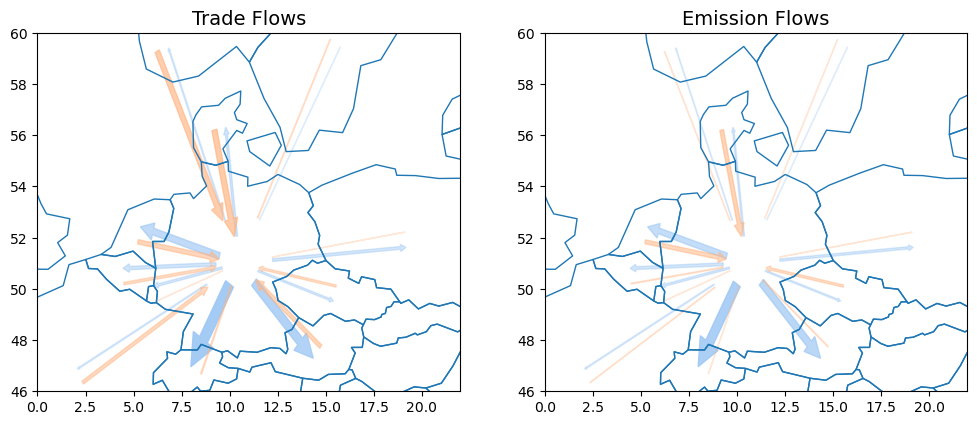

In [26]:
# Load a world map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter Europe
europe = world[(world['continent'] == 'Europe') & (world['name'] != 'Russia')]

# Define central location (Germany)
central_lon, central_lat = 10.5, 51.0

# Coordinates for Germany and its neighbors
coords = {
    'Germany': (10.5, 51.0),
    'Denmark': (9.501785, 56.26392),
    'Norway': (8.468946, 59.8),
    'Poland': (19.145136, 51.919438),
    'Czechia': (15.473, 49.8175),
    'Austria': (14.5501, 47.5162),
    'Switzerland': (8.24824, 46.8182),
    'France': (2.213749, 46.603354),
    'Luxembourg': (6.1296, 49.8153),
    'Belgium': (4.469936, 50.503887),
    'Netherlands': (5.2913, 52.1326),
    'Sweden': (15.5, 59.6)
}

# Map country codes to country names
country_codes = {
    'AT': 'Austria',
    'BE': 'Belgium',
    'CH': 'Switzerland',
    'CZ': 'Czechia',
    'DE': 'Germany',
    'DK': 'Denmark',
    'FR': 'France',
    'LU': 'Luxembourg',
    'NL': 'Netherlands',
    'NO': 'Norway',
    'PL': 'Poland',
    'SE': 'Sweden'
}

# Replace the country codes with country names
df.replace({'InMapCode': country_codes, 'OutMapCode': country_codes}, inplace=True)

# Get maximum value for normalizing for em_
max_value = max(df['em_in'].max(), df['em_out'].max())

# Normalize 
df['em_in_norm'] = df['em_in'] / max_value
df['em_out_norm'] = df['em_out'] / max_value
df['FlowValue_corr_norm'] = df['FlowValue_corr'] / df['FlowValue_corr'].max()

# Create dictionaries of trade values and emissions for each pair of countries
trade_values = {(row['OutMapCode'], row['InMapCode']): (row['FlowValue_corr_norm'], row['FlowValue_corr'] / 1e6) for _, row in df.iterrows()}
emissions_in = {(row['OutMapCode'], row['InMapCode']): (row['em_in_norm'], row['em_in'] / 1e9) for _, row in df.iterrows()}
emissions_out = {(row['OutMapCode'], row['InMapCode']): (row['em_out_norm'], row['em_out'] / 1e9) for _, row in df.iterrows()}

# Define arrow properties
offset_size = 0.3
norway_offset = 2
shortening_factor = 0.2

def calc_alpha(norm_val, alpha_min=0.3, alpha_max=1.0):
    return alpha_min + norm_val * (alpha_max - alpha_min)

# Create plot
fig, axs = plt.subplots(1, 2, figsize=(12, 8))

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Loop over both axes
for ax, (values, title) in zip(axs, [((trade_values, trade_values), "Trade Flows"), ((emissions_out, emissions_in), "Emission Flows")]):
    # Plot the map
    europe.boundary.plot(ax=ax, linewidth=1)

    # Set the limits of the plot
    ax.set_xlim(0, 22)
    ax.set_ylim(46, 60)

    # Create arrows for each neighbor
    for country, (lon, lat) in coords.items():
        if country != 'Germany':
            # Get values
            out_norm, out_val = values[0].get(('Germany', country), (0, 0))
            in_norm, in_val = values[1].get((country, 'Germany'), (0, 0))

            # Calculate displacement for arrows
            displace_lon = (lon - central_lon)
            displace_lat = (lat - central_lat)

            # Calculate perpendicular direction for import/export arrow offset
            perp_dir = np.array([-displace_lat, displace_lon])
            perp_dir = perp_dir / np.linalg.norm(perp_dir)

            # Import/Export arrow starting points
            start_in = np.array([central_lon, central_lat])
            start_out = np.array([central_lon, central_lat])

            # End points for import/export arrows
            end_in = np.array([lon, lat]) + offset_size * perp_dir
            end_out = np.array([lon, lat]) - offset_size * perp_dir

            # Apply Norway specific offset
            if country == 'Norway':
                end_in = end_in + norway_offset * perp_dir
                end_out = end_out + norway_offset * perp_dir

            # Shorten the arrows
            start_in = start_in + shortening_factor * (end_in - start_in)
            start_out = start_out + shortening_factor * (end_out - start_out)

            # Plot trade from Germany to neighbor
            ax.arrow(start_out[0],
                     start_out[1],
                     end_out[0] - start_out[0],
                     end_out[1] - start_out[1],
                     head_width=out_norm*1.3,
                     head_length=out_norm*1.3,
                     fc=colors[0],
                     ec=colors[0],
                     width=out_norm / 2,
                     alpha=calc_alpha(out_norm),
                     length_includes_head=True)

            # Plot trade from neighbor to Germany (reversed arrow)
            ax.arrow(end_in[0],
                     end_in[1],
                     start_in[0] - end_in[0],
                     start_in[1] - end_in[1],
                     head_width=in_norm*1.3,
                     head_length=in_norm*1.3,
                     fc=colors[1],
                     ec=colors[1],
                     width=in_norm / 2,
                     alpha=calc_alpha(in_norm),
                     length_includes_head=True)

            # Add labels to arrows
            '''mid_in = (start_in + end_in) / 2
            mid_out = (start_out + end_out) / 2

            ax.text(mid_out[0], mid_out[1], f'{out_val:.1f}', fontsize=12)
            ax.text(mid_in[0], mid_in[1], f'{in_val:.1f}', fontsize=12)'''

    # Add country codes to map
    for country, code in country_codes.items():
        if country in coords:
            lon, lat = coords[country]
            ax.text(lon, lat, code, fontsize=16, ha='center')

    ax.set_title(title, fontsize=14)
    
'''# Calculate the maximum flow values for the legend
max_energy_flow = df['FlowValue_corr'].max() / 2e6
max_emission_flow = max(df['em_in'].max(), df['em_out'].max()) / 2e9

# Calculate the normalized flow values for the legend
legend_energy_flows = [0.2 * max_energy_flow, 0.5 * max_energy_flow, 0.8 * max_energy_flow]
legend_emission_flows = [0.2 * max_emission_flow, 0.5 * max_emission_flow, 0.8 * max_emission_flow]

# Create legend handles and labels for energy flows
legend_handles_energy = [mlines.Line2D([], [], color='blue', linewidth=width / 4, label=f'Energy outflow width: {width:.1f}') for width in legend_energy_flows]
legend_handles_energy += [mlines.Line2D([], [], color='red', linewidth=width / 4, label=f'Energy inflow width: {width:.1f}') for width in legend_energy_flows]

# Create legend handles and labels for emission flows
legend_handles_emission = [mlines.Line2D([], [], color='blue', linewidth=width / 4, label=f'Emission outflow width: {width:.1f}') for width in legend_emission_flows]
legend_handles_emission += [mlines.Line2D([], [], color='red', linewidth=width / 4, label=f'Emission inflow width: {width:.1f}') for width in legend_emission_flows]

# Add the legends to the plot
legend_energy = plt.legend(handles=legend_handles_energy, loc='upper left')
plt.gca().add_artist(legend_energy)
plt.legend(handles=legend_handles_emission, loc='lower left')'''

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'trading', 'map_trade_2021' + '.png')
plt.savefig(plot_path)

# Display plot
plt.show()

##### Trading balance

In [29]:
df = trade[['DateTime', 'em_out', 'em_in', 'OutMapCode', 'InMapCode', 'FlowValue_corr']]
df['Year'] = df['DateTime'].dt.year.astype('i4')
df = df.groupby(['Year', 'InMapCode', 'OutMapCode'])[['FlowValue_corr', 'em_in', 'em_out']].sum().reset_index()
df

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\3589841338.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df['DateTime'].dt.year.astype('i4')


,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out
0,2018,AT,DE,1.356832e+07,0.000000e+00,6.398666e+09
1,2018,BE,DE,0.000000e+00,0.000000e+00,0.000000e+00
2,2018,CH,DE,1.833162e+07,0.000000e+00,9.131269e+09
3,2018,CZ,DE,7.972951e+06,0.000000e+00,3.755679e+09
4,2018,DE,AT,1.180264e+06,1.370459e+08,0.000000e+00
...,...,...,...,...,...,...
83,2021,LU,DE,3.692300e+06,0.000000e+00,1.651781e+09
84,2021,NL,DE,1.071992e+07,0.000000e+00,4.579148e+09
85,2021,NO,DE,2.276810e+06,0.000000e+00,6.009209e+08
86,2021,PL,DE,4.446818e+06,0.000000e+00,1.811647e+09


In [30]:
# Create 'el_in' column: set to 'FlowValue_corr' if 'InMapCode' is 'DE', otherwise set to zero
df['el_in'] = np.where(df['InMapCode'] == 'DE', df['FlowValue_corr'], 0)

# Create 'el_out' column: set to 'FlowValue_corr' if 'OutMapCode' is 'DE', otherwise set to zero
df['el_out'] = np.where(df['OutMapCode'] == 'DE', df['FlowValue_corr'], 0)

df

,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out,el_in,el_out
0,2018,AT,DE,1.356832e+07,0.000000e+00,6.398666e+09,0.000000e+00,1.356832e+07
1,2018,BE,DE,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,2018,CH,DE,1.833162e+07,0.000000e+00,9.131269e+09,0.000000e+00,1.833162e+07
3,2018,CZ,DE,7.972951e+06,0.000000e+00,3.755679e+09,0.000000e+00,7.972951e+06
4,2018,DE,AT,1.180264e+06,1.370459e+08,0.000000e+00,1.180264e+06,0.000000e+00
...,...,...,...,...,...,...,...,...
83,2021,LU,DE,3.692300e+06,0.000000e+00,1.651781e+09,0.000000e+00,3.692300e+06
84,2021,NL,DE,1.071992e+07,0.000000e+00,4.579148e+09,0.000000e+00,1.071992e+07
85,2021,NO,DE,2.276810e+06,0.000000e+00,6.009209e+08,0.000000e+00,2.276810e+06
86,2021,PL,DE,4.446818e+06,0.000000e+00,1.811647e+09,0.000000e+00,4.446818e+06


In [31]:
grouped_df = df.groupby('Year').sum().reset_index()
grouped_df

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\1263216458.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = df.groupby('Year').sum().reset_index()


,Year,FlowValue_corr,em_in,em_out,el_in,el_out
0,2018,112190000.0,6.964095e+09,3.897789e+10,31727000.0,80463000.0
1,2019,112919000.0,7.088704e+09,2.973581e+10,40126000.0,72793000.0
2,2020,114735000.0,9.279424e+09,2.425863e+10,47853000.0,66882000.0
3,2021,122037000.0,1.119557e+10,2.918283e+10,51731000.0,70306000.0


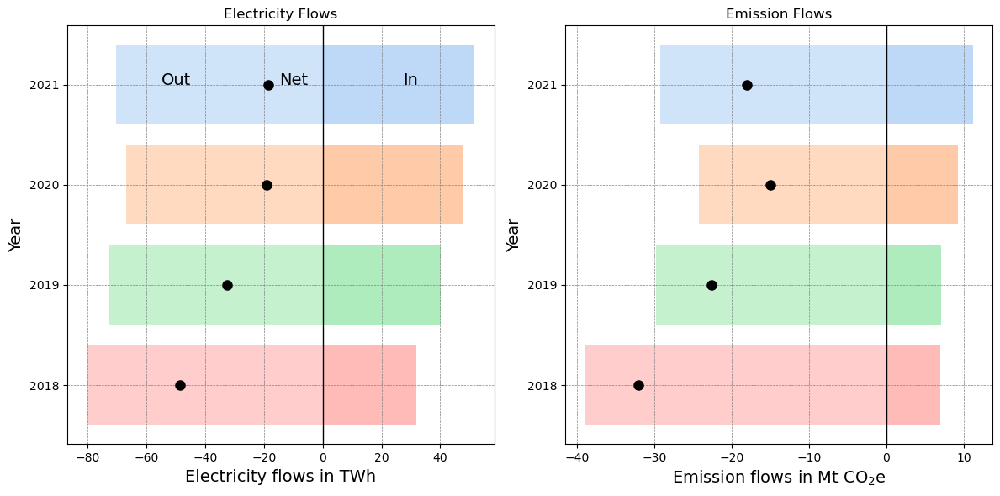

In [62]:
# Prepare data for plotting
year = grouped_df['Year'].values
el_in = grouped_df['el_in'].values
el_out = grouped_df['el_out'].values * -1  # Multiply by -1 to plot on the left side of the axis
em_in = grouped_df['em_in'].values
em_out = grouped_df['em_out'].values * -1  # Multiply by -1 to plot on the left side of the axis

# Initialize the subplots with white background and grey grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')
ax1, ax2 = axes
for ax in [ax1, ax2]:
    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

# Update order of years for plotting (flipped to have 2021 at the bottom)
#year = np.array([2021, 2020, 2019, 2018])
el_in = el_in[::-1]
el_out = el_out[::-1]
em_in = em_in[::-1]
em_out = em_out[::-1]

# Update values for plotting (divide by 1e6/1e9)
el_in = el_in / 1e6
el_out = el_out / 1e6
em_in = em_in / 1e9
em_out = em_out / 1e9

# Plot data for electricity flows (el_in and el_out)
for idx, year in enumerate(years):
    ax1.barh(year, el_in[idx], color=colors[idx], alpha=0.7)
    ax1.barh(year, el_out[idx], color=colors[idx], alpha=0.5)
    ax1.plot(el_in[idx] + el_out[idx], year, marker='o', markersize=8, color='black')

# Plot settings
ax1.set_title('Electricity Flows')
ax1.set_xlabel('Electricity flows in TWh', fontsize=14)
ax1.set_ylabel('Year', fontsize=14)
ax1.set_yticks(years)
ax1.ticklabel_format(axis="x")

# Add text to the left subplot
ax1.text(-10, 2021, 'Net', fontsize=14, ha='center')
ax1.text(30, 2021, 'In', fontsize=14, ha='center')
ax1.text(-50, 2021, 'Out', fontsize=14, ha='center')

# Plot data for emission flows (em_in and em_out)
for idx, year in enumerate(years):
    ax2.barh(year, em_in[idx], color=colors[idx], alpha=0.7)
    ax2.barh(year, em_out[idx], color=colors[idx], alpha=0.5)
    ax2.plot(em_in[idx] + em_out[idx], year, marker='o', markersize=8, color='black')

# Plot settings
ax2.set_title('Emission Flows')
ax2.set_xlabel('Emission flows in Mt CO$_2$e', fontsize=14)
ax2.set_ylabel('Year', fontsize=14)
ax2.set_yticks(years)
ax2.ticklabel_format(axis="x")

# Remove horizontal grid lines and make vertical grid line at zero more noticeable
for ax in [ax1, ax2]:
    ax.grid(axis='x', linestyle='--', linewidth=0.5, color='grey')  # Removed horizontal grid lines
    ax.axvline(0, color='black', linewidth=1)  # Make vertical grid line at zero more noticeable

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'trading', 'trade_balance' + '.png')
plt.savefig(plot_path)
    
# Show the plot
plt.tight_layout()
plt.show()

#### Storage cycling (pumped hydro)

##### Prepare data

In [19]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["ph", "noph"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,ph
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,ph
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,noph
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,noph
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,noph
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,ph
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,ph
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,noph
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,ph


##### Violin plot

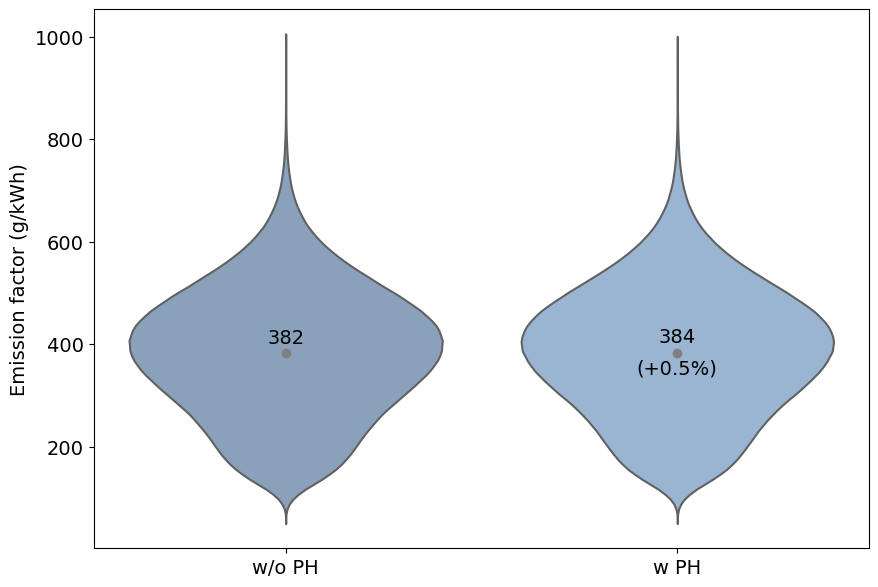

In [65]:
# create plot
create_violinplot(df_sample,
                  ["noph", "ph"], 
                  save_file=True,
                  file_name='ph.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o PH", "w PH"],
                  legend_labels=["w/o PH", "w PH"],
                  legend_title='Pumped hydro (PH)')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


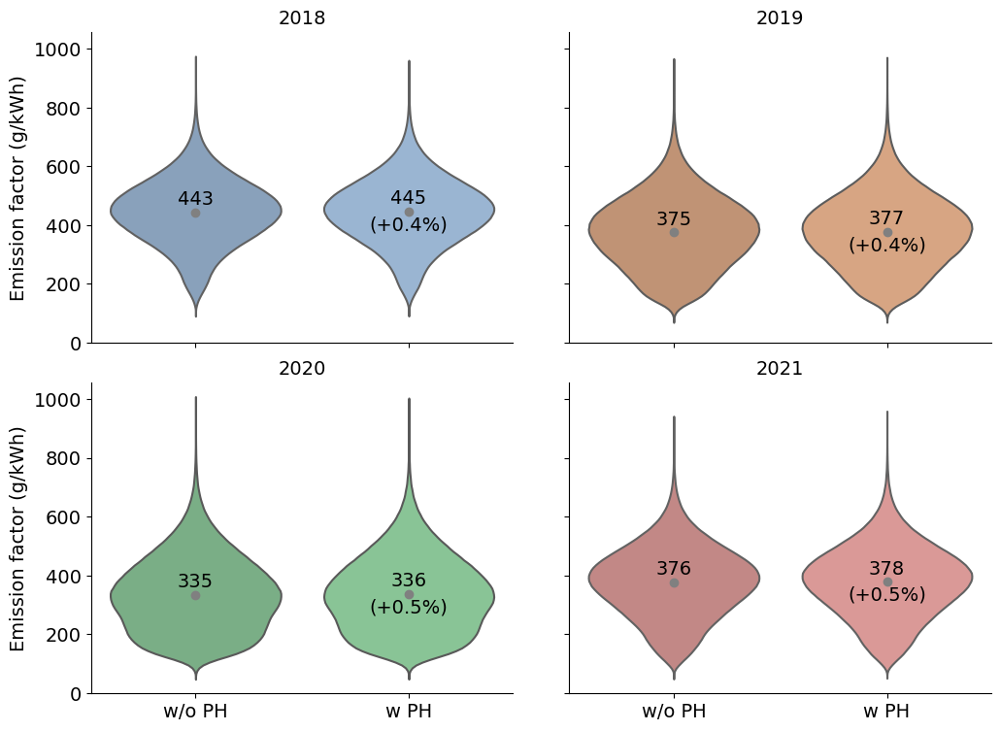

In [20]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["noph", "ph"],
                  save_file=True,
                  file_name='ph.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o PH", "w PH"],
                  legend_labels=["w/o PH", "w PH"],
                  legend_title='Pumped hydro (PH)')

#### Grid losses (T&D)

##### Prepare data

In [21]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["dl", "nodl"] # adjust
    
    for choice in choices:
        if f"_{choice}" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,nodl
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,nodl
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,dl
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,dl
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,nodl
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,dl
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,dl
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,dl
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,nodl


##### Violin plot

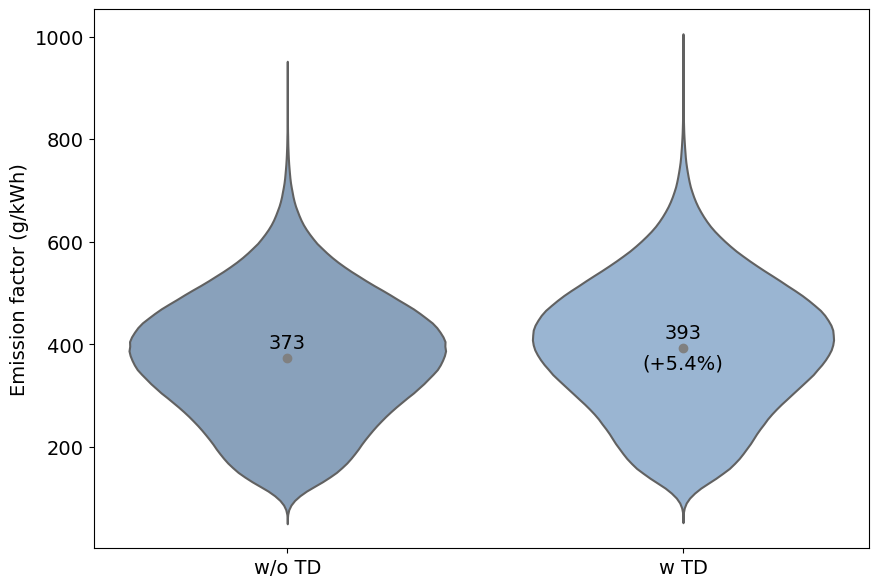

In [68]:
# create plot
create_violinplot(df_sample,
                  ["nodl", "dl"],
                  save_file=True,
                  file_name='td.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o TD", "w TD"],
                  legend_labels=["w/o TD", "w TD"],
                  legend_title='TD losses')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15020\626070366.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


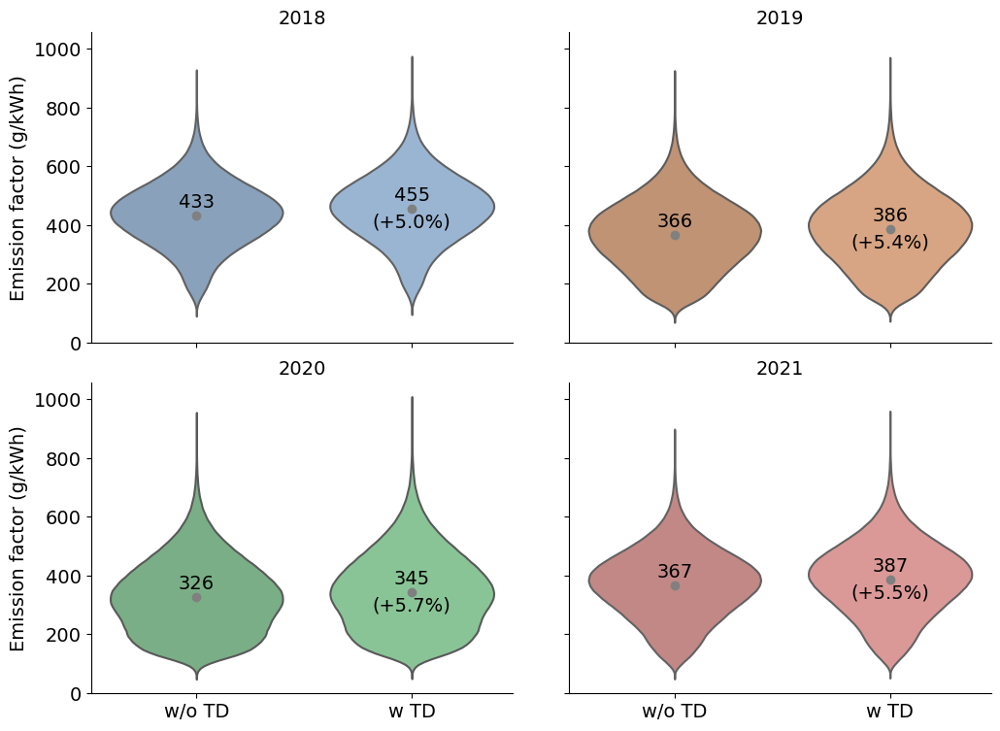

In [22]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["nodl", "dl"],
                  save_file=True,
                  file_name='td.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o TD", "w TD"],
                  legend_labels=["w/o TD", "w TD"],
                  legend_title='TD losses')

## Recommended configuration

In [115]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

### EF over time

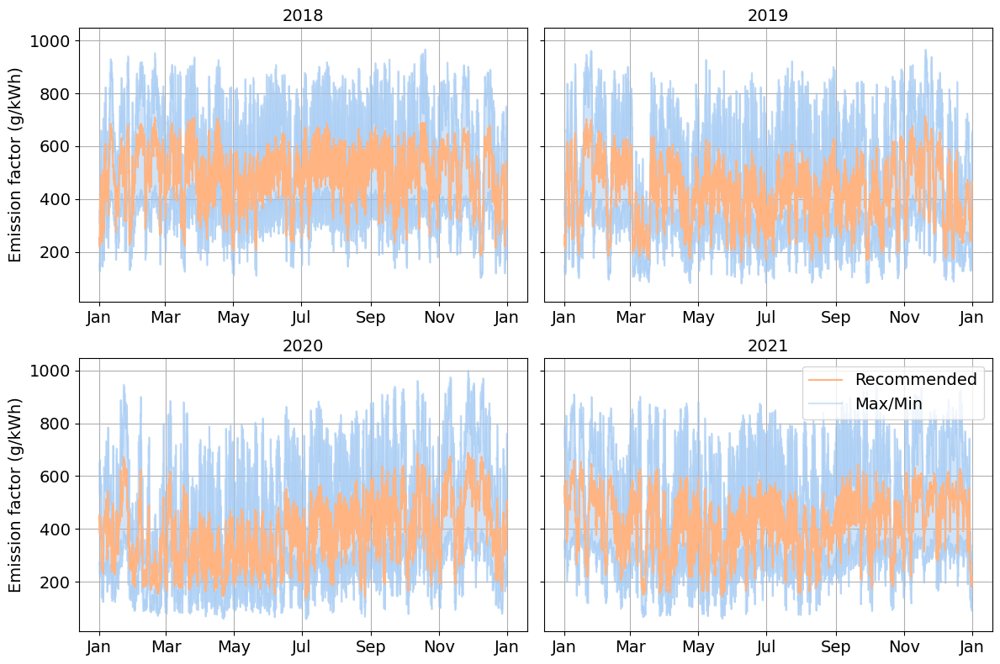

In [101]:
# plot1: recommended ef over time, compared to all choices

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):
    # Subset the DataFrame for the current year
    ef_year = ef[ef['Year'] == year]
    
    # define non-zero columns
    non_zero_columns = ef_year.columns[(ef_year != 0).any()].drop(['DateTime', 'Year', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'])
    
    # define function to get min column
    def get_min_column(ef_year, non_zero_columns):
        # Get columns with mean > 10
        valid_columns = ef_year[non_zero_columns].columns[ef_year[non_zero_columns].mean() > 10]
        # Return the column with the smallest average from the valid columns
        return ef_year[valid_columns].mean().idxmin()
    
    # Get the column with the largest average
    max_column = ef_year[non_zero_columns].mean().idxmax()
    # Get the column with the smallest average
    min_column = get_min_column(ef_year, non_zero_columns)
    
    # Plot the lines and capture the Line2D objects
    line_max, = axs[i].plot(ef_year['DateTime'], ef_year[max_column], color=colors[0], alpha=0.5)
    line_min, = axs[i].plot(ef_year['DateTime'], ef_year[min_column], color=colors[0], alpha=0.5)
    
    # Shade the area between the two columns
    axs[i].fill_between(ef_year['DateTime'], ef_year[max_column], ef_year[min_column], color=colors[0], alpha=0.5)

    # Plot the 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl' column and bring to the forefront
    line_recommended, = axs[i].plot(ef_year['DateTime'], ef_year['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'], color=colors[1], label='Recommended', zorder=3)
    
    # Add the year as the title of the subplot
    axs[i].set_title(year, fontsize=14)
    
    # Label y-axis only for the left subplots (0 and 2)
    if i % 2 == 0:
        axs[i].set_ylabel('Emission factor (g/kWh)', fontsize=14)
        
    # Format x-axis to show abbreviated month names only for every second month (Jan, Mar, etc.)
    month_locator = mdates.MonthLocator(interval=2)  # Adjusted interval
    month_formatter = mdates.DateFormatter('%b')
    axs[i].xaxis.set_major_locator(month_locator)
    axs[i].xaxis.set_major_formatter(month_formatter)
    
    axs[i].tick_params(axis='both', labelsize=14)
    axs[i].grid(True, which='major')
    
    # Add legend to the top right corner of the bottom right subplot
    if i == 3:
        axs[i].legend([line_recommended, line_max], ['Recommended', 'Max/Min'], loc='upper right', fontsize=14)


plt.tight_layout()
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'recommendation', 'ef_t_4plots_recommended' + '.png')
plt.savefig(plot_path)

plt.show()

### Histogram

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

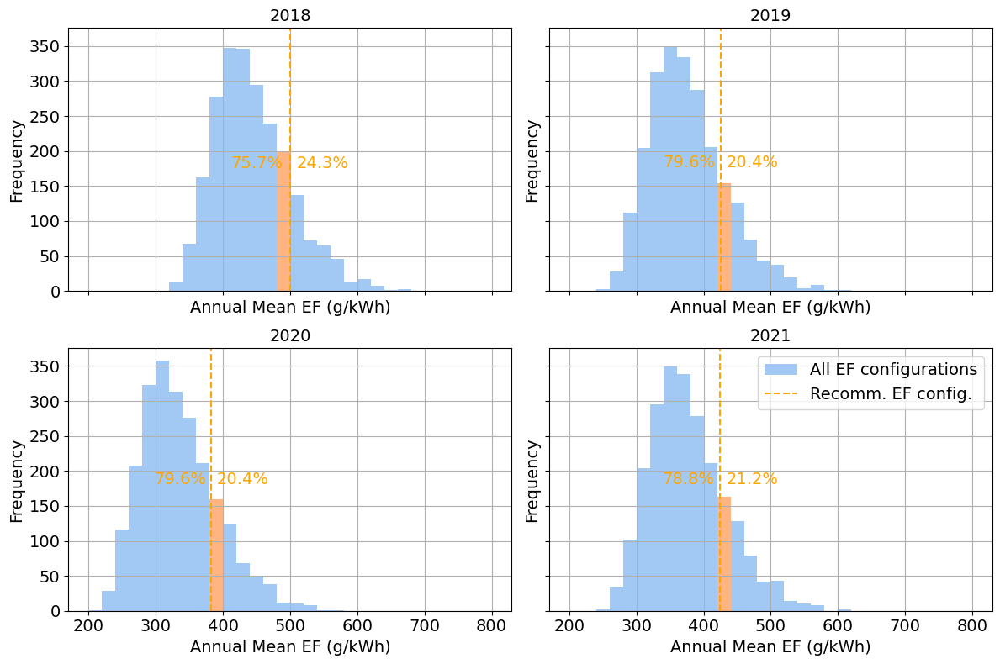

In [121]:
# plot 2: histogram

# working copy
df = ef

# Make sure DateTime column is in datetime format
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Extract year from DateTime
df['Year'] = df['DateTime'].dt.year

# Select the columns starting with "ef_"
ef_columns = df.filter(regex='^ef_')

# Initialize a DataFrame to hold the annual mean values
annual_means = pd.DataFrame()

# Loop through each year and calculate the mean
for year in range(2018, 2022):
    # Select the data for this year
    data = df[df['Year'] == year]
    # Calculate the mean of the selected columns
    annual_mean = ef_columns.loc[data.index].mean()
    # Append the result to the annual_means DataFrame
    annual_means = annual_means.append(annual_mean, ignore_index=True)

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()

for i, year in enumerate(range(2018, 2022)):
    ax = axs[i]
    # Select the data for this year
    data = annual_means.iloc[i]
    
    # Define the bins for the histogram
    #bins = range(200, 801, 20)
    
    # Determine the bin in which the recommended column value falls
    recommended_value = data["ef_nep_gwp100_lc_ex_maponly_cons_ph_dl"]
    bin_index = np.digitize(recommended_value, bins) - 1
    
    # Plot the histogram
    n, _, patches = ax.hist(data, bins=bins, color=colors[0], label='All EF configurations')
    
    # Highlight the bin that contains the recommended column's value (if within range)
    if 0 <= bin_index < len(patches):
        patches[bin_index].set_facecolor(colors[1])
    
    # Add a vertical line for the recommended column's value
    ax.axvline(recommended_value, color='orange', linestyle='--', label='Recomm. EF config.')
    
    # Calculate the percentage of columns to the left and right of the vertical line
    left_percentage = 100 * np.sum(n[:bin_index]) / np.sum(n)
    right_percentage = 100 - left_percentage
    ax.text(recommended_value*0.98, ax.get_ylim()[1] * 0.5, f'{left_percentage:.1f}%', color='orange', ha='right', va='center', fontsize=14)
    ax.text(recommended_value*1.02, ax.get_ylim()[1] * 0.5, f'{right_percentage:.1f}%', color='orange', ha='left', va='center', fontsize=14)
    
    # Set the title and labels
    ax.set_title(year, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_xlabel('Annual Mean EF (g/kWh)', fontsize=14)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True)

plt.tight_layout()
plt.legend(fontsize=14)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'recommendation', 'ef_histogram' + '.png')
plt.savefig(plot_path)

plt.show()

## Validation

In [2]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

### Recommendation - comparison to IEA, EEA, UBA

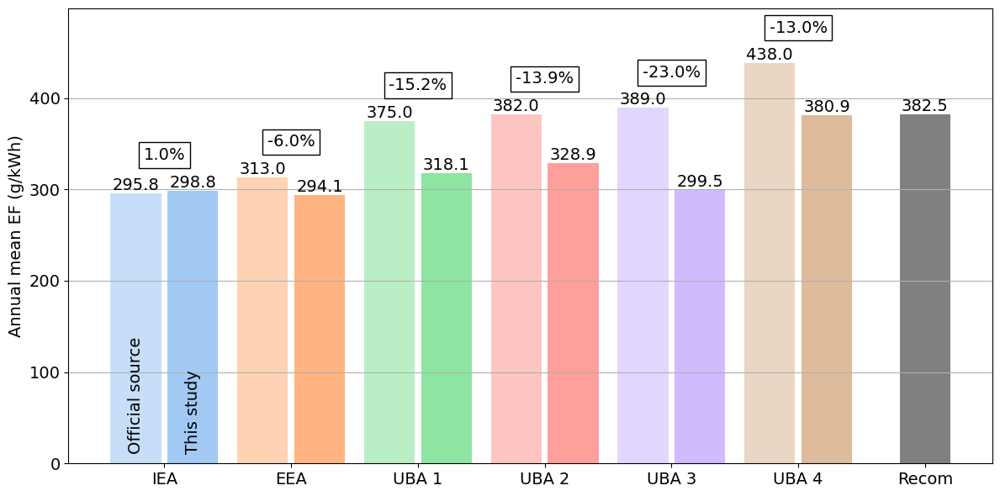

In [5]:
# Convert the 'DateTime' column to datetime
ef['DateTime'] = pd.to_datetime(ef['DateTime'])

# Filter data for the year 2020
ef_2020 = ef[ef['DateTime'].dt.year == 2020]

# Calculate the means
mean1 = ef_2020["ef_nep_co2_op_iea_mapap_prod_noph_nodl"].mean()
mean2 = ef_2020["ef_gep_gwp100_op_iea_mapap_prod_noph_nodl"].mean()
mean3 = ef_2020["ef_nep_co2_op_uba_mapap_prod_ph_dl"].mean()
mean4 = ef_2020["ef_nep_gwp100_op_uba_mapap_prod_ph_dl"].mean()
mean5 = ef_2020["ef_nep_co2_op_uba_mapap_cons_ph_dl"].mean()
mean6 = ef_2020["ef_nep_gwp100_lc_uba_mapap_prod_ph_dl"].mean()
recom = ef_2020["ef_nep_gwp100_lc_ex_maponly_cons_ph_dl"].mean()

# Define labels, fixed values, mean values, and titles
labels = ['IEA', 'EEA', 'UBA 1', 'UBA 2', 'UBA 3', 'UBA 4']
fixed_values = [295.8, 313.0, 375.0, 382.0, 389.0, 438.0]
mean_values = [mean1, mean2, mean3, mean4, mean5, mean6]
titles = labels

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Get the pastel color palette from Seaborn
colors = sns.color_palette("pastel", len(labels)).as_hex()

# Define x positions for the bars
x_positions = np.arange(0, len(labels) * 2, 2)

# Initialize empty list for text labels
text_labels = []

# Initialize variables to keep track of the highest y-position used for text
max_y_position = 0

# Plot the bars
for i, (label, fixed_value, mean_value, color) in enumerate(zip(labels, fixed_values, mean_values, colors)):
    ax.bar(x_positions[i] - 0.45, fixed_value, color=color, alpha=0.6)
    ax.bar(x_positions[i] + 0.45, mean_value, color=color, alpha=1)
    
    # Add the values on top of each bar
    ax.text(x_positions[i] - 0.45, fixed_value, np.round(fixed_value, 1), ha='center', va='bottom', fontsize=14)
    ax.text(x_positions[i] + 0.45, mean_value, np.round(mean_value, 1), ha='center', va='bottom', fontsize=14)
    
    # Calculate relative difference
    rel_diff = np.round(((mean_value - fixed_value) / fixed_value) * 100, 1)
    
    # Determine the y-position for the relative difference text, slightly above the taller of the two bars
    y_position = max(fixed_value, mean_value) + 30
    
    # Update max_y_position
    max_y_position = max(max_y_position, y_position)
    
    # Add the relative difference text between the two bars and slightly above the taller one
    ax.text(x_positions[i], y_position, f"{rel_diff}%", ha='center', va='bottom', fontsize=14, color='black',
            bbox=dict(facecolor='white', edgecolor='black'))
    
    # Add specific text labels to the first two bars
    if i == 0:  # IEA bar and its corresponding mean1 bar
        ax.text(x_positions[i] - 0.45, 10, "Official source", rotation=90, ha='center', va='bottom', fontsize=14, color='black')
        ax.text(x_positions[i] + 0.45, 10, "This study", rotation=90, ha='center', va='bottom', fontsize=14, color='black')

# Plot the single "Recom" bar
recom_x_position = x_positions[-1] + 2  # Place it 2 units to the right of the last paired bar
ax.bar(recom_x_position, recom, color='gray', alpha=1)
ax.text(recom_x_position, recom, np.round(recom, 1), ha='center', va='bottom', fontsize=14)
    
# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, max(max_y_position, recom) + 30)

# Add x-axis labels for each group of bars plus the 'Recom' bar
all_labels = labels + ['Recom']
all_x_positions = list(x_positions) + [recom_x_position]
ax.set_xticks(all_x_positions)
ax.set_xticklabels(all_labels, fontsize=14)

# Set y-axis label
ax.set_ylabel("Annual mean EF (g/kWh)", fontsize=14)

# Ticks and grid
ax.tick_params(axis='both', labelsize=14)
ax.grid(axis='y')

# Show the plot
plt.tight_layout()

# Save the plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'validation', 'ef_validation_iea_eea_uba' + '.png')
plt.savefig(plot_path)

plt.show()

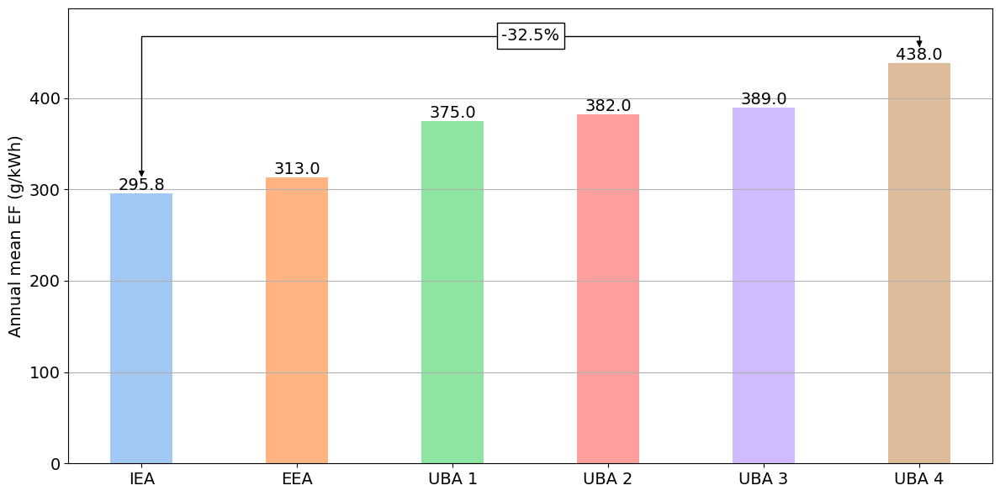

In [6]:
# Define labels, fixed values, mean values, and titles
labels = ['IEA', 'EEA', 'UBA 1', 'UBA 2', 'UBA 3', 'UBA 4']
fixed_values = [295.8, 313.0, 375.0, 382.0, 389.0, 438.0]
titles = labels

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Get the pastel color palette from Seaborn
colors = sns.color_palette("pastel", len(labels)).as_hex()

# Define x positions for the bars
x_positions = np.arange(0, len(labels) * 2, 2)

# Initialize empty list for text labels
text_labels = []

# Initialize variables to keep track of the highest y-position used for text
max_y_position = 0

# Plot the bars
for i, (label, fixed_value, color) in enumerate(zip(labels, fixed_values, colors)):
    ax.bar(x_positions[i], fixed_value, color=color)
    
    # Add the values on top of each bar
    ax.text(x_positions[i], fixed_value, np.round(fixed_value, 1), ha='center', va='bottom', fontsize=14)
    
    # Determine the y-position
    y_position = max(fixed_value, mean_value) + 30
    
    # Update max_y_position
    max_y_position = max(max_y_position, y_position)
    
# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, max_y_position + 30)

# Add x-axis labels for each group of bars plus the 'Recom' bar
all_labels = labels
all_x_positions = list(x_positions)
ax.set_xticks(all_x_positions)
ax.set_xticklabels(all_labels, fontsize=14)

# Set y-axis label
ax.set_ylabel("Annual mean EF (g/kWh)", fontsize=14)

# Ticks and grid
ax.tick_params(axis='both', labelsize=14)
ax.grid(axis='y')

# Calculate the relative difference between the tallest and shortest bars
tallest_value = max(fixed_values)
shortest_value = min(fixed_values)
rel_diff = ((shortest_value - tallest_value) / tallest_value) * 100

# Calculate the position for the text box
text_box_x = np.mean(x_positions)  # Horizontally in the middle
text_box_y = tallest_value + 20  # Above the tallest bar

# Create the text box
text_box = ax.annotate(f'{rel_diff:.1f}%', 
                       xy=(text_box_x, text_box_y + 10), 
                       xycoords='data',
                       textcoords='data',
                       fontsize=14,
                       ha='center',
                       va='center',
                       bbox=dict(fc='white', ec='black'),
                       zorder=5)  # Set zorder to a higher value to bring to foreground

# Draw arrows pointing to the tallest and shortest bars
for value in [tallest_value, shortest_value]:
    x_pos = x_positions[fixed_values.index(value)]
    y_pos_for_arrow = value + 15  # Adjust the arrow to point to the top of the text label
    ax.annotate('', 
                xy=(x_pos, y_pos_for_arrow), 
                xycoords='data',
                xytext=(text_box_x, text_box_y + 10), 
                textcoords='data',
                arrowprops=dict(arrowstyle='-|>', 
                                connectionstyle='angle,angleA=0,angleB=90,rad=0',
                                color='black'),
                zorder=3)  # Lower zorder to keep behind the text box

# Show the plot
plt.tight_layout()

# Save the plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'background', 'ef_motivation' + '.png')
plt.savefig(plot_path)

plt.show()

### Individual effects - comparison to previous studies

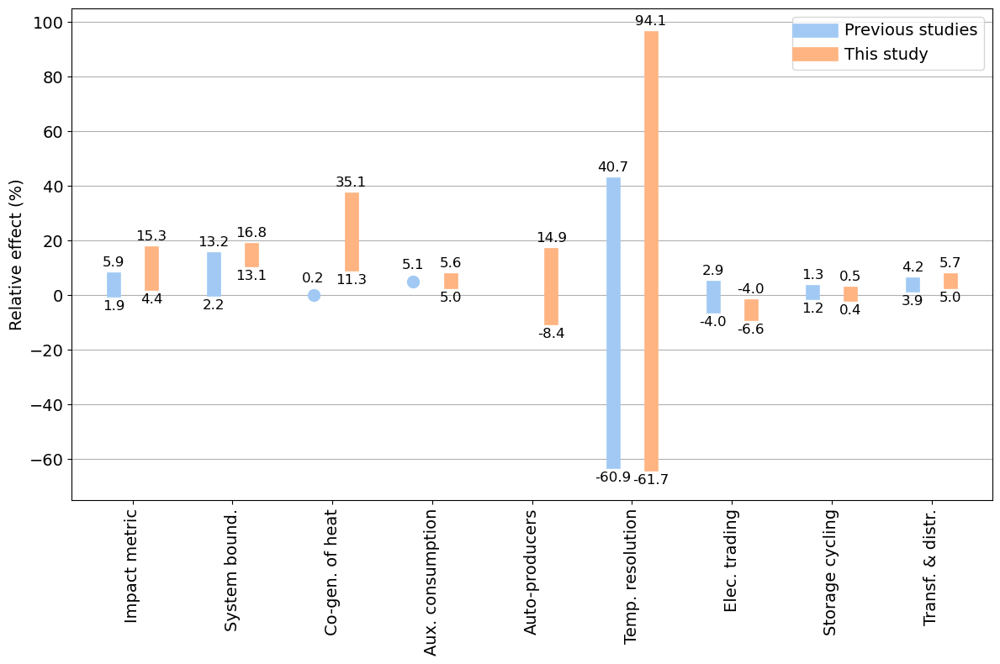

In [7]:
# plot: relative effects, this study vs. previous studies

# Categories
categories = [
    "Impact metric",
    "System bound.",
    "Co-gen. of heat",
    "Aux. consumption",
    "Auto-producers",
    "Temp. resolution",
    "Elec. trading",
    "Storage cycling",
    "Transf. & distr."
]

# Data for previous studies and this study
previous_study_data = {
    "Impact metric": (1.9, 5.9),
    "System bound.": (2.2, 13.2),
    "Co-gen. of heat": (0.2, 0.2),
    "Aux. consumption": (5.1, 5.1),
    "Auto-producers": None,
    "Temp. resolution": (-60.9, 40.7),
    "Elec. trading": (-4.0, 2.9),
    "Storage cycling": (1.2, 1.3),
    "Transf. & distr.": (3.9, 4.2)
}

this_study_data = {
    "Impact metric": (4.4, 15.3),
    "System bound.": (13.1, 16.8),
    "Co-gen. of heat": (11.3, 35.1),
    "Aux. consumption": (5.0, 5.6),
    "Auto-producers": (-8.4, 14.9),
    "Temp. resolution": (-61.7, 94.1),
    "Elec. trading": (-6.6, -4.0),
    "Storage cycling": (0.4, 0.5),
    "Transf. & distr.": (5.0, 5.7)
}

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plotting
bar_width = 0.38
index = np.arange(len(categories))
label_offset = 6  # vertical distance between the bar and the label
line_width = 12

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel", 2)  # Blue and Orange

def plot_data(data, color, offset):
    min_visible_height = 0.3  # minimum visible height for the vertical line
    
    for i, category in enumerate(categories):
        range_data = data.get(category, (None, None))
        if range_data:
            low, high = range_data
            position = index[i] + offset
            display_low = low
            display_high = high
            
            # If the height of the vertical line is too small, extend it just for display
            if high - low < min_visible_height:
                delta = (min_visible_height - (high - low)) / 2
                display_low = low - delta
                display_high = high + delta
                
            if low == high:
                ax.scatter(position, high, color=color, s=100, zorder=3)
                ax.text(position, high + label_offset, f'{high}', ha='center', va='center', fontsize=12)
            else:
                ax.plot([position, position], [display_low, display_high], color=color, linewidth=line_width, zorder=3)  # Use display_low and display_high
                ax.text(position, display_low - label_offset, f'{low}', ha='center', va='center', fontsize=12)  # Use display_low
                ax.text(position, display_high + label_offset, f'{high}', ha='center', va='center', fontsize=12)  # Use display_high


# "Previous study" bars
plot_data(previous_study_data, colors[0], -bar_width/2)

# "This study" bars
plot_data(this_study_data, colors[1], bar_width/2)

# Styling
ax.set_ylabel('Relative effect (%)', fontsize=14)
ax.set_xticks(index)
ax.set_xticklabels(categories, rotation=90, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.grid(axis='y')
ax.set_ylim([-75, 105])

# Explicitly set the legend with custom handles and labels
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=colors[0], lw=line_width, label='Previous studies'),
                   Line2D([0], [0], color=colors[1], lw=line_width, label='This study')]
ax.legend(handles=legend_elements, fontsize=14)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'validation', 'ef_validation_literature' + '.png')
plt.savefig(plot_path)

plt.show()